<a href="https://colab.research.google.com/github/JulioLaz/movie_analysis/blob/development/Movie_Analysis_JAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**PROBLEMA DE NEGOCIO**


---




##Una plataforma de streaming para el hogar, con presencia en todo el mundo, necesita impulsar su rendimiento utilizando datos de tendencias en el sector de manera estratégica. Como científico de datos especializado en la industria del entretenimiento, has sido convocado para analizar estos datos y ofrecer insights que guíen sus decisiones y respondan a las siguientes preguntas clave:

### **Preguntas**

1. ¿Cual es la evolución del rating por tipo de contenido?

2. ¿Cual es el rating promedio por género?

3. ¿Cuáles son los géneros que proporcionan mayor roi?

4. ¿Cuáles son los países con mayor producción de contenido?

5. ¿Cual es tu recomendación para el cliente?

### **Kaggle:**

1. https://www.kaggle.com/datasets/rounakbanik/the-movies-dataset?select=movies_metadata.csv

2. https://www.kaggle.com/datasets/ashirwadsangwan/imdb-dataset

3. https://www.kaggle.com/datasets/asaniczka/tmdb-movies-dataset-2023-930k-movies


#**1. Configuración del Ambiente**


---




In [ ]:
# !python -V
# print('------')
# !pip show Pandas | grep 'Name\|Version'
# print('------')
# !pip show Matplotlib | grep 'Name\|Version'

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# Python 3.10.12
# ------
# Name: pandas
# Version: 2.0.3
# ------
# Name: matplotlib
# Version: 3.7.1

In [1]:
def init_project():
    global warnings, np, pd, plt, ticker, sns, dd, drive, df_title_basics, df_title_ratings, df_tmdb, path_img

    import warnings
    import numpy as np
    import pandas as pd
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.float_format', '{:.3f}'.format)
    import matplotlib.pyplot as plt
    import matplotlib.patheffects as patheffects
    import matplotlib.ticker as ticker
    import seaborn as sns
    import dask.dataframe as dd
    from google.colab import drive
    from wordcloud import WordCloud
    import warnings
    warnings.filterwarnings('ignore')
    drive.mount('/content/drive')
    path_img = 'https://i0.wp.com/image.tmdb.org/t/p/w300'

init_project()

Mounted at /content/drive


##  Subir de tu cuenta kaggle el archivo kaggle.json
1. Ve a tu perfil de Kaggle y descarga API key (kaggle.json).
2. En Colab, sube el archivo kaggle.json. Puedes hacerlo haciendo clic en el ícono de carpeta a la izquierda, luego en el ícono de subir (archivo con una flecha hacia arriba).

In [4]:
# Subir el archivo kaggle.json desde donde lo guardaste:
from google.colab import files

files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


In [5]:
### NOMBRE DE LA CARPETA DE KAGGLE:
### ingresar nombre despues de las url https://www.kaggle.com/datasets/.........
# !kaggle datasets download -d ashirwadsangwan/imdb-dataset  ### 2Gigabyte
# !unzip imdb-dataset.zip

# !kaggle datasets download -d rounakbanik/the-movies-dataset  ### 239megabyte
# !unzip the-movies-dataset.zip

# # https://www.kaggle.com/datasets/asaniczka/tmdb-movies-dataset-2023-930k-movies
!kaggle datasets download -d asaniczka/tmdb-movies-dataset-2023-930k-movies  ### 193megabyte
!unzip tmdb-movies-dataset-2023-930k-movies.zip

Dataset URL: https://www.kaggle.com/datasets/asaniczka/tmdb-movies-dataset-2023-930k-movies
License(s): ODC Attribution License (ODC-By)
100% 193M/194M [00:11<00:00, 22.9MB/s]
100% 194M/194M [00:11<00:00, 17.9MB/s]
Archive:  tmdb-movies-dataset-2023-930k-movies.zip
  inflating: TMDB_movie_dataset_v11.csv  


#**2. Obtención, Tratamiento y Análisis Exploratório (EDA)**


---




##**2.1 Cargando las bases de datos**

In [4]:
df_title_basics = dd.read_csv(r'/content/title.basics.tsv', dtype={'isAdult': 'object', 'runtimeMinutes': 'object', 'startYear': 'object'}, delimiter='\t', low_memory=False)
df_title_basics.head(10)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892,\N,5,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"
5,tt0000006,short,Chinese Opium Den,Chinese Opium Den,0,1894,\N,1,Short
6,tt0000007,short,Corbett and Courtney Before the Kinetograph,Corbett and Courtney Before the Kinetograph,0,1894,\N,1,"Short,Sport"
7,tt0000008,short,Edison Kinetoscopic Record of a Sneeze,Edison Kinetoscopic Record of a Sneeze,0,1894,\N,1,"Documentary,Short"
8,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,\N,45,Romance
9,tt0000010,short,Leaving the Factory,La sortie de l'usine Lumière à Lyon,0,1895,\N,1,"Documentary,Short"


In [ ]:
df_title_basics.shape[0].compute()

10843834

In [ ]:
df_title_basics[df_title_basics.tconst == "tt10872600"].compute()

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
645107,tt10872600,movie,Spider-Man: No Way Home,Spider-Man: No Way Home,0,2021,\N,148,"Action,Adventure,Fantasy"


In [12]:
df_title_ratings = dd.read_csv(r'/content/title.ratings.tsv', delimiter='\t', low_memory=False)
df_title_ratings.head(10)

,tconst,averageRating,numVotes
0,tt0000001,5.700,2059
1,tt0000002,5.600,277
2,tt0000003,6.500,2023
3,tt0000004,5.300,180
4,tt0000005,6.200,2787
5,tt0000006,5.100,187
6,tt0000007,5.400,872
7,tt0000008,5.400,2202
8,tt0000009,5.400,212
9,tt0000010,6.800,7594


In [ ]:
df_title_ratings.shape[0].compute()

1446041

In [ ]:
df_title_ratings[df_title_ratings.tconst == "tt10872600"].compute()

,tconst,averageRating,numVotes
510389,tt10872600,8.200,886954


In [80]:
df_tmdb = dd.read_csv(r'/content/TMDB_movie_dataset_v11.csv', low_memory=False)
df_tmdb.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,160000000,https://www.warnerbros.com/movies/inception,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc..."
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,165000000,http://www.interstellarmovie.net/,tt0816692,en,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,..."
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,185000000,https://www.warnerbros.com/movies/dark-knight/,tt0468569,en,The Dark Knight,Batman raises the stakes in his war on crime. ...,130.643,/qJ2tW6WMUDux911r6m7haRef0WH.jpg,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f..."
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,237000000,https://www.avatar.com/movies/avatar,tt0499549,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",79.932,/kyeqWdyUXW608qlYkRqosgbbJyK.jpg,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ..."
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,220000000,https://www.marvel.com/movies/the-avengers,tt0848228,en,The Avengers,When an unexpected enemy emerges and threatens...,98.082,/RYMX2wcKCBAr24UyPD7xwmjaTn.jpg,Some assembly required.,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com..."


In [ ]:
df_tmdb.shape[0].compute()

1052432

In [ ]:
df_tmdb[df_tmdb.imdb_id == "tt10872600"].compute()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages,keywords
57,634649,Spider-Man: No Way Home,7.990,18299,Released,2021-12-15,1921847111,148,False,/14QbnygCuTO0vl7CAFmPf1fgZfV.jpg,200000000,https://www.spidermannowayhome.movie,tt10872600,en,Spider-Man: No Way Home,Peter Parker is unmasked and no longer able to...,186.065,/5weKu49pzJCt06OPpjvT80efnQj.jpg,The Multiverse unleashed.,"Action, Adventure, Science Fiction","Marvel Studios, Pascal Pictures, Columbia Pict...",United States of America,"English, Tagalog","new york city, hero, showdown, magic, loss of ..."


##**2.2 Tratamiento de Datos**

In [ ]:
df_title_basics.shape[0].compute()

10843834

### Ver frecuencia de titletype:

In [7]:
df_titleType_frec = df_title_basics.titleType.value_counts(normalize=True).compute()
df_titleType_frec =  pd.DataFrame(df_titleType_frec)
df_titleType_frec.reset_index(inplace=True)
df_titleType_frec

,titleType,proportion
0,tvEpisode,0.766
1,short,0.092
2,movie,0.063
3,video,0.027
4,tvSeries,0.024
5,tvMovie,0.014
6,tvMiniSeries,0.005
7,tvSpecial,0.004
8,videoGame,0.004
9,tvShort,0.001


## Graf pai de la frecuencia de titleType:

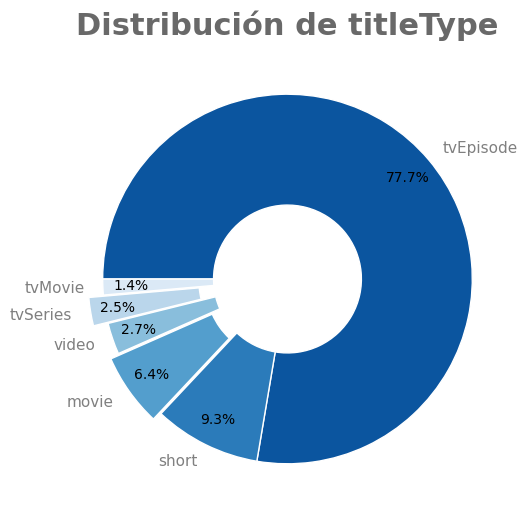

In [8]:
# Calcular el porcentaje de proportion para cada marca
df_titleType_frec['Porcentaje'] = df_titleType_frec['proportion'] / df_titleType_frec['proportion'].sum() * 100

greater = df_titleType_frec[df_titleType_frec['Porcentaje'] >= 0.9].copy()
greater = greater.sort_values(by='proportion', ascending=False)
colors = sns.color_palette('Blues_r', len(greater))
label_props = {'fontsize': 10, 'color': 'gray'}

fig, axs = plt.subplots(figsize=(10, 6),facecolor='none')
axs.set_facecolor('none')
axs.set_aspect('equal')
explode = [0,0,0.05,0,.08,0]
wedges, texts, autotexts = axs.pie(
    greater['proportion'],
    autopct='%1.1f%%',
    labels=greater['titleType'],
    textprops=label_props,
    pctdistance=0.85,
    startangle=180,
    wedgeprops=dict(width=0.6, edgecolor='w'),
    colors=colors,
    explode=explode,
    counterclock=False
)

# porcentajes:
for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(10)
    # autotext.set_fontweight('bold')

# Etiquetas:
for text in texts:
    text.set_color('gray')
    text.set_fontsize(11)
    # text.set_fontweight('bold')

title = 'Distribución de titleType'
axs.set_title(title, fontsize=22, color='dimgray', fontweight='bold', pad=10)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_frec_titleType.png', dpi=300, transparent=True)
plt.show()


## Seleccionar tvSeries y movie.Convertir df a pandas.dataframe:


In [9]:
# seleccionar reducir el tamaño del df_title_basic selecioanando de la col titleType solamente 'movie' y 'tvSeries'
df_title_basics = df_title_basics[df_title_basics.titleType.isin(['movie', 'tvSeries'])] #titleType
df_title_basics.shape[0].compute()

948347

In [10]:
# convertir df_title_basics a pandas DataFrame
df_title_basics_pandas_movie_tvSeries = df_title_basics.compute()
df_title_basics_pandas_movie_tvSeries.shape

(948347, 9)

In [11]:
df_title_basics_pandas_movie_tvSeries.head(1)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
8,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,\N,45,Romance


## Eliminar duplicates and NaN:

In [12]:
# Eliminar todas las duplicados y NaN:
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries.drop_duplicates()
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries.drop_duplicates(subset=['tconst', 'originalTitle'])
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries.dropna(subset=['tconst', 'originalTitle'])
df_title_basics_pandas_movie_tvSeries.shape #(493133, 7)

(948345, 9)

## Eliminar valores \N:

In [13]:
# Eliminar las filas del df_title_basics_pandas_movie_tvSeries cuyas filas de runtimeMinutes tienen \N
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.runtimeMinutes != '\\N']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.startYear != '\\N']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.genres != '\\N']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.tconst != '\\N']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.originalTitle != '\\N']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.primaryTitle != '\\N']
df_title_basics_pandas_movie_tvSeries.shape

(493133, 9)

## Seleccionar filas convenientes:
* se eliminan ['primaryTitle','endYear']

In [14]:
# Descartar las columns=['primaryTitle','endYear']:
columns=['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres']
df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries[columns]
df_title_basics_pandas_movie_tvSeries.head(1)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres
8,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,45,Romance


### Comparar title original con primary:
**Ver cuantas veces permanece el mismo title y cuantas veces cambia!**

* primaryTitle (string): the more popular title / the title used by
the filmmakers on promotional materials at the point of release.
* originalTitle (string) - original title, in the original language.

In [15]:
df=df_title_basics_pandas_movie_tvSeries.copy()
df['titles_match'] = df['primaryTitle'] == df['originalTitle']
different_titles = df[df['titles_match'] == False]
print('DF con tvSeries y Movie completo',len(df))
print('DF con different_titles',len(different_titles))
different_titles

DF con tvSeries y Movie completo 493133
DF con different_titles 81509


In [ ]:
title_counts = df['primaryTitle'].value_counts()
repeated_primaryTitle= title_counts[title_counts > 20]
title_counts = df['originalTitle'].value_counts()
repeated_originalTitle = title_counts[title_counts > 20]
print('primaryTitle', repeated_primaryTitle[0:10])
print('repeated_originalTitle', repeated_originalTitle[0:10])


In [ ]:
different_titles.head()

## Reducir memoria:

### Convertir la columna titleType a int8
* **movie=1**
* **tvSeries=0**

In [ ]:
# Mapeo:
# mapping = {'movie': 1, 'tvSeries': 0}

# Aplicamos el mapeo a la columna 'titleType' y convertimos a int8
# df_title_basics_pandas_movie_tvSeries['titleType'] = df_title_basics_pandas_movie_tvSeries['titleType'].map(mapping).astype('int8')
# df_title_basics_pandas_movie_tvSeries.info()


In [ ]:
df_title_basics_pandas_movie_tvSeries.titleType.unique()

In [ ]:
# converitr a typo int las columnas: isAdult('int8'),
df_title_basics_pandas_movie_tvSeries['isAdult'] = df_title_basics_pandas_movie_tvSeries['isAdult'].astype('int8')
df_title_basics_pandas_movie_tvSeries['runtimeMinutes'] = df_title_basics_pandas_movie_tvSeries['runtimeMinutes'].astype('int32')
df_title_basics_pandas_movie_tvSeries['startYear'] = df_title_basics_pandas_movie_tvSeries['startYear'].astype('int16')

In [ ]:
df_title_basics_pandas_movie_tvSeries.info()

In [ ]:
# originalTitle
# df_title_basics_pandas_movie_tvSeries.originalTitle.value_counts()
len(df_title_basics_pandas_movie_tvSeries.originalTitle.unique())


## Elimino duplicates de originalTitle:

In [ ]:
# df_title_basics_pandas_movie_tvSeries = df_title_basics_pandas_movie_tvSeries.drop_duplicates(subset=['originalTitle'])
# df_title_basics_pandas_movie_tvSeries.shape

In [ ]:
duplicate_titles = df_title_basics_pandas_movie_tvSeries['originalTitle'].value_counts()
duplicates = duplicate_titles[duplicate_titles > 1]
print('Duplicados en originaTitle =',len(duplicates))


In [ ]:
df_title_basics_pandas_movie_tvSeries.info()

## Guardar el df de title_basic:
**df_title_basics_pandas_movie_tvSeries.csv**

---



In [ ]:
# /content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis
df_title_basics_pandas_movie_tvSeries.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv', index=False)


### Abrir

In [3]:
df_title_basics_pandas_movie_tvSeries=pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv')

In [ ]:
df_title_basics_pandas_movie_tvSeries.head(2)

In [ ]:
origianlTitle_duplicates=df_title_basics_pandas_movie_tvSeries.originalTitle.value_counts()
origianlTitle_duplicates_up = origianlTitle_duplicates[origianlTitle_duplicates>10]
origianlTitle_duplicates_up.head(10)

In [ ]:
df_title_basics_pandas_movie_tvSeries_fil =df_title_basics_pandas_movie_tvSeries[df_title_basics_pandas_movie_tvSeries.originalTitle=='Love']
print(len(df_title_basics_pandas_movie_tvSeries_fil))
df_title_basics_pandas_movie_tvSeries_fil


# SEGUNDA DDBB: df_title_rating

In [ ]:
df_title_ratings.head(1)

In [13]:
df_title_ratings.shape[0].compute()

1446041


## Elimnar duplicates y NaN:

In [14]:
# Eliminar todas las duplicados y NaN:
df_title_ratings = df_title_ratings.drop_duplicates()
df_title_ratings = df_title_ratings.drop_duplicates(subset=['tconst'], keep='first')
df_title_ratings = df_title_ratings.dropna(subset=['tconst'])
df_title_ratings.shape[0].compute()

1446041

## Seleccionar del df_title_ratings los codigos de la columna 'tconst'=tt.... que coinciden con los del df_basic_pandas

In [15]:
### Filtrar  y pasar el df a pandas ###

# Convertir la columna tconst de df_title_basics_pandas_movie_tvSeries a un set para una comparación eficiente
tconst_basics_set = set(df_title_basics_pandas_movie_tvSeries['tconst'])

# Definir una función para filtrar cada partición de df_title_ratings
def filter_partitions(partition, tconst_basics_set):
    return partition[partition['tconst'].isin(tconst_basics_set)]

# Aplicar la función de filtro a cada partición del DataFrame de Dask
filtered_df_title_ratings = df_title_ratings.map_partitions(filter_partitions, tconst_basics_set)
filtered_df_title_ratings = filtered_df_title_ratings.compute() # convertir a DataFrame de Pandas
filtered_df_title_ratings.head()

,tconst,averageRating,numVotes
8,tt0000009,5.400,212
144,tt0000147,5.200,516
372,tt0000574,6.000,907
381,tt0000591,5.400,24
434,tt0000679,5.300,74


## Reduce memory:

In [16]:
filtered_df_title_ratings.averageRating=filtered_df_title_ratings.averageRating.astype('float16')
filtered_df_title_ratings.numVotes=filtered_df_title_ratings.numVotes.astype('int32')
filtered_df_title_ratings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 325912 entries, 8 to 1446036
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   tconst         325912 non-null  string 
 1   averageRating  325912 non-null  float16
 2   numVotes       325912 non-null  int32  
dtypes: float16(1), int32(1), string(1)
memory usage: 8.5 MB


## DDBB completa sin filtrar lo codigos tt que corresponden a tvSeries y movie:

In [17]:
df_title_ratings_pandas = df_title_ratings.compute() # convertir a DataFrame de Pandas
df_title_ratings_pandas.averageRating=df_title_ratings_pandas.averageRating.astype('float16')
df_title_ratings_pandas.numVotes=df_title_ratings_pandas.numVotes.astype('int32')
df_title_ratings_pandas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1446041 entries, 0 to 1446040
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   tconst         1446041 non-null  string 
 1   averageRating  1446041 non-null  float16
 2   numVotes       1446041 non-null  int32  
dtypes: float16(1), int32(1), string(1)
memory usage: 26.5 MB


In [18]:
df_title_ratings_pandas_movie_tvSeries = filtered_df_title_ratings.copy()

## Guardar el df de title_rating:
**fitrada**:
* **df_title_ratings_pandas_movie_tvSeries.csv**

**Con todas las columnas**:
* **df_title_ratings_pandas.csv**

---



In [19]:
# DDBB filtrada
filtered_df_title_ratings.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_ratings_pandas_movie_tvSeries.csv', index=False)
# DDBB con todos los titleType
df_title_ratings_pandas.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_ratings_pandas.csv', index=False)

In [20]:
df_title_ratings_pandas.shape

(1446041, 3)

## Merge entre:
* df_title_basics_pandas_movie_tvSeries
* df_title_ratings_pandas

**Merged:**
* **df_basic_rating.csv**

In [21]:
#unir df_title_basics_pandas_movie_tvSeries y df_title_ratings_pandas por la col tconst:
df_merged_basic_rating = pd.merge(df_title_basics_pandas_movie_tvSeries, df_title_ratings_pandas, on='tconst', how='inner')
df_merged_basic_rating.shape

(325912, 10)

In [22]:
df=df_merged_basic_rating.copy()
df_fil = df[df.originalTitle=='Love']
print(len(df_fil))
df_fil.head()

17


,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres,averageRating,numVotes
2846,tt0018107,movie,Love,Love,0,1927,82,"Drama,Romance",6.801,1185
47360,tt0084271,movie,Love,Love,0,1982,105,Drama,5.500,42
125378,tt0384293,movie,Love,Love,0,2003,104,Drama,6.000,43
126708,tt0392360,movie,Love,Love,0,1991,152,"Drama,Musical,Romance",6.000,1646
134713,tt0450363,movie,Love,Love,0,2005,90,"Drama,Thriller",5.699,421


## Guardar Merge:
* **df_basic_rating.csv**

In [23]:
df_merged_basic_rating.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv', index=False)

In [37]:
df_merged_basic_rating = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv')

# Tercer DDBB: df_title_rating

## Tratar la columnas 'budget' and 'revenue': eliminar los valores menores a 0.

In [81]:
# Elimina los registros de df_tmdb donde 'budget' y 'revenue' sean menores o iguales a cero.
df_tmdb = df_tmdb[(df_tmdb['budget'] > 0) & (df_tmdb['revenue'] > 0)]
# df_tmdb.shape[0].compute()

###Pasar a pandas dataframe:

In [82]:
df_tmdb= df_tmdb.compute()
df_tmdb.shape

(13584, 24)

## Tratar columnas:
* Cambio el nombre de la columna id= 'imbd'a 'tconst'
* Selecciono columnas convenientes.
* Creo la columna roi.

In [83]:
# reducir el df a las col:'imdb_id', 'release_date', 'budget', 'revenue', 'genres', 'production_countries', 'vote_average', 'roi':
df_tmdb['tconst']=df_tmdb['imdb_id'] ## unidicacion de codigos de las fuentes de DDBB de TMDB Y IMDB
df_tmdb['roi'] = (df_tmdb['revenue'] - df_tmdb['budget']) / df_tmdb['budget']
df_tmdb['profit']=df_tmdb['revenue']-df_tmdb['budget']
df_tmdb_all = df_tmdb.copy()

columns_0= ['tconst', 'release_date', 'budget', 'revenue', 'genres', 'production_countries', 'vote_average','roi']
df_tmdb = df_tmdb[columns_0]
columns_1= ['tconst', 'original_title','vote_average', 'release_date', 'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'original_language',  'keywords',
       'popularity', 'poster_path', 'genres', 'production_companies', 'production_countries', 'roi','profit']
df_tmdb_all = df_tmdb_all[columns_1]
# Crear la col roi:
print('df_tmdb: ', df_tmdb.shape)
print('df_tmdb_all: ', df_tmdb_all.shape)

df_tmdb:  (13584, 8)
df_tmdb_all:  (13584, 18)


In [84]:
df_tmdb_all.columns

Index(['tconst', 'original_title', 'vote_average', 'release_date', 'revenue',
       'runtime', 'adult', 'backdrop_path', 'budget', 'original_language',
       'keywords', 'popularity', 'poster_path', 'genres',
       'production_companies', 'production_countries', 'roi', 'profit'],
      dtype='object')


## Elimnar duplicates y NaN:

In [85]:
def clean_dataframe(df, subset_column):
    # df = df.drop_duplicates()
    df = df.drop_duplicates(subset=[subset_column])
    df = df.dropna(subset=[subset_column])
    # df = df.dropna()
    return df

df_tmdb = clean_dataframe(df_tmdb, 'tconst')
df_tmdb_all = clean_dataframe(df_tmdb_all, 'tconst')

print('df_tmdb: ', df_tmdb.shape)
print('df_tmdb_all: ', df_tmdb_all.shape)

df_tmdb:  (10864, 8)
df_tmdb_all:  (10864, 18)


In [ ]:
df_tmdb_all.info()

## Seleccionar del df_title_ratings los codigos de la columna 'tconst'=tt.... que coinciden con los del df_basic_pandas

In [86]:
### Filtrar  ###
df_title_basics_pandas_movie_tvSeries= pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv')


# Convertir la columna tconst de df_title_basics_pandas_movie_tvSeries a un set para una comparación eficiente
tconst_basics_set = set(df_title_basics_pandas_movie_tvSeries['tconst'])

# Filtrar df_tmdb para incluir solo las filas cuyo 'tconst' esté en tconst_basics_set
filtered_df_tmdb = df_tmdb[df_tmdb['tconst'].isin(tconst_basics_set)]
filtered_df_tmdb_all = df_tmdb_all[df_tmdb_all['tconst'].isin(tconst_basics_set)]

print('filtered_df_tmdb:', filtered_df_tmdb.shape)
print('~'*70)
print('filtered_df_tmdb_all:', filtered_df_tmdb_all.shape)

filtered_df_tmdb: (9877, 8)
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
filtered_df_tmdb_all: (9877, 18)


In [87]:
filtered_df_tmdb = filtered_df_tmdb.dropna()
filtered_df_tmdb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9604 entries, 0 to 161449
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9604 non-null   string 
 1   release_date          9604 non-null   string 
 2   budget                9604 non-null   int64  
 3   revenue               9604 non-null   int64  
 4   genres                9604 non-null   string 
 5   production_countries  9604 non-null   string 
 6   vote_average          9604 non-null   float64
 7   roi                   9604 non-null   float64
dtypes: float64(2), int64(2), string(4)
memory usage: 1.1 MB


In [19]:
filtered_df_tmdb_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9877 entries, 0 to 161449
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9877 non-null   string 
 1   original_title        9877 non-null   string 
 2   vote_average          9877 non-null   float64
 3   release_date          9829 non-null   string 
 4   revenue               9877 non-null   int64  
 5   runtime               9877 non-null   int64  
 6   adult                 9877 non-null   bool   
 7   backdrop_path         9259 non-null   string 
 8   budget                9877 non-null   int64  
 9   original_language     9877 non-null   string 
 10  keywords              8828 non-null   string 
 11  popularity            9877 non-null   float64
 12  poster_path           9779 non-null   string 
 13  genres                9811 non-null   string 
 14  production_companies  9491 non-null   string 
 15  production_countries  96

In [25]:
# filtered_df_tmdb_all.dropna(inplace=True)
# filtered_df_tmdb_all.info()

## Limpiar duplicados y NaN:

In [88]:
#eliminar duplicates y nan:
filtered_df_tmdb = filtered_df_tmdb.drop_duplicates()
filtered_df_tmdb = filtered_df_tmdb.dropna()
filtered_df_tmdb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9604 entries, 0 to 161449
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9604 non-null   string 
 1   release_date          9604 non-null   string 
 2   budget                9604 non-null   int64  
 3   revenue               9604 non-null   int64  
 4   genres                9604 non-null   string 
 5   production_countries  9604 non-null   string 
 6   vote_average          9604 non-null   float64
 7   roi                   9604 non-null   float64
dtypes: float64(2), int64(2), string(4)
memory usage: 1.1 MB


## Tratar columna roi:

In [ ]:
# ver outliers de col roi:
filtered_df_tmdb = filtered_df_tmdb.reset_index(drop=True)
sns.boxplot(x=filtered_df_tmdb['roi'])

In [ ]:
roi_descriptive_stats = filtered_df_tmdb['roi'].describe()
print(roi_descriptive_stats)

In [89]:
# LIMITAR EL roi: mínimo=-1 y maximo 10:
filtered_df_tmdb = filtered_df_tmdb[(filtered_df_tmdb['roi'] >= -1) & (filtered_df_tmdb['roi'] <= 10)]
filtered_df_tmdb.roi.describe()
filtered_df_tmdb_all = filtered_df_tmdb_all[(filtered_df_tmdb_all['roi'] >= -1) & (filtered_df_tmdb_all['roi'] <= 10)]
print('filtered_df_tmdb.roi.describe(): ', filtered_df_tmdb.roi.describe())
print('filtered_df_tmdb_all.roi.describe(): ', filtered_df_tmdb_all.roi.describe())

filtered_df_tmdb.roi.describe():  count   8942.000
mean       1.317
std        2.316
min       -1.000
25%       -0.408
50%        0.600
75%        2.273
max       10.000
Name: roi, dtype: float64
filtered_df_tmdb_all.roi.describe():  count   9192.000
mean       1.295
std        2.310
min       -1.000
25%       -0.420
50%        0.580
75%        2.232
max       10.000
Name: roi, dtype: float64


In [27]:
filtered_df_tmdb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8942 entries, 0 to 161449
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                8942 non-null   string 
 1   release_date          8942 non-null   string 
 2   budget                8942 non-null   int64  
 3   revenue               8942 non-null   int64  
 4   genres                8942 non-null   string 
 5   production_countries  8942 non-null   string 
 6   vote_average          8942 non-null   float64
 7   roi                   8942 non-null   float64
dtypes: float64(2), int64(2), string(4)
memory usage: 1.0 MB


## Reduce memory:

In [28]:
filtered_df_tmdb_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9192 entries, 0 to 161449
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9192 non-null   string 
 1   original_title        9192 non-null   string 
 2   vote_average          9192 non-null   float64
 3   release_date          9154 non-null   string 
 4   revenue               9192 non-null   int64  
 5   runtime               9192 non-null   int64  
 6   adult                 9192 non-null   bool   
 7   backdrop_path         8620 non-null   string 
 8   budget                9192 non-null   int64  
 9   original_language     9192 non-null   string 
 10  keywords              8214 non-null   string 
 11  popularity            9192 non-null   float64
 12  poster_path           9109 non-null   string 
 13  genres                9135 non-null   string 
 14  production_companies  8838 non-null   string 
 15  production_countries  89

In [90]:
filtered_df_tmdb.vote_average = filtered_df_tmdb.vote_average.astype('float16')
filtered_df_tmdb.roi = filtered_df_tmdb.roi.astype('float16')
filtered_df_tmdb['revenue_mll'] = filtered_df_tmdb['revenue']/1e6
filtered_df_tmdb['budget_mll'] = filtered_df_tmdb['budget']/1e6
filtered_df_tmdb['budget_mll'] = filtered_df_tmdb['budget_mll'].astype('uint16')
filtered_df_tmdb['revenue_mll'] = filtered_df_tmdb['revenue_mll'].astype('uint8')
filtered_df_tmdb['roi'] = filtered_df_tmdb['roi'].astype('float16')
filtered_df_tmdb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8942 entries, 0 to 161449
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                8942 non-null   string 
 1   release_date          8942 non-null   string 
 2   budget                8942 non-null   int64  
 3   revenue               8942 non-null   int64  
 4   genres                8942 non-null   string 
 5   production_countries  8942 non-null   string 
 6   vote_average          8942 non-null   float16
 7   roi                   8942 non-null   float16
 8   revenue_mll           8942 non-null   uint8  
 9   budget_mll            8942 non-null   uint16 
dtypes: float16(2), int64(2), string(4), uint16(1), uint8(1)
memory usage: 961.3 KB


In [91]:
filtered_df_tmdb_all.vote_average = filtered_df_tmdb_all.vote_average.astype('float16')
filtered_df_tmdb_all.roi = filtered_df_tmdb_all.roi.astype('float16')
filtered_df_tmdb_all['revenue_mll'] = filtered_df_tmdb_all['revenue']/1e6
filtered_df_tmdb_all['budget_mll'] = filtered_df_tmdb_all['budget']/1e6
filtered_df_tmdb_all['budget_mll'] = filtered_df_tmdb_all['budget_mll'].astype('uint16')
filtered_df_tmdb_all['revenue_mll'] = filtered_df_tmdb_all['revenue_mll'].astype('uint8')
filtered_df_tmdb_all['roi'] = filtered_df_tmdb_all['roi'].astype('float16')
filtered_df_tmdb_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9192 entries, 0 to 161449
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9192 non-null   string 
 1   original_title        9192 non-null   string 
 2   vote_average          9192 non-null   float16
 3   release_date          9154 non-null   string 
 4   revenue               9192 non-null   int64  
 5   runtime               9192 non-null   int64  
 6   adult                 9192 non-null   bool   
 7   backdrop_path         8620 non-null   string 
 8   budget                9192 non-null   int64  
 9   original_language     9192 non-null   string 
 10  keywords              8214 non-null   string 
 11  popularity            9192 non-null   float64
 12  poster_path           9109 non-null   string 
 13  genres                9135 non-null   string 
 14  production_companies  8838 non-null   string 
 15  production_countries  89

## PAsar a type datetime la col: release_date:

In [92]:
# convertir la col release_date a datetime:
filtered_df_tmdb['release_date'] = pd.to_datetime(filtered_df_tmdb['release_date'])
filtered_df_tmdb_all['release_date'] = pd.to_datetime(filtered_df_tmdb_all['release_date'])
print(filtered_df_tmdb.info())
print(filtered_df_tmdb_all.info())

<class 'pandas.core.frame.DataFrame'>
Index: 8942 entries, 0 to 161449
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tconst                8942 non-null   string        
 1   release_date          8942 non-null   datetime64[ns]
 2   budget                8942 non-null   int64         
 3   revenue               8942 non-null   int64         
 4   genres                8942 non-null   string        
 5   production_countries  8942 non-null   string        
 6   vote_average          8942 non-null   float16       
 7   roi                   8942 non-null   float16       
 8   revenue_mll           8942 non-null   uint8         
 9   budget_mll            8942 non-null   uint16        
dtypes: datetime64[ns](1), float16(2), int64(2), string(3), uint16(1), uint8(1)
memory usage: 907.8 KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 9192 entries, 0 to 161449
Data columns (total 2

In [100]:
df_tmdb_pandas = filtered_df_tmdb.copy()
df_tmdb_all_pandas = filtered_df_tmdb_all.copy()

## Guardar df de tmdb:
* **df_tmdb_pandas.csv**

In [101]:
# Guardar en drive:
filtered_df_tmdb.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_tmdb_pandas.csv', index=False)
filtered_df_tmdb_all.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_tmdb_all_pandas.csv', index=False)

In [102]:
df_tmdb_all_pandas=pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_tmdb_all_pandas.csv')
df_tmdb_all_pandas.columns

Index(['tconst', 'original_title', 'vote_average', 'release_date', 'revenue',
       'runtime', 'adult', 'backdrop_path', 'budget', 'original_language',
       'keywords', 'popularity', 'poster_path', 'genres',
       'production_companies', 'production_countries', 'roi', 'profit',
       'revenue_mll', 'budget_mll'],
      dtype='object')

## Merge entre:
* df_merged_basic_rating
* df_tmdb_pandas

In [104]:
#unir df_title_basics_pandas_movie_tvSeries y df_title_ratings_pandas por la col tconst:
# df_merged_basic_rating =pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv')
df_merged_basic_rating_tmdb = pd.merge(df_merged_basic_rating, df_tmdb_pandas, on='tconst', how='inner')
df_merged_basic_rating_tmdb_all = pd.merge(df_merged_basic_rating, df_tmdb_all_pandas, on='tconst', how='inner')

print('df_merged_basic_rating_tmdb.shape:', df_merged_basic_rating_tmdb.shape)
print('df_merged_basic_rating_tmdb.shape:', df_merged_basic_rating_tmdb.columns)
print('df_merged_basic_rating_tmdb_all.shape:', df_merged_basic_rating_tmdb_all.shape)
print('df_merged_basic_rating_tmdb_all.shape:', df_merged_basic_rating_tmdb_all.columns)

df_merged_basic_rating_tmdb.shape: (8897, 19)
df_merged_basic_rating_tmdb.shape: Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes',
       'release_date', 'budget', 'revenue', 'genres_y', 'production_countries',
       'vote_average', 'roi', 'revenue_mll', 'budget_mll'],
      dtype='object')
df_merged_basic_rating_tmdb_all.shape: (9108, 29)
df_merged_basic_rating_tmdb_all.shape: Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes',
       'original_title', 'vote_average', 'release_date', 'revenue', 'runtime',
       'adult', 'backdrop_path', 'budget', 'original_language', 'keywords',
       'popularity', 'poster_path', 'genres_y', 'production_companies',
       'production_countries', 'roi', 'profit', 'revenue_mll', 'budget_mll'],
      dtype='object')


In [105]:
# Guardar en drive:
df_merged_basic_rating_tmdb.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv', index=False)
df_merged_basic_rating_tmdb_all.to_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv', index=False)

In [106]:
# abrir de driva:
df_merged_basic_rating_tmdb=pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')
df_merged_basic_rating_tmdb_all=pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')

In [107]:
df_merged_basic_rating_tmdb_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9108 entries, 0 to 9107
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tconst                9108 non-null   object 
 1   titleType             9108 non-null   object 
 2   primaryTitle          9108 non-null   object 
 3   originalTitle         9108 non-null   object 
 4   isAdult               9108 non-null   int64  
 5   startYear             9108 non-null   int64  
 6   runtimeMinutes        9108 non-null   int64  
 7   genres_x              9108 non-null   object 
 8   averageRating         9108 non-null   float64
 9   numVotes              9108 non-null   int64  
 10  original_title        9108 non-null   object 
 11  vote_average          9108 non-null   float64
 12  release_date          9087 non-null   object 
 13  revenue               9108 non-null   int64  
 14  runtime               9108 non-null   int64  
 15  adult                

# Mostrar INFO de las tres DDBB:

In [2]:
df_title_basics_pandas_movie_tvSeries = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv')
df_title_ratings_pandas_movie_tvSeries = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_ratings_pandas_movie_tvSeries.csv')
df_title_ratings_pandas = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_ratings_pandas.csv')
df_tmdb_pandas = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_tmdb_pandas.csv')

print('df_title_basics_pandas_movie_tvSeries')
print('Columns:', df_title_basics_pandas_movie_tvSeries.columns)
print('-'*40)
print(df_title_basics_pandas_movie_tvSeries.info())
print('-'*70)
print('df_title_ratings_pandas_movie_tvSeries')
print('Columns:', df_title_ratings_pandas_movie_tvSeries.columns)
print('-'*40)
print(df_title_ratings_pandas_movie_tvSeries.info())
print('-'*70)
print('df_title_ratings_pandas')
print('Columns:', df_title_ratings_pandas.columns)
print('-'*40)
print(df_title_ratings_pandas.info())
print('-'*70)
print('df_tmdb_pandas')
print('Columns:', df_tmdb_pandas.columns)
print('-'*40)
print(df_tmdb_pandas.info())

df_title_basics_pandas_movie_tvSeries
Columns: Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres'],
      dtype='object')
----------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 493133 entries, 0 to 493132
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   tconst          493133 non-null  object
 1   titleType       493133 non-null  object
 2   primaryTitle    493133 non-null  object
 3   originalTitle   493133 non-null  object
 4   isAdult         493133 non-null  int64 
 5   startYear       493133 non-null  int64 
 6   runtimeMinutes  493133 non-null  int64 
 7   genres          493133 non-null  object
dtypes: int64(3), object(5)
memory usage: 30.1+ MB
None
----------------------------------------------------------------------
df_title_ratings_pandas_movie_tvSeries
Columns: Index(['tconst', 'averageRating'

In [26]:
df_title_basics_pandas_movie_tvSeries.head(1)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres
0,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,45,Romance


In [29]:
df_title_ratings_pandas_movie_tvSeries.head(1)

,tconst,averageRating,numVotes
0,tt0000009,5.400,212


In [28]:
df_tmdb_pandas.head(1)

,tconst,release_date,budget,revenue,genres,production_countries,vote_average,roi,profit,poster_path,adult,revenue_mll,budget_mll
0,tt1375666,2010-07-15,160000000,825532764,"Action, Science Fiction, Adventure","United Kingdom, United States of America",8.370,4.160,665532764,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,False,57,160


##**2.3 Análisis Exploratorio (EDA)**

In [21]:
df_merged_basic_rating_tmdb =pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')

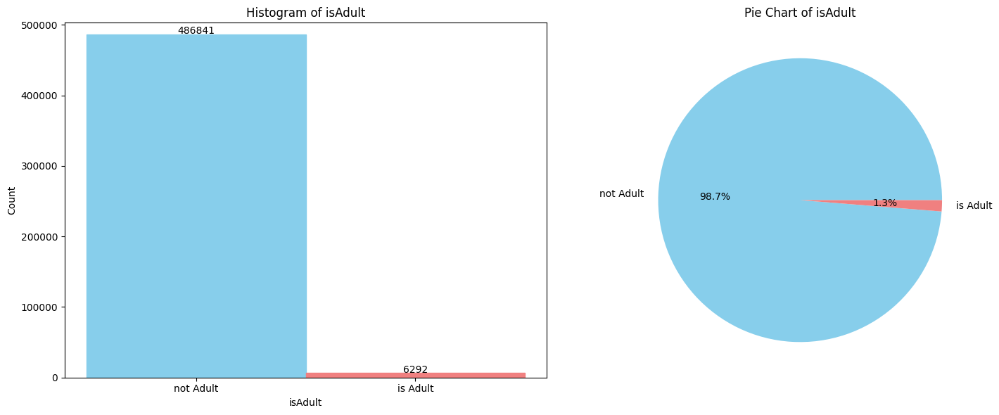

In [28]:
# Histograma
df = df = df_title_basics_pandas_movie_tvSeries
var= 'isAdult'
fig, axs = plt.subplots(1, 2, figsize=(15, 6))
colors = ['skyblue', 'lightcoral']
ax = sns.histplot(df[var], bins=2, kde=False, ax=axs[0], color=colors[0])
axs[0].set_title(f'Histogram of {var}')
axs[0].set_ylim(0, df[var].count() + 10000)
axs[0].set_xticks([0.25, 0.75])
axs[0].set_xticklabels(['not Adult', 'is Adult'])
bars = ax.patches
for i, bar in enumerate(bars):
    bar.set_color(colors[i])
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2., height + 500, '{:1.0f}'.format(height), ha="center")
df_counts = df[var].value_counts()
axs[1].pie(df_counts, labels=['not Adult', 'is Adult'], autopct='%1.1f%%', colors=colors)
axs[1].set_title(f'Pie Chart of {var}')
plt.box(False)
plt.grid(False)
plt.tight_layout()
plt.show()

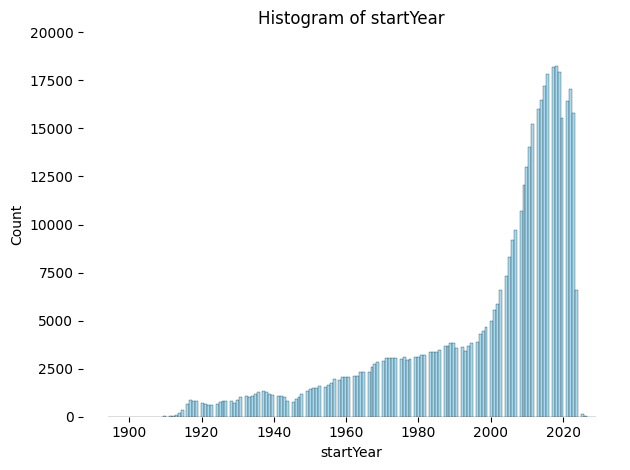

In [46]:
# Histograma
df = df = df_title_basics_pandas_movie_tvSeries
var=  'startYear'#'runtimeMinutes',
ax = plt.plot(figsize=(16, 6))
colors = ['skyblue', 'lightcoral']
ax = sns.histplot(df[var], kde=False, color=colors[0])
ax.set_title(f'Histogram of {var}')
ax.set_ylim(0, 2e4)
plt.box(False)
plt.grid(False)
plt.tight_layout()
plt.show()

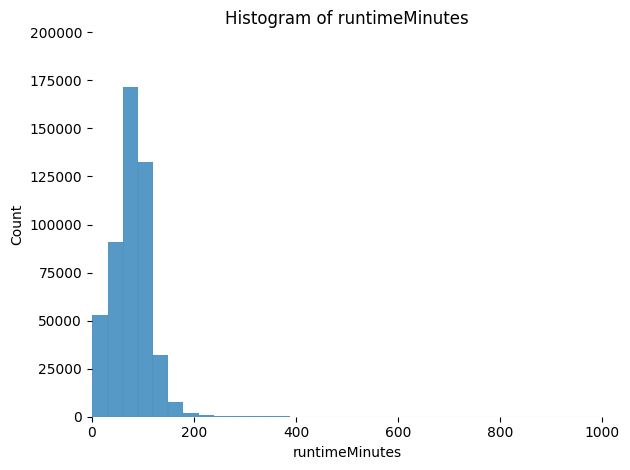

In [15]:
# Histograma
df = df = df_title_basics_pandas_movie_tvSeries
var=  'runtimeMinutes'
ax = plt.plot(figsize=(16, 6))
colors = ['skyblue', 'lightcoral']
ax = sns.histplot(df[var],bins=2000)
ax.set_title(f'Histogram of {var}')
ax.set_ylim(0, 200000)
ax.set_xlim(0, 1000)
plt.box(False)
plt.grid(False)
plt.tight_layout()
plt.show()

## **Graficar histograma para Basic**
* **df_title_basics_pandas_movie_tvSeries:**

---



## **Graficar histograma para Rating:**

* **df_title_ratings_pandas_movie_tvSeries:**
---

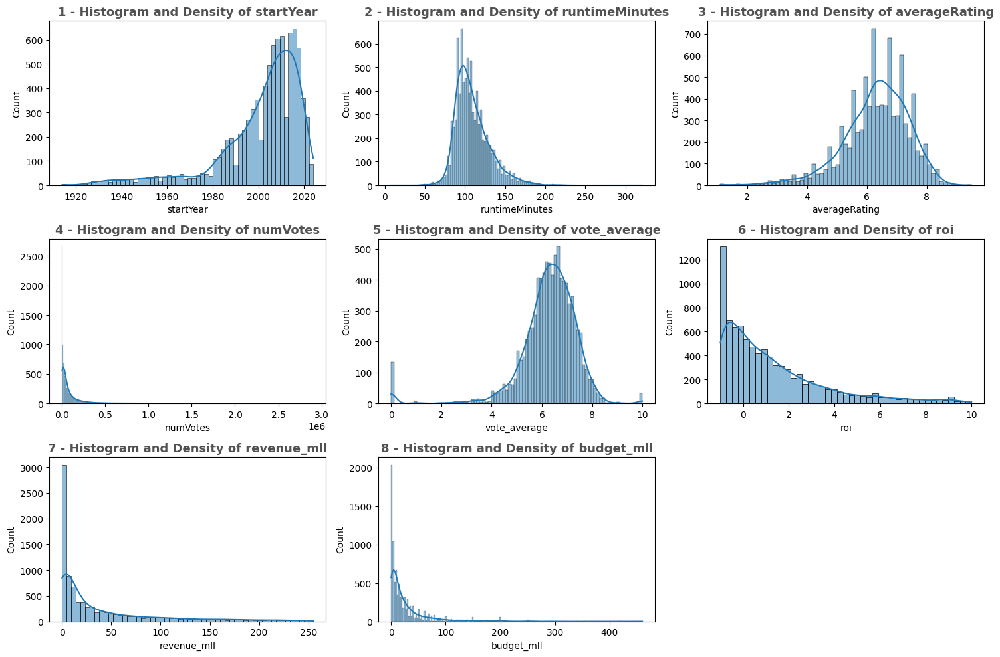

In [75]:
# df_merged_basic_rating_tmdb =pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')
plt.figure(figsize=(15, 10),facecolor='none')
numeric_cols = ['startYear', 'runtimeMinutes', 'averageRating', 'numVotes', 'vote_average', 'roi', 'revenue_mll', 'budget_mll']

for i, col in enumerate(numeric_cols):
    plt.subplot(3, 3, i+1)
    sns.histplot(df_merged_basic_rating_tmdb[col], kde=True)
    plt.title(f'{i+1} - Histogram and Density of {col}', color='#515151',fontweight='bold',fontsize=13)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/histogramas_analysis.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()


##Histograms:
1.   **startYear:**  La distribución de startYear nos muestra la concentración de valores entre los años 2000 y 2020. Crece de forma exponencial hasta 2010 aprox. y luego disminución en los años posteriores.

2.   **rumTimeMinutes:** La distribución de rumTimeMinutes nos muestra una notable concentración alrededor de 100 minutos.

3.   **averageRating:** La distribución de averageRating nos muestra una concentración en 6.5 aprox. presentando gran simetría.

4.   **numVotes:** La distribución de numVotes nos muestra una concentración en 0 aproximadamente. presentando gran asimetría con decaimiento exponencial.

5.   **vote_average:** La distribución de vote_average nos muestra una concentración en 7 aprox. presentando gran simetría.

6.   **roi:**  La distribución de roi nos muestra una concentración en 0 aproximadamente. presentando asimetría con decaimiento exponencial.

7.   **revenue_mll:**  La distribución de revenue_mll nos muestra una concentración en 0 aproximadamente. presentando gran asimetría con decaimiento exponencial.

8.   **budget_mll:**  La distribución de budget_mll nos muestra una concentración en 0 aproximadamente. presentando gran asimetría con decaimiento exponencial.



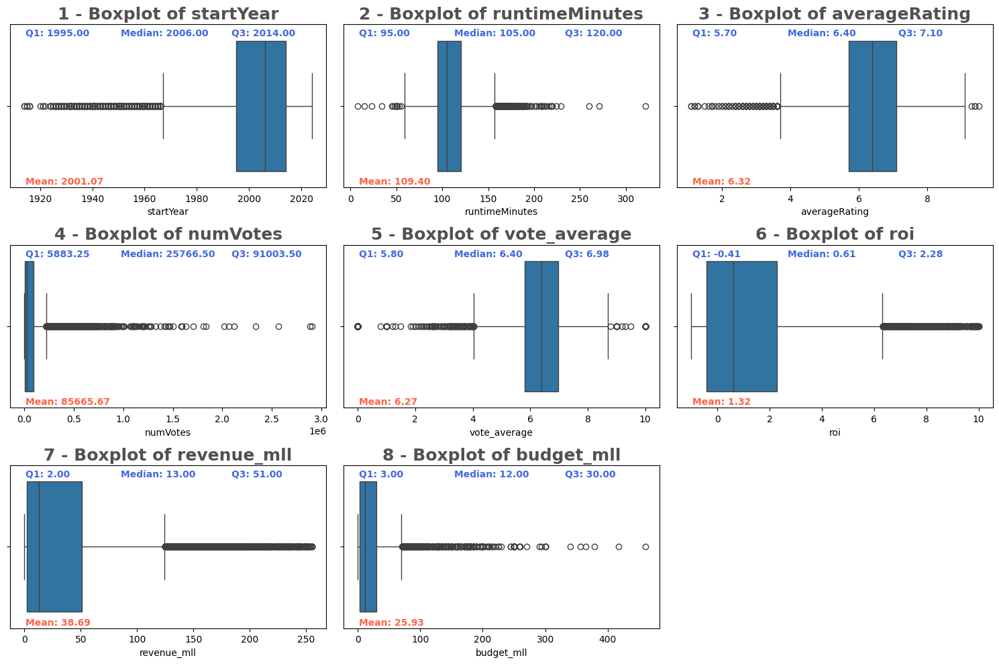

In [72]:
df_merged_basic_rating_tmdb =pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')
numeric_cols = ['startYear', 'runtimeMinutes', 'averageRating', 'numVotes', 'vote_average', 'roi', 'revenue_mll', 'budget_mll']

plt.figure(figsize=(15, 10), facecolor='none')

for i, col in enumerate(numeric_cols):
    plt.subplot(3, 3, i+1)
    sns.boxplot(x=df_merged_basic_rating_tmdb[col])
    plt.title(f'{i+1} - Boxplot of {col}', color='#515151',fontweight='bold',fontsize=18)

    q1 = df_merged_basic_rating_tmdb[col].quantile(0.25)
    median = df_merged_basic_rating_tmdb[col].median()
    mean = df_merged_basic_rating_tmdb[col].mean()
    q3 = df_merged_basic_rating_tmdb[col].quantile(0.75)

    plt.text(0.05, 0.93, f'Q1: {q1:.2f}', transform=plt.gca().transAxes, color='royalblue',fontweight='bold')
    plt.text(.35, 0.93, f'Median: {median:.2f}', transform=plt.gca().transAxes, color='royalblue',fontweight='bold')
    plt.text(.7, 0.93, f'Q3: {q3:.2f}', transform=plt.gca().transAxes, color='royalblue',fontweight='bold')
    plt.text(.05, 0.02, f'Mean: {mean:.2f}', transform=plt.gca().transAxes, color='tomato',fontweight='bold')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/boxplots_analysis.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

##Boxplots:
1.   **startYear:**  La distribución de startYear nos muestra la concentración de valores entre los años 1995 y 2014 con una mediana en 2006, lo cual sugiere una disminución en los anos posteriores. los outliers estan por debajo del bigote inferior 1965 aprox. presenta una distribución asimétrica demostrada por la diferencia entre mean y median.

2.   **rumTimeMinutes:** La distribución de rumTimeMinutes nos muestra la concentración de valores entre los minutos 95 y 120 con una mediana en 105. los outliers estan por debajo y por arriba de los bigotes, pero con mayor tendencia sobre el superior. presenta una distribución levemente asimétrica demostrada por la pequeña diferencia entre mean y median.

3.   **averageRating:** La distribución de averageRating nos muestra la concentración de valores entre 5.7 y 7.1 con una mediana en 6.4. los outliers estan por debajo y por arriba de los bigotes, pero con mayor tendencia sobre el inferior. presenta una distribución casi simétrica demostrada por la pequeña diferencia entre mean=6.32 y median=6.4.

5.   **vote_average:** La distribución de vote_average nos muestra la concentración de valores entre 5.8 y 6.98 con una mediana en 6.40. los outliers estan por debajo y por arriba de los bigotes, pero con mayor tendencia sobre el inferior. presenta una distribución casi simétrica demostrada por la pequeña diferencia entre mean=6.27 y median=6.40.

6.   **roi:**  La distribución de roi nos muestra la concentración de valores entre -0.41 y 2.28 con una mediana en 0.61. los outliers estan por arriba del bigote superor (6 en adelante aprox.). presenta una distribución asimétrica demostrada por la diferencia entre mean=1.32 y median=0.61.

7.   **revenue_mll:**  La distribución de revenue_mll nos muestra la concentración de valores entre los $2mll y $51mll con una mediana en $13mll. los outliers estan por arriba del bigote superor (125 en adelante aprox.). presenta una distribución asimétrica demostrada por la diferencia entre mean=38.7 y median=13.

8.   **budget_mll:**  La distribución de budget_mll nos muestra la concentración de valores entre los $3 mll y $30 mll con una mediana en $12 mll. los outliers estan por arriba del bigote superor (125 en adelante aprox.). presenta una distribución asimétrica demostrada por la diferencia entre mean=25.9 y median=12.



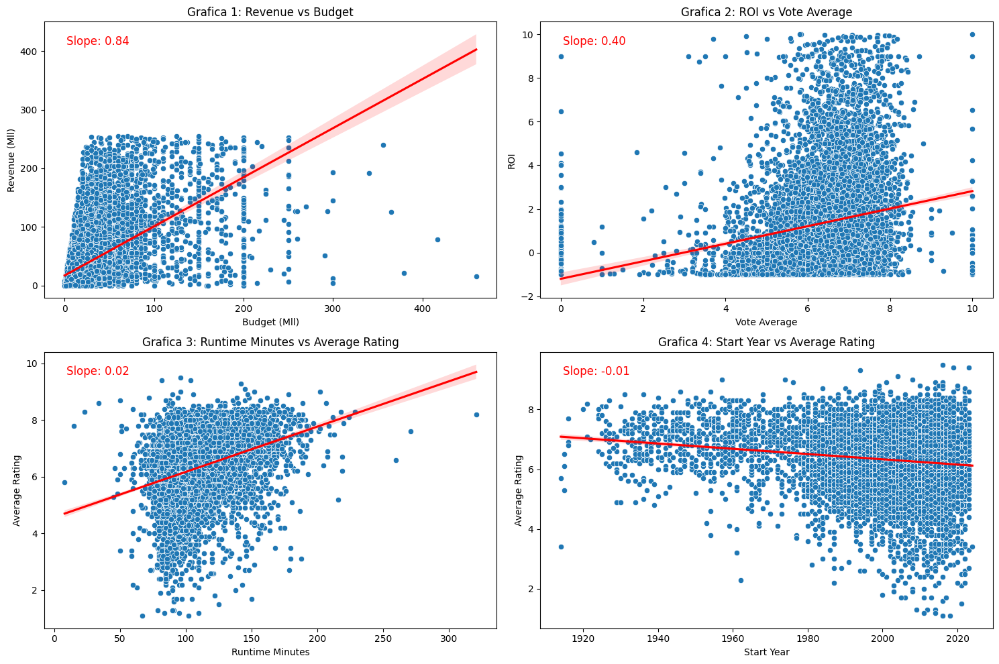

In [78]:
import numpy as np
from sklearn.linear_model import LinearRegression

def plot_with_slope(x, y, data, xlabel, ylabel, title, ax): # Función para calcular y mostrar la pendiente
    sns.scatterplot(x=x, y=y, data=data, ax=ax)
    sns.regplot(x=x, y=y, data=data, scatter=False, color='red', ax=ax)

    X = data[x].values.reshape(-1, 1)
    Y = data[y].values
    reg = LinearRegression().fit(X, Y)
    slope = reg.coef_[0]

    ax.text(0.05, 0.95, f'Slope: {slope:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top', color='red')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

plt.figure(figsize=(15, 10), facecolor='none')

ax1 = plt.subplot(2, 2, 1)
plot_with_slope('budget_mll', 'revenue_mll', df_merged_basic_rating_tmdb, 'Budget (Mll)', 'Revenue (Mll)', 'Grafica 1: Revenue vs Budget', ax1)

ax2 = plt.subplot(2, 2, 2)
plot_with_slope('vote_average', 'roi', df_merged_basic_rating_tmdb, 'Vote Average', 'ROI', 'Grafica 2: ROI vs Vote Average', ax2)

ax3 = plt.subplot(2, 2, 3)
plot_with_slope('runtimeMinutes', 'averageRating', df_merged_basic_rating_tmdb, 'Runtime Minutes', 'Average Rating', 'Grafica 3: Runtime Minutes vs Average Rating', ax3)

ax4 = plt.subplot(2, 2, 4)
plot_with_slope('startYear', 'averageRating', df_merged_basic_rating_tmdb, 'Start Year', 'Average Rating', 'Grafica 4: Start Year vs Average Rating', ax4)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/scatterplots_analysis.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


##Gráficas:

1. **Grafica 1: Revenue vs Budget**
  la relación entre budget y revenue muestra una linea de tendencia positiva con una pendiente 0.84. lo que sugiere gran proporcionalidad entre ambas variables.

2. **Grafica 2: roi vs Vote Average**
  la relación entre roi y vote average muestra una linea de tendencia positiva con una pendiente 0.40. lo que sugiere que al aumentar el promedio de los votos aumenta levemente el roi.

3. **Grafica 3: Runtime Minutes vs Average Rating**
  la relación entre Runtime Minutes vs Average Rating muestra una linea de tendencia con una pendiente próxima a 0 (slope=0.02). lo que sugiere que las variables tienen una relación positiva pero muy pequeña.

4. **Grafica 4: Start Year vs Average Rating**
  la relación entre Start Year y Average Rating muestra una linea de tendencia con una pendiente próxima a 0 (slope=-0.01). lo que sugiere que las variables tienen una relación negativa pero muy pequeña.

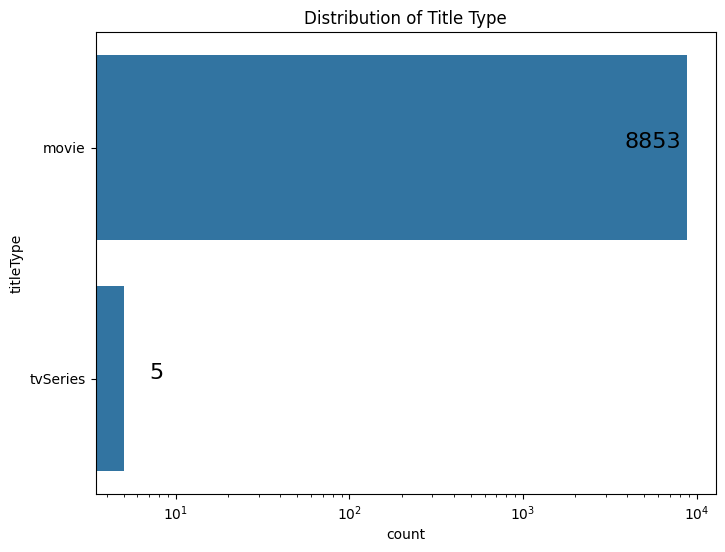

In [32]:
plt.figure(figsize=(8, 6),facecolor='none')

sns.countplot(y='titleType', data=df_merged_basic_rating_tmdb, order=df_merged_basic_rating_tmdb['titleType'].value_counts().index)
plt.title('Distribution of Title Type')

title_counts = df_merged_basic_rating_tmdb['titleType'].value_counts()
for i, (title_type, count) in enumerate(title_counts.items()):
  if i == 0:
    plt.text(count - 5e3, i, f'{str(count)}',fontsize=16)
  else:
    plt.text(count +2, i, str(count),fontsize=16)

plt.xscale('log')
title_types = ['movie','tvSeries']
plt.yticks(ticks=range(len(title_counts)), labels=title_types)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/countplot_analysis.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()

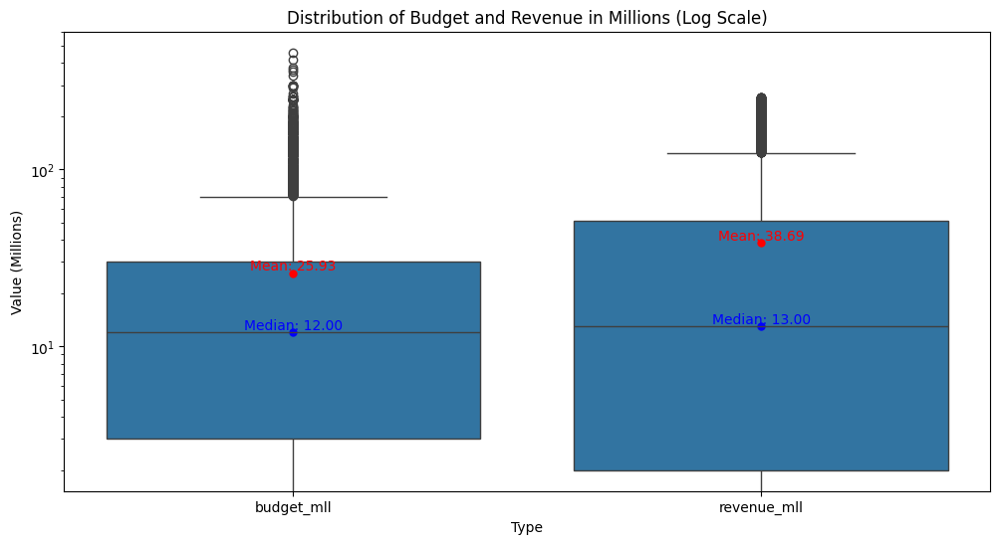

In [33]:
budget_revenue_df = df_merged_basic_rating_tmdb[['budget_mll', 'revenue_mll']].melt(var_name='Type', value_name='Value')

plt.figure(figsize=(12, 6), facecolor='none')
sns.boxplot(x='Type', y='Value', data=budget_revenue_df)
plt.yscale('log')
plt.title('Distribution of Budget and Revenue in Millions (Log Scale)')
plt.xlabel('Type')
plt.ylabel('Value (Millions)')

# Calcular y añadir la media y la mediana
for type_ in budget_revenue_df['Type'].unique():
    subset = budget_revenue_df[budget_revenue_df['Type'] == type_]
    mean = subset['Value'].mean()
    median = subset['Value'].median()

    # Añadir la media
    plt.plot([type_], [mean], marker='o', markersize=5, color='red')
    plt.text(x=type_, y=mean, s=f'Mean: {mean:.2f}', horizontalalignment='center', verticalalignment='bottom', color='red')

    # Añadir la mediana
    plt.plot([type_], [median], marker='o', markersize=5, color='blue')
    plt.text(x=type_, y=median, s=f'Median: {median:.2f}', horizontalalignment='center', verticalalignment='bottom', color='blue')
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/boxplot_analysis_budget_revenue.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()


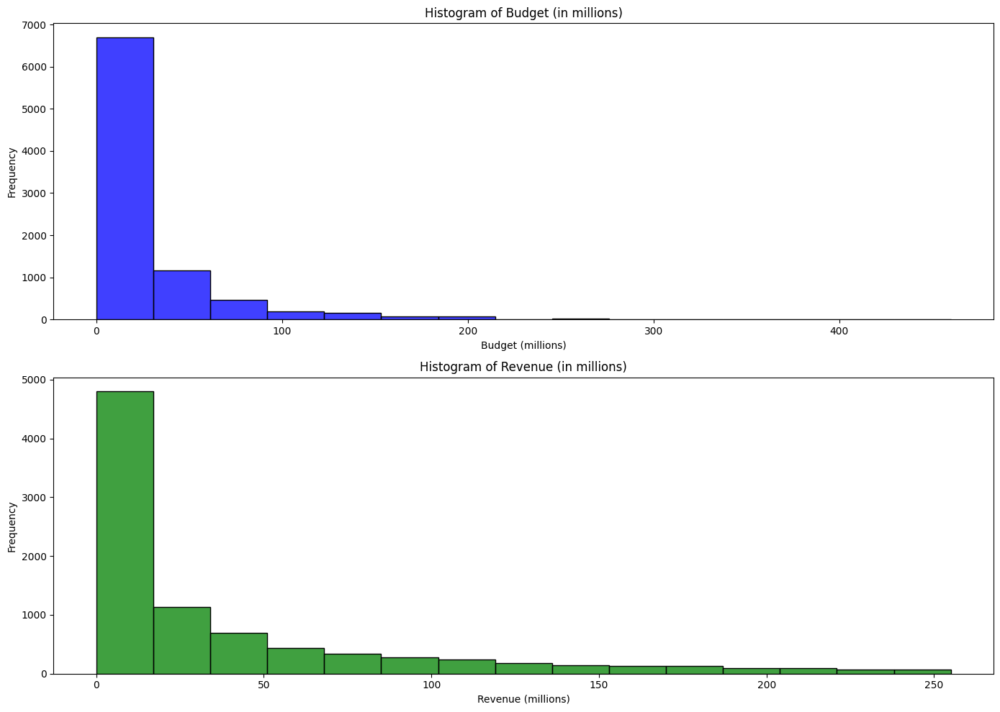

In [35]:
# Histograma
fig, axs = plt.subplots(2, figsize=(14, 10),facecolor='none')
sns.histplot(df_merged_basic_rating_tmdb['budget_mll'], bins=15, kde=False, ax=axs[0], color='blue')
axs[0].set_title('Histogram of Budget (in millions)')
axs[0].set_xlabel('Budget (millions)')
axs[0].set_ylabel('Frequency')

sns.histplot(df_merged_basic_rating_tmdb['revenue_mll'], bins=15, kde=False, ax=axs[1], color='green')
axs[1].set_title('Histogram of Revenue (in millions)')
axs[1].set_xlabel('Revenue (millions)')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/histogram_analysis_budget_revenue.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()


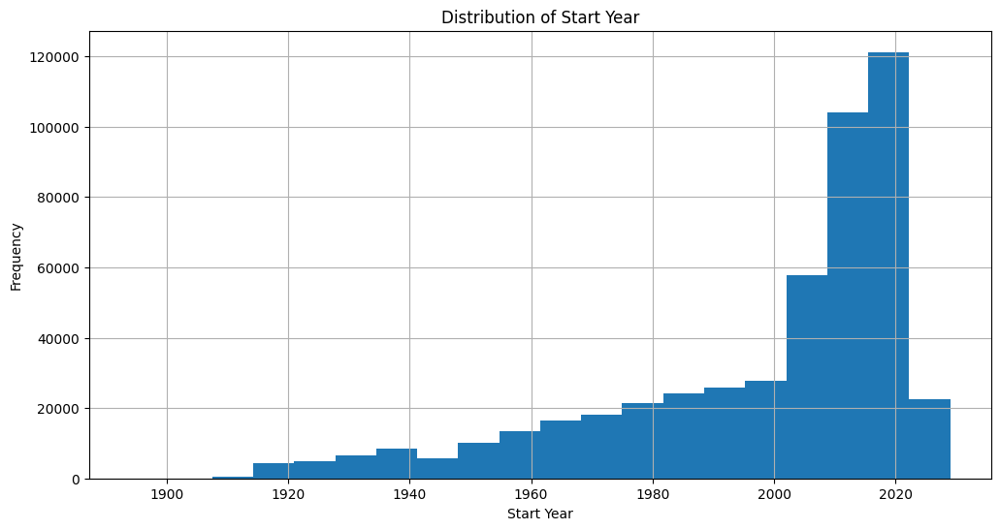

In [39]:
df_title_basics_pandas_movie_tvSeries = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv')
df_title_basics_pandas_movie_tvSeries.head()
df=df_title_basics_pandas_movie_tvSeries.copy()
plt.figure(figsize=(12, 6),facecolor='none')
df['startYear'].hist(bins=20)
plt.xlabel('Start Year')
plt.ylabel('Frequency')
plt.title('Distribution of Start Year')
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/histograma_startYear.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()

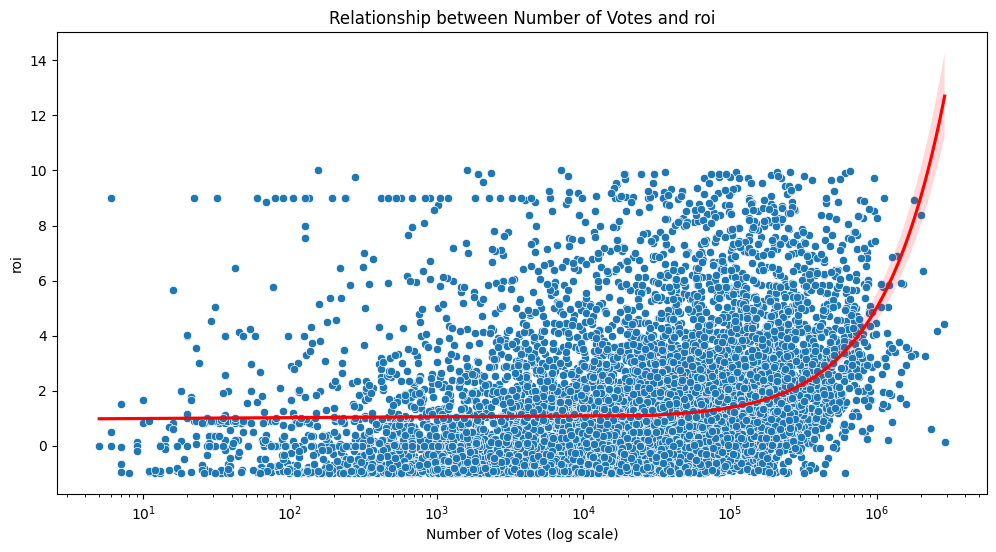

In [40]:
plt.figure(figsize=(12, 6),facecolor='none')
sns.scatterplot(x='numVotes', y='roi', data=df_merged_basic_rating_tmdb)
sns.regplot(x='numVotes', y='roi', data=df_merged_basic_rating_tmdb, scatter=False, color='red')
plt.xscale('log')  # Escala logarítmica en el eje x para mejor visualización
plt.title('Relationship between Number of Votes and roi')
plt.xlabel('Number of Votes (log scale)')
plt.ylabel('roi')
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/scatterplot_numVotes_roi.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()

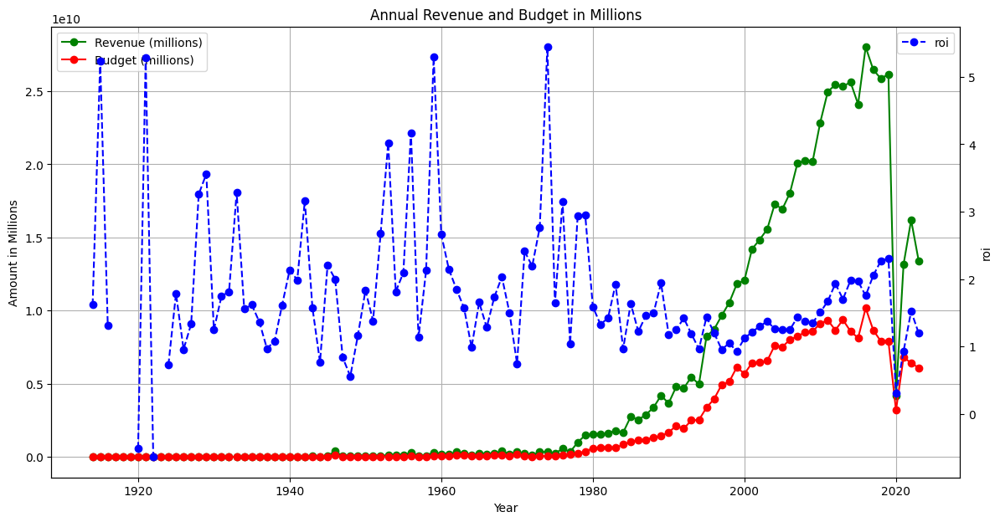

In [48]:
# Graficar la serie temporal de 'revenue_mll' y 'budget_mll' por año
df_merged_basic_rating_tmdb_date = df_merged_basic_rating_tmdb.copy()

df_merged_basic_rating_tmdb_date['release_date'] = pd.to_datetime(df_merged_basic_rating_tmdb_date['release_date'])
df_merged_basic_rating_tmdb_date.set_index('release_date', inplace=True)
annual_revenue = df_merged_basic_rating_tmdb_date.resample('Y').sum()['revenue']
annual_budget = df_merged_basic_rating_tmdb_date.resample('Y').sum()['budget']

annual_roi = (annual_revenue - annual_budget) / annual_budget

fig, ax1 = plt.subplots(figsize=(14, 7),facecolor='none')
ax1.plot(annual_revenue.index.year, annual_revenue, marker='o', color='green', label='Revenue (millions)')
ax1.plot(annual_budget.index.year, annual_budget, marker='o', color='red', linestyle='-', label='Budget (millions)')
ax1.set_title('Annual Revenue and Budget in Millions')
ax1.set_xlabel('Year')
ax1.set_ylabel('Amount in Millions')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(annual_roi.index.year, annual_roi, marker='o', color='blue', linestyle='--', label='roi')
ax2.set_ylabel('roi')
ax2.legend(loc='upper right')
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/lineplot_revenue_budget_roi.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

#**3. Preguntas y respuestas**


---




##**Pregunta 1: ¿Cual es la evolución del rating por tipo de contenido?**

In [ ]:
#@title
df_merged_basic_rating_tmdb.head()

In [43]:
df_merged_basic_rating.head()

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,45,Romance,5.400,212
1,tt0000147,movie,The Corbett-Fitzsimmons Fight,The Corbett-Fitzsimmons Fight,0,1897,100,"Documentary,News,Sport",5.200,516
2,tt0000574,movie,The Story of the Kelly Gang,The Story of the Kelly Gang,0,1906,70,"Action,Adventure,Biography",6.000,907
3,tt0000591,movie,The Prodigal Son,L'enfant prodigue,0,1907,90,Drama,5.400,24
4,tt0000679,movie,The Fairylogue and Radio-Plays,The Fairylogue and Radio-Plays,0,1908,120,"Adventure,Fantasy",5.300,74


In [ ]:
df_merged_basic_rating.shape

In [55]:
df_merged_basic_rating = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv')
avg_rating_by_year_type = df_merged_basic_rating.groupby(['startYear', 'titleType'])['averageRating'].mean().reset_index()
# Establecer rango de años desde 1990 a 2025 en la col startYear:
avg_rating_by_year_type_lim = avg_rating_by_year_type[(avg_rating_by_year_type['startYear'] >= 1990) & (avg_rating_by_year_type['startYear'] <= 2025)]

avg_rating_by_year_type_lim.head(5)

,startYear,titleType,averageRating
142,1990,movie,5.965
143,1990,tvSeries,7.017
144,1991,movie,6.047
145,1991,tvSeries,6.957
146,1992,movie,6.058


In [12]:
df_merged_basic_rating.titleType.value_counts(normalize=True)

titleType
movie      0.843
tvSeries   0.157
Name: proportion, dtype: float64

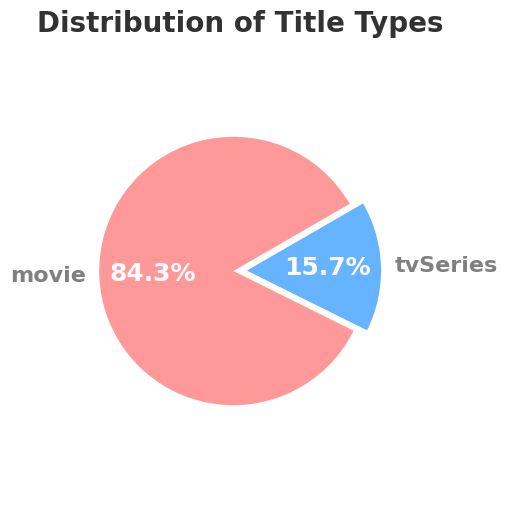

In [29]:
# Graf Pai:
title_counts = df_merged_basic_rating['titleType'].value_counts()

plt.figure(figsize=(4, 6),facecolor='none')
explode = (0.1, 0)
colors = ['#ff9999', '#66b3ff']
wedges, texts, autotexts = plt.pie(title_counts, labels=title_counts.index, autopct='%1.1f%%', startangle=30, colors=colors, explode=explode)

for text in texts:
    text.set_color('gray')
    text.set_fontweight('bold')
    text.set_fontsize(16)

for autotext in autotexts:
    autotext.set_color('snow')
    autotext.set_fontweight('bold')
    autotext.set_fontsize(18)

plt.title('Distribution of Title Types', fontsize=20, color='#323232', fontweight='bold')
plt.axis('equal')
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/pie_analysis_types.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()


In [58]:
df=avg_rating_by_year_type_lim.copy()
df_type_movie = df[df['titleType'] == 'movie']
df_type_tvSeries = df[df['titleType'] == 'tvSeries']
# haz merge entre df_type_tvSeries y df_type_movies por la col startYear:
df_type_movie_tvSeries_merge = df_type_movie.merge(df_type_tvSeries, on='startYear', suffixes=('_movie', '_tvSeries'))
df_type_movie_tvSeries_merge

,startYear,titleType_movie,averageRating_movie,titleType_tvSeries,averageRating_tvSeries
0,1990,movie,5.965,tvSeries,7.017
1,1991,movie,6.047,tvSeries,6.957
2,1992,movie,6.058,tvSeries,6.935
3,1993,movie,6.018,tvSeries,6.820
4,1994,movie,6.000,tvSeries,6.823
5,1995,movie,6.005,tvSeries,6.863
6,1996,movie,6.090,tvSeries,6.834
7,1997,movie,6.090,tvSeries,6.812
8,1998,movie,6.041,tvSeries,6.824
9,1999,movie,6.024,tvSeries,6.780


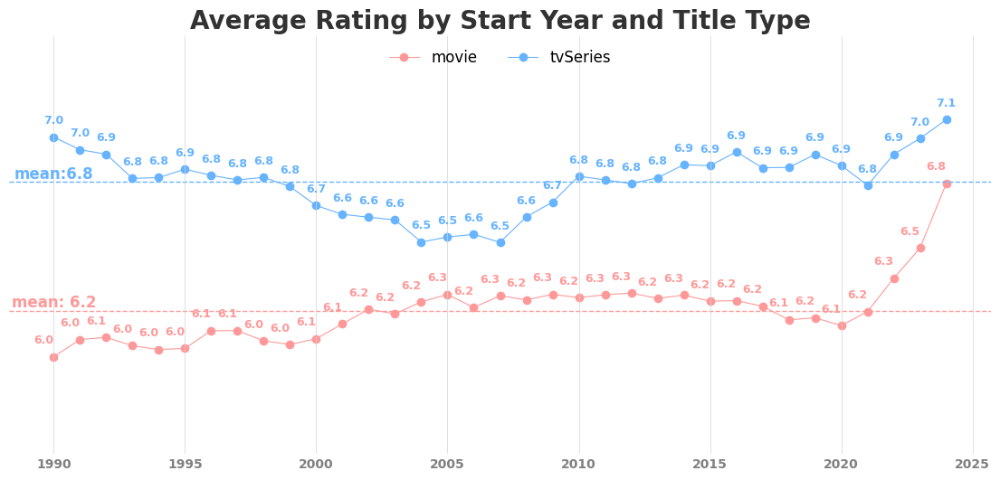

In [92]:
df=avg_rating_by_year_type_lim.copy()
df_type_movie = df[df['titleType'] == 'movie']
df_type_tvSeries = df[df['titleType'] == 'tvSeries']

avg_rating_movie = df_type_movie['averageRating'].mean()
avg_rating_tvSeries = df_type_tvSeries['averageRating'].mean()

plt.figure(figsize=(14, 6),facecolor='none')
plt.plot(df_type_movie['startYear'], df_type_movie['averageRating'], marker='o', linestyle='-', color='#ff9999', label='movie',linewidth=.8)
plt.axhline(y=avg_rating_movie, color='#ff9999', linestyle='--', linewidth=1)
plt.text(1990,avg_rating_movie, f'mean: {avg_rating_movie:.1f}', ha='center', va='bottom', color='#ff9999', fontsize=12, fontweight='bold')

for x, y in zip(df_type_movie['startYear'], df_type_movie['averageRating']):
    plt.text(x, y+.05, f'{y:.1f}', ha='right', va='bottom', color='#ff9999', fontsize=9, fontweight='bold')

plt.plot(df_type_tvSeries['startYear'], df_type_tvSeries['averageRating'], marker='o', linestyle='-', color='#66b3ff', label='tvSeries', linewidth=.8)
plt.axhline(y=avg_rating_tvSeries, color='#66b3ff', linestyle='--', linewidth=1)
plt.text(1990,avg_rating_tvSeries, f'mean:{avg_rating_tvSeries:.1f}', ha='center', va='bottom', color='#66b3ff', fontsize=12, fontweight='bold')

for x, y in zip(df_type_tvSeries['startYear'], df_type_tvSeries['averageRating']):
    plt.text(x, y+.05, f'{y:.1f}', ha='center', va='bottom', color='#66b3ff', fontsize=9, fontweight='bold')

plt.title('Average Rating by Start Year and Title Type',fontsize=20,color='#323232',fontweight='bold')
plt.xlabel('')
plt.ylabel('')
plt.legend()
plt.xticks(range(1990, 2026, 5), color='gray', fontweight='bold')
plt.yticks([])
plt.ylim(5.5, 7.5)
plt.legend(frameon=False, ncol=2, loc='upper center', bbox_to_anchor=(0.5, 1),fontsize=12)

for year in range(1990, 2026, 5):
    plt.axvline(x=year, color='lightgrey', linestyle='-', linewidth=0.5)

plt.box(False)
plt.tick_params(axis='both', length=0)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graf_analysis/lineplot_analysis_rating_series_movies.png', dpi=300, bbox_inches='tight', transparent=True )
plt.show()

##Análisis de gráficas:
1. En la gráfica tipo pai observamos históricamente una gran preferencia del público hacia las movies en relación a las tv series.
2. Por otra parte en la gráfica de líneas observamos que historicamente tienen un mayor rating las tv series respecto de las movies. Con un promedio histórico de 6.8 para las tv series y 6.2 para las movies.

### Insights Basados en la Relación entre el Tipo de Título (Movies vs. TV Series) y el Average Rating (1990-2024):

1. **Dominio de Movies en el Conjunto de Datos:**
   - La relación de tipos de título muestra que las películas representan el 84.3% del total, mientras que las series de televisión representan el 15.7%. Esto indica un predominio claro de las películas en el conjunto de datos.

2. **Tendencias de Ratings en Movies:**
   - Las películas han mostrado una tendencia general de incremento en las calificaciones promedio a lo largo del tiempo. Desde 1990, donde el rating promedio era de aproximadamente 5.965, ha habido un aumento gradual, alcanzando un promedio de 6.796 en 2024.
   - El aumento es relativamente lento, con algunas fluctuaciones menores, pero la tendencia general es positiva.

3. **Tendencias de Ratings en TV Series:**
   - Las series de televisión también han experimentado un aumento en los ratings promedio. En 1990, el promedio era de 7.017, y en 2024, ha aumentado a 7.101.
   - Comparado con las películas, las series de televisión tienen una calificación promedio consistentemente más alta durante todo el período analizado.

4. **Comparación de Calificaciones entre Movies y TV Series:**
   - A lo largo del período de 1990 a 2024, las series de televisión han mantenido calificaciones promedio más altas que las películas.
   - La diferencia en calificaciones indica que las series de televisión podrían estar mejor valoradas por los espectadores en comparación con las películas.

5. **Aceleración en el Aumento de Calificaciones en los Años Recientes:**
   - En los años más recientes (especialmente desde 2020), se observa una aceleración en el aumento de las calificaciones promedio para ambas películas y series de televisión. Este patrón podría estar relacionado con la mejora en la calidad de producción y la disponibilidad de contenido a través de plataformas de streaming.

### Insights Estratégicos:

1. **Enfoque en Producción de Series de Televisión:**
   - Dado que las series de televisión tienen calificaciones promedio más altas, la plataforma de streaming podría beneficiarse al invertir más en la producción y adquisición de contenido de series de televisión.
   
2. **Optimización de Algoritmos de Recomendación:**
   - La plataforma puede mejorar su algoritmo de recomendación para priorizar las series de televisión, dado que tienen calificaciones más altas y podrían atraer más a los usuarios.

3. **Segmentación de Mercados:**
   - Las diferencias en las calificaciones entre películas y series de televisión pueden ser útiles para segmentar el mercado y personalizar el contenido para diferentes grupos demográficos. Por ejemplo, promover series de televisión a usuarios que buscan contenido de alta calidad.

4. **Marketing y Promociones:**
   - Utilizar las calificaciones más altas de las series de televisión como un punto de venta en campañas de marketing para atraer nuevos suscriptores y retener a los existentes.

5. **Producción de Contenido Original:**
   - Dado el incremento en la calificación promedio tanto de películas como de series en años recientes, la plataforma puede centrarse en producir contenido original de alta calidad para continuar esta tendencia positiva y diferenciarse en un mercado competitivo.

Estas estrategias pueden ayudar a la plataforma de streaming a capitalizar los datos de tendencias del sector y mejorar su rendimiento general.

##**Pregunta 2: ¿Cual es el rating promedio por género?**

In [65]:
df_merged_basic_rating = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv')

# Paso 1: Separar los múltiples valores en la columna 'genres'
df_merged_basic_rating_expanded = df_merged_basic_rating.assign(genre=df_merged_basic_rating['genres'].str.split(',')).explode('genre')

# Paso 2: Agrupar por 'genre' y calcular el promedio de 'averageRating' y el total de registros
df_genre_stats = df_merged_basic_rating_expanded.groupby('genre').agg(
    avg_rating=('averageRating', 'mean'), movie_count=('tconst', 'count')).reset_index()

df_genre_stats.sort_values(by='movie_count', ascending=False, inplace=True)
df_genre_stats.reset_index(drop=True, inplace=True)
df_genre_stats

,genre,avg_rating,movie_count
0,Drama,6.328,144290
1,Comedy,6.083,87220
2,Documentary,7.235,51286
3,Romance,6.195,35925
4,Action,5.882,33098
5,Crime,6.144,29823
6,Thriller,5.649,25607
7,Adventure,6.139,22384
8,Horror,5.016,22201
9,Family,6.433,16183


<ipython-input-111-6d31e2b35caf>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_genre_stats, x='genre', y='movie_count', palette='dark:salmon_r', ax=ax1)
<ipython-input-111-6d31e2b35caf>:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, horizontalalignment='right')


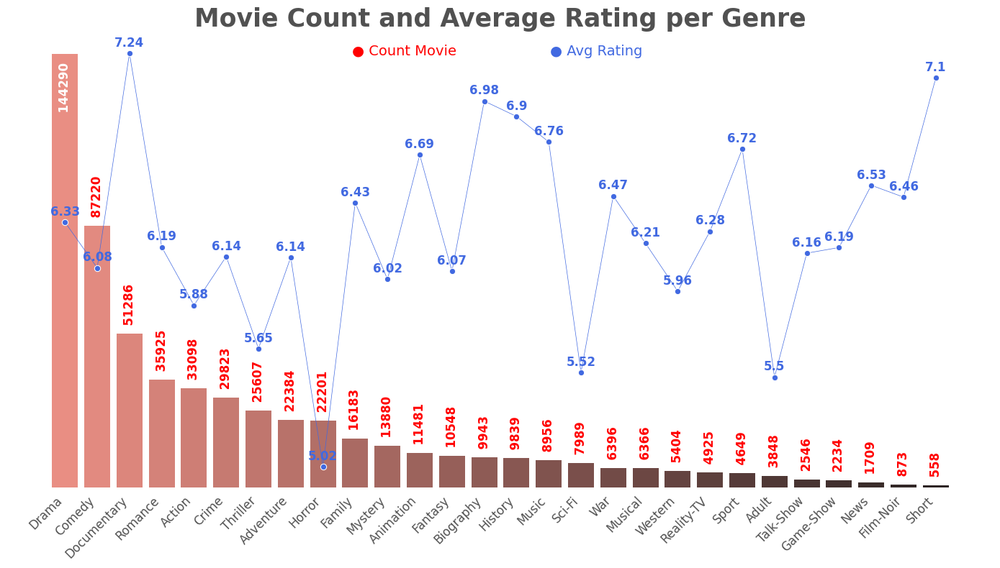

In [111]:
df_merged_basic_rating = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_basic_and_rating.csv')


df_merged_basic_rating_expanded = df_merged_basic_rating.assign(genre=df_merged_basic_rating['genres'].str.split(',')).explode('genre')

df_genre_stats = df_merged_basic_rating_expanded.groupby('genre').agg(
    avg_rating=('averageRating', 'mean'),
    movie_count=('tconst', 'count')
).reset_index()

# Ordenar por 'movie_count' en orden descendente
df_genre_stats.sort_values(by='movie_count', ascending=False, inplace=True)
df_genre_stats.reset_index(drop=True, inplace=True)

fig, ax1 = plt.subplots(figsize=(14, 8), facecolor='none')

sns.barplot(data=df_genre_stats, x='genre', y='movie_count', palette='dark:salmon_r', ax=ax1)
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', labelcolor='#515151', rotation=45, width=0,labelsize=12)
# ax1.tick_params(axis='y', labelcolor='r', fontweight='bold', labelsize=12
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.yaxis.set_visible(False)
ax1.annotate('● Count Movie', xy=(0.35, 0.95), xycoords='axes fraction', fontsize=14, color='red', ha='left')
ax1.annotate('● Avg Rating', xy=(0.55, 0.95), xycoords='axes fraction', fontsize=14, color='royalblue', ha='left')

# Agregar valores al final de las barras
for i, v in enumerate(df_genre_stats['movie_count']):
    ax1.text(i, v + 1, f'  {str(v)}  ', ha='center', va='top' if v>1e5 else 'bottom', color='r' if v<1e5 else 'w',fontweight='bold',rotation=90,fontsize=12)

# Crear un segundo eje y
ax2 = ax1.twinx()
sns.lineplot(data=df_genre_stats, x='genre', y='avg_rating', color='royalblue', marker='o', ax=ax2, linestyle='-', linewidth=0.5)
ax2.set_ylabel('')
# ax2.tick_params(axis='y', labelcolor='b', length=0)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.yaxis.set_visible(False)

# Agregar valores al final de las líneas
for i, v in enumerate(df_genre_stats['avg_rating']):
    ax2.text(i, v + 0.02, str(round(v, 2)), ha='center', va='bottom', color='royalblue',fontweight='bold',fontsize=12)


ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, horizontalalignment='right')
# ax1.gca().spines['bottom'].set_visible(False)
plt.tick_params(axis='both', length=0)

plt.title('Movie Count and Average Rating per Genre',fontsize=25,color='#515151',fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/movie_count_avg_rating_per_genre.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


##Análisis de gráficas:
1. En la gráfica de barras observamos la prevalencia de las movies type of Drama con una cantidad que supera en un 40% a inmediata pertenenciente al type of Comedy, y esta supera en un 41% a la tercera del type of Documentary.
2. Por otra parte en la gráfica de líneas observamos que las dos primeras de tipo Drama y Comedy tiene un buen average rating, con 6.33 y 6.08 respectivamente, pero Documentary está en el Top con 7.24 , luego le sigue Short con 7.1 (pero se encuentra al final de la consideración por cantidad), y en trercer lugar se ubica el tipo Biografy con 6.98 (pero también con bajo conteo)

### Insights Basados en el Género de las Películas y su Calificación Promedio:

1. **Documentales como el Género Mejor Calificado:**
   - Los documentales tienen la calificación promedio más alta (7.235) entre todos los géneros, lo que sugiere que este tipo de contenido es muy valorado por los espectadores.

2. **Alta Calidad en Cortometrajes:**
   - Los cortometrajes también tienen una calificación promedio alta (7.102), aunque el número de películas en este género es significativamente menor (558). Esto indica que, aunque no son tan comunes, los cortometrajes tienden a recibir altas calificaciones.

3. **Géneros Populares con Calificaciones Moderadas:**
   - Los géneros con la mayor cantidad de películas, como Drama (144,290 películas) y Comedia (87,220 películas), tienen calificaciones promedio de 6.328 y 6.083, respectivamente. Estos géneros son populares pero no necesariamente los más valorados en términos de calidad promedio.

4. **Calificaciones Bajas para Géneros de Horror y Ciencia Ficción:**
   - El género de Horror tiene una de las calificaciones promedio más bajas (5.016), a pesar de tener un número significativo de películas (22,201).
   - La Ciencia Ficción también tiene una calificación baja (5.521) con 7,989 películas, indicando que estos géneros podrían necesitar una mejora en la calidad del contenido para aumentar su valoración.

5. **Calificaciones Relativamente Altas en Géneros Históricos y Biográficos:**
   - Los géneros de Historia (6.896) y Biografía (6.978) tienen calificaciones promedio altas, lo que sugiere un buen nivel de calidad percibida en estas categorías.

6. **Buen Desempeño de Películas de Animación y Familia:**
   - La Animación (6.689) y las películas de Familia (6.433) tienen calificaciones promedio relativamente altas, lo que indica que son bien recibidas por el público.

### Insights Estratégicos:

1. **Promoción de Documentales y Cortometrajes:**
   - Dado que estos géneros tienen las calificaciones más altas, la plataforma de streaming debería enfocarse en promocionarlos y agregar más contenido de alta calidad en estas categorías.

2. **Mejorar la Calidad en Géneros de Horror y Ciencia Ficción:**
   - Invertir en mejorar la calidad de las producciones de Horror y Ciencia Ficción para aumentar sus calificaciones promedio y atraer a más espectadores.

3. **Expandir la Oferta en Géneros Históricos y Biográficos:**
   - Dado que estos géneros tienen calificaciones altas, la plataforma debería considerar la producción y adquisición de más contenido en Historia y Biografía para satisfacer a los espectadores que buscan contenido de alta calidad en estas áreas.

4. **Fortalecer el Contenido de Animación y Familia:**
   - Mantener y expandir la biblioteca de contenido de Animación y Familia para capitalizar en sus calificaciones altas y atraer a familias y audiencias más jóvenes.

5. **Diferenciarse con Contenido Especializado:**
   - Utilizar los géneros de alto rating como Documentales y Cortometrajes para diferenciarse de la competencia y atraer a una audiencia que busca contenido más profundo y de alta calidad.

6. **Analizar y Mejorar Géneros Populares:**
   - Aunque los géneros como Drama y Comedia son populares, sus calificaciones promedio son moderadas. La plataforma debería analizar los factores que contribuyen a estas calificaciones y trabajar en mejorar la calidad general del contenido en estos géneros.

Estas estrategias pueden ayudar a la plataforma de streaming a utilizar los datos de tendencias de género de manera estratégica para mejorar su rendimiento y atraer a una audiencia más amplia y satisfecha.

##**Pregunta 3: ¿Cuáles son los géneros que proporcionan mayor roi?**

In [169]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_tmdb_pandas.csv')
df_title_basics_pandas_movie_tvSeries = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_title_basics_pandas_movie_tvSeries.csv')
# Merge por la col tconst:
df_tmdb_merged_basic = df.merge(df_title_basics_pandas_movie_tvSeries, on='tconst')

df_tmdb_expanded = df_tmdb_merged_basic.assign(genre=df_tmdb_merged_basic['genres_x'].str.split(',').explode('genre').str.strip()).explode('genre')
df_genre_roi = df_tmdb_expanded.groupby('genre').agg({'roi': 'mean','revenue_mll':'sum','budget_mll':'sum'}).sort_values(by='roi', ascending=False).head(10).reset_index()
df_genre_roi['profit']=df_genre_roi['revenue_mll']-df_genre_roi['budget_mll']
df_genre_roi.sort_values(by='roi', ascending=False, inplace=True)
df_genre_roi

,genre,roi,revenue_mll,budget_mll,profit
0,Science Fiction,1.631,27488,18590,8898
1,Fantasy,1.565,23525,15416,8109
2,Adventure,1.532,41520,29210,12310
3,Action,1.500,50548,33573,16975
4,Family,1.481,17451,11145,6306
5,Animation,1.453,13200,8405,4795
6,Western,1.428,966,846,120
7,War,1.408,4321,2838,1483
8,Mystery,1.270,9579,6253,3326
9,Drama,1.217,41843,26691,15152


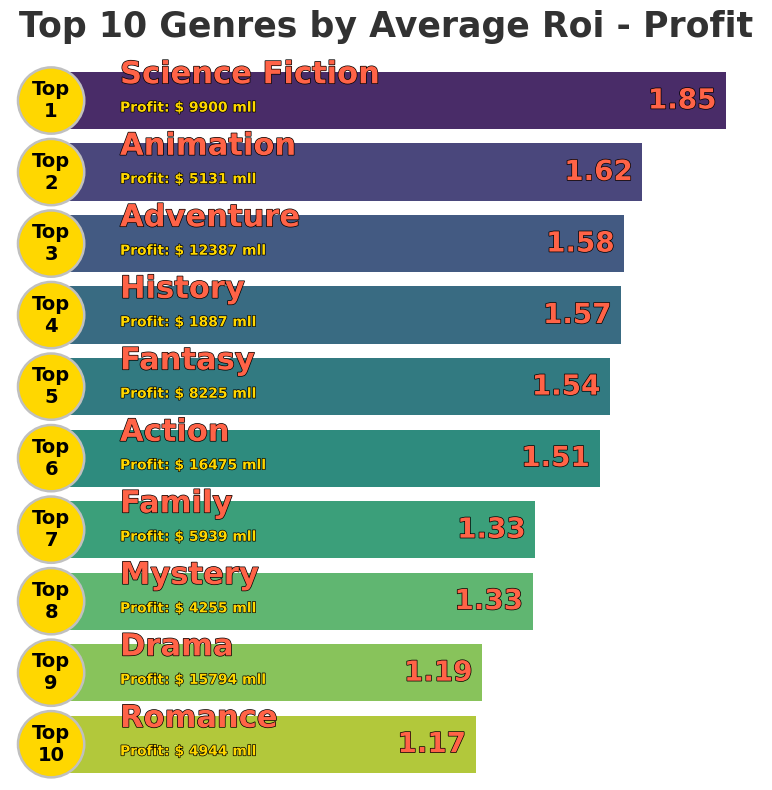

In [11]:
import matplotlib.patheffects as patheffects

plt.figure(figsize=(8, 8),facecolor='none')
ax=sns.barplot(data=df_genre_roi, x='roi', y='genre', palette='viridis', legend=False)
plt.xlabel('')
plt.ylabel('')
plt.title('Top 10 Genres by Average Roi - Profit',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, v in enumerate(df_genre_roi['roi']):
    plt.text(v, i, f'{str(round(v, 2))} ', va='center', ha='right',fontsize=20,color='tomato',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])

for i, (gen, rev) in enumerate(zip(df_genre_roi['genre'], df_genre_roi['profit'])):
    plt.text(.2, i - .36, f'{gen}', va='center', ha='left', fontsize=22, color='tomato', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(.2, i + .1, f'Profit: $ {rev} mll', va='center', ha='left', fontsize=10, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])


for index, p in enumerate(ax.patches):
    ax.annotate(f'Top\n{index + 1}',
                xy=(.05, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='black', fontweight='bold',
                bbox=dict(boxstyle="circle,pad=0.65", edgecolor='silver', facecolor='gold', lw=1.8))

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.xlim(-.1, df_genre_roi['roi'].max() + .1)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/top_10_genres_roi.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

##Análisis de gráficas:
  En el análisis del roi promedio según el género, observamos como el tipo Sci Fi se ubica en el top, con 1.85 y una ganancia de 9.9 billones, seguido por Animation con 1.62 y una ganancia de 5.1 Billones. Y en el top 3 se ubica Adventure con 1.58 pero con una ganancia de 12.3 billones, superando ampliamente a las anteriores.

### Insights Basados en ROI, Ingresos, Presupuestos y Ganancias por Género:

1. **Géneros con Mayor Retorno de Inversión (ROI):**
   - **Science Fiction (Ciencia Ficción)** tiene el ROI más alto (1.631), seguido por **Fantasy (Fantasía)** (1.565) y **Adventure (Aventura)** (1.532). Esto indica que estos géneros generan un retorno significativo en relación con su inversión, haciendo que sean opciones rentables para la producción.
   - **Action (Acción)** y **Family (Familia)** también presentan ROIs altos (1.500 y 1.481 respectivamente), sugiriendo que son géneros con buenas posibilidades de obtener beneficios sustanciales.

2. **Géneros con Mayor Ingreso Total:**
   - **Action (Acción)** tiene el mayor ingreso total (50,548 millones), seguida por **Adventure (Aventura)** (41,520 millones) y **Drama** (41,843 millones). Estos géneros generan grandes cantidades de ingresos, aunque no siempre tienen el ROI más alto.
   - **Fantasy (Fantasía)** y **Science Fiction (Ciencia Ficción)** también generan ingresos significativos (23,525 millones y 27,488 millones respectivamente).

3. **Géneros con Mayores Presupuestos:**
   - **Action (Acción)** y **Adventure (Aventura)** tienen los presupuestos más altos (33,573 millones y 29,210 millones respectivamente), lo cual está alineado con sus altos ingresos. Sin embargo, también implica un mayor riesgo financiero.
   - **Science Fiction (Ciencia Ficción)** y **Fantasy (Fantasía)** también tienen presupuestos altos (18,590 millones y 15,416 millones respectivamente).

4. **Géneros con Mayor Ganancia Absoluta:**
   - **Action (Acción)** tiene la mayor ganancia absoluta (16,975 millones), seguida por **Adventure (Aventura)** (12,310 millones) y **Drama** (15,152 millones). Estos géneros no solo generan ingresos altos, sino que también dejan grandes ganancias después de cubrir sus costos.
   - **Science Fiction (Ciencia Ficción)** y **Fantasy (Fantasía)** también tienen ganancias altas (8,898 millones y 8,109 millones respectivamente).

5. **Géneros con Presupuestos y Ganancias Relativamente Pequeñas:**
   - **Western (Western)** y **War (Guerra)** tienen presupuestos más pequeños (846 millones y 2,838 millones respectivamente) y ganancias absolutas menores (120 millones y 1,483 millones), pero siguen siendo rentables con ROIs de 1.428 y 1.408 respectivamente.
   - **Mystery (Misterio)** también tiene un presupuesto más bajo (6,253 millones) y una ganancia de 3,326 millones, con un ROI de 1.270.

### Insights Estratégicos:

1. **Invertir en Géneros con Alto ROI:**
   - Dado que los géneros de **Science Fiction**, **Fantasy**, y **Adventure** tienen altos ROIs, invertir en estos géneros puede proporcionar un buen retorno sobre la inversión. La plataforma debería enfocarse en producir o adquirir más contenido en estas categorías.

2. **Capitalizar en Géneros con Ingresos Altos:**
   - Los géneros de **Action**, **Adventure**, y **Drama** generan los ingresos totales más altos. La plataforma debería mantener una oferta robusta en estos géneros para asegurar un flujo de ingresos constante y significativo.

3. **Gestionar el Riesgo en Producciones de Alto Presupuesto:**
   - Aunque **Action** y **Adventure** tienen altos ingresos y ganancias, también implican mayores riesgos debido a sus altos presupuestos. Es crucial gestionar estos riesgos cuidadosamente y evaluar las oportunidades de financiación y aseguramiento de ingresos.

4. **Diversificar con Géneros de Presupuesto Moderado:**
   - Géneros como **Mystery**, **Family**, y **Animation** presentan una oportunidad para diversificación con un riesgo financiero menor debido a sus presupuestos más moderados, pero aún ofrecen buenas ganancias y retornos.

5. **Explorar Géneros de Nicho Rentables:**
   - **Western** y **War** a pesar de sus presupuestos y ganancias menores, ofrecen un ROI razonable. La plataforma podría explorar más contenido en estos géneros de nicho que tienen seguidores leales y constantes.

6. **Optimizar Estrategias de Marketing y Distribución:**
   - Maximizar el alcance y la rentabilidad de los géneros más rentables a través de estrategias de marketing y distribución bien planificadas puede aumentar aún más los beneficios y asegurar el éxito financiero de las producciones.

Estos insights pueden ayudar a la plataforma de streaming a tomar decisiones informadas sobre dónde invertir y cómo optimizar su contenido para maximizar ingresos y rentabilidad.

##**Pregunta 4: ¿Cuáles son los países con mayor producción de contenido?**

In [58]:
df_all = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')

top_countries = 16
# Separar los múltiples valores en la columna 'production_countries'
df_tmdb_exploded_countries = df_all.assign(production_countries=df_all['production_countries'].str.split(',')).explode('production_countries').copy()
df_tmdb_exploded_countries['production_countries'] = df_tmdb_exploded_countries['production_countries'].str.strip()

# Agrupar por 'production_countries' y calcular el promedio de 'roi' y el total de registros
df_plot = df_tmdb_exploded_countries.groupby('production_countries').agg({'roi': 'mean', 'production_countries': 'count','revenue_mll':'sum'})
df_plot.rename(columns={'production_countries': 'count'}, inplace=True)

# Ordenar los datos por el número de registros
df_plot = df_plot.sort_values(by='count', ascending=False).head(16).reset_index()
df_plot.sort_values(by='count', ascending=True, inplace=True)
df_plot

,production_countries,roi,count,revenue_mll
15,Sweden,0.577,85,1248
14,South Korea,1.666,93,3080
13,Hong Kong,1.312,120,7110
12,Belgium,0.138,140,2240
11,Australia,0.925,166,7182
10,China,1.342,171,11016
9,Russia,0.584,206,1592
8,Italy,0.384,211,4370
7,Japan,1.166,218,9530
6,Spain,0.713,219,4778


In [30]:
df_all = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')

top_countries = 16
# Separar los múltiples valores en la columna 'production_countries'
df_tmdb_exploded_countries = df_all.assign(production_countries=df_all['production_countries'].str.split(',')).explode('production_countries').copy()
df_tmdb_exploded_countries['production_countries'] = df_tmdb_exploded_countries['production_countries'].str.strip()

# Agrupar por 'production_countries' y calcular el promedio de 'roi' y el total de registros
df_plot = df_tmdb_exploded_countries.groupby('production_countries').agg({'roi': 'mean', 'production_countries': 'count','revenue_mll':'sum'})
df_plot.rename(columns={'production_countries': 'count'}, inplace=True)

# Ordenar los datos por el número de registros
df_plot = df_plot.sort_values(by='count', ascending=False).head(16).reset_index()
df_plot.sort_values(by='count', ascending=True, inplace=True)
df_plot['percent_count'] = df_plot['count'] / df_plot['count'].sum()
df_plot

,production_countries,roi,count,revenue_mll,percent_count
15,Sweden,0.577,85,1248,0.008
14,South Korea,1.666,93,3080,0.008
13,Hong Kong,1.312,120,7110,0.011
12,Belgium,0.138,140,2240,0.012
11,Australia,0.925,166,7182,0.015
10,China,1.342,171,11016,0.015
9,Russia,0.584,206,1592,0.018
8,Italy,0.384,211,4370,0.019
7,Japan,1.166,218,9530,0.019
6,Spain,0.713,219,4778,0.019


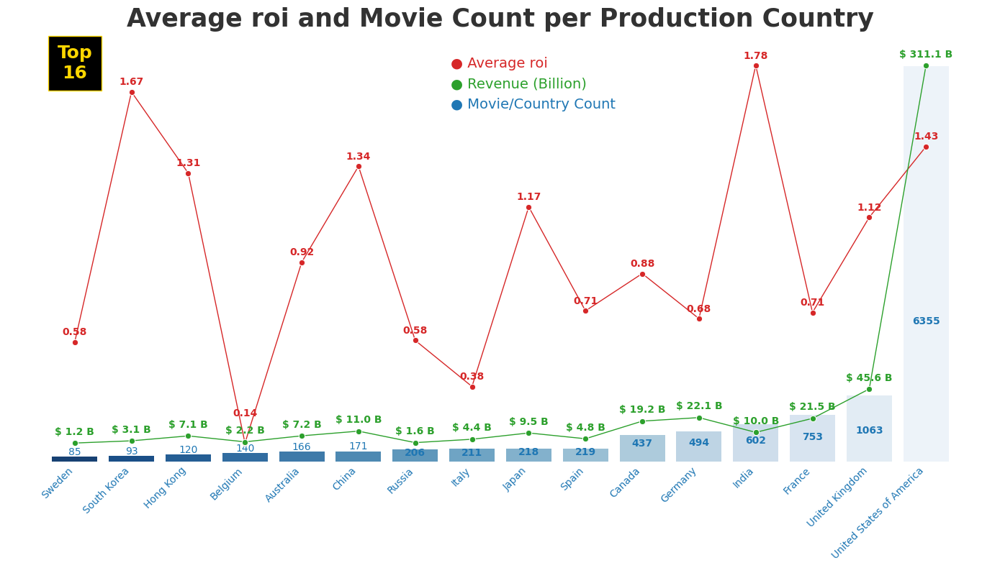

In [31]:
color_blue = 'tab:blue'
color_red = 'tab:red'
color_green = 'tab:green'

fig, ax1 = plt.subplots(figsize=(14, 8),facecolor='none')
sns.barplot(x='production_countries', y='count', data=df_plot, palette='Blues_r', ax=ax1)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right',color= color_blue)
ax1.tick_params(axis='y', left=False, labelleft=False)
ax1.tick_params(axis='x', bottom=False)
ax1.set_xlabel('')
ax1.set_ylabel('')

for p in ax1.patches:
  if p.get_height() < 200:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()-70),
                 ha='center', va='center',
                 xytext=(0, 9),
                 color=color_blue,
                 textcoords='offset points')
  if p.get_height() < 400:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()-210),
                 ha='center', va='center',
                 xytext=(0, 9),
                 color=color_blue,
                 fontweight='bold',
                 textcoords='offset points')
  else:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()/3),
                 ha='center', va='center',
                 xytext=(0, 9),
                 color=color_blue,
                 fontweight='bold',
                 textcoords='offset points')

ax2 = ax1.twinx()
sns.lineplot(x='production_countries', y='roi', data=df_plot, color=color_red, marker='o', linewidth=1, ax=ax2)
ax2.tick_params(axis='y', right=False, labelright=False)
ax2.set_ylabel('')

for i, v in enumerate(df_plot['roi']):
    ax2.text(i, v + 0.02 if v > 0.15 else v + 0.15, f'{v:.2f}', ha='center', va='bottom' if v > 0.15 else 'top', color='tab:red',fontweight='bold')

ax3 = ax1.twinx()

ax3.spines['right'].set_position(('outward', 60))  # Mover el tercer eje 60 puntos a la derecha
sns.lineplot(x='production_countries', y='revenue_mll', data=df_plot, color=color_green, marker='o', linewidth=1, ax=ax3)
ax3.tick_params(axis='y', right=False, labelright=False)
ax3.set_ylabel('')

for i, v in enumerate(df_plot['revenue_mll']):
    ax3.text(i, v + 5000, f'$ {v / 1e3:.1f} B', ha='center', va='bottom', color=color_green,fontweight='bold')

plt.title(f'Average roi and Movie Count per Production Country', fontsize=25, color='#323232',fontweight='bold',pad=20)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['bottom'].set_visible(False)

ax1.tick_params(axis='both', length=0)
ax2.tick_params(axis='both', length=0)
ax3.tick_params(axis='both', length=0)

ax2.annotate('● Average roi', xy=(0.45, 0.95), xycoords='axes fraction', fontsize=14, color=color_red, ha='left')
ax3.annotate('● Revenue (Billion)', xy=(0.45, 0.90), xycoords='axes fraction', fontsize=14, color=color_green, ha='left')
ax1.annotate('● Movie/Country Count', xy=(0.45, 0.85), xycoords='axes fraction', fontsize=14, color=color_blue, ha='left')

plt.annotate(f'Top\n{top_countries}',
                xy=(0, df_plot['revenue_mll'].max()+1800),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=18, color='gold', fontweight='bold',
                bbox=dict(boxstyle="square, pad=.5", edgecolor='gold', facecolor='black', lw=1))

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/movie_country_count_roi_revenue.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


## Análisis de la gráfica:
**Top 16 - country**

1. La gráfica de barras muestra la cantidad producción de movies por países. Liderando Estados Unidos ampliamente, superando seis veces al anteiror, Reino unido, luego le sigue Francia.
2. También observamos la relación del promedio de roi y la suma de revenue por país  en las gráficas de lineas de color rojo y verde respecivamente. Es notorio que no guardan proporcion porquepuede tener un average roi de 1.78 (India), pero revenue: $10 B en cambio Estados Unidos un average roi de 1.43 pero su revenue: 311 B.

In [47]:
import plotly.express as px

num_countries = len(df_plot)
grid_size = int(np.ceil(np.sqrt(num_countries)))
df_plot['x'] = np.tile(np.arange(grid_size), grid_size)[:num_countries]
df_plot['y'] = np.repeat(np.arange(grid_size), grid_size)[:num_countries]
# df_plot['text'] = df_plot['production_countries'] + '<br>roi: ' + df_plot['roi'].round(2).astype(str) + '<br>Count: ' + df_plot['count'].astype(str)
df_plot['text'] ='roi: ' + df_plot['roi'].round(2).astype(str) + '<br>' + df_plot['production_countries'] + '<br>' + (df_plot['percent_count']*100).round(2).astype(str) + '%'

# Crear el gráfico de burbujas usando Plotly
fig = px.scatter(df_plot, x='x', y='y',
                 size='count', color='roi',
                 text='text',
                 color_continuous_scale='Greens',
                 size_max=100,
                 labels={'x': '', 'y': '', 'roi': '', 'count': ''},
                #  title=f'Average roi and Movie Count per Production Country (Top {num_countries})'
                 )

# Eliminar la barra de color lateral
fig.update_coloraxes(showscale=False)

# Aumentar la distancia entre los datos ajustando los límites del eje
fig.update_xaxes(range=[-2.5, df_plot['x'].max() + 2.5])
fig.update_yaxes(range=[-.8, df_plot['y'].max() + .8])

# Actualizar los trazos para cambiar el estilo del texto y agregar el borde a las burbujas
fig.update_traces(
    textfont=dict(size=11, color='#323232', family="Arial Black"),
    marker=dict(line=dict(color='darkgreen', width=1)  # Color del borde y grosor de la línea
    )
)

fig.update_layout(
    showlegend=False,
    xaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
    yaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor='#ecf8ff',
    # paper_bgcolor='lightsteelblue',
    margin=dict(l=20, r=20, t=40, b=20),  # Aumentar los márgenes
    title=dict(
        text=f'Average roi and Movie Count per Production Country (Top {num_countries})',
        font=dict(
            family='Arial Black',
            size=25,
            color='#3c3c3c'
        ),
        xref='paper',
        x=0.5  # Centrar el título
    )
)
fig.show()


In [162]:
import plotly.express as px
import plotly.io as pio
import numpy as np
import pandas as pd

# Asumiendo que df_plot ya está creado y contiene los datos necesarios

# Preparar los datos
num_countries = len(df_plot)
grid_size = int(np.ceil(np.sqrt(num_countries)))
df_plot['x'] = np.tile(np.arange(grid_size), grid_size)[:num_countries]
df_plot['y'] = np.repeat(np.arange(grid_size), grid_size)[:num_countries]

# Mejorar el texto de las burbujas
df_plot['text'] = (
    '<b>' + df_plot['production_countries'] + '</b><br>' +
    'ROI: ' + df_plot['roi'].round(2).astype(str) + '<br>' +
    'Count: ' + df_plot['count'].astype(str) + '<br>' +
    'Percentage: ' + (df_plot['percent_count']*100).round(2).astype(str) + '%'
)

# Crear el gráfico de burbujas
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    size='count',
    color='roi',
    text='text',
    color_continuous_scale='RdYlGn',  # Red to Yellow to Green scale
    size_max=100,
    hover_name='production_countries'
)
# Eliminar la barra de color lateral
fig.update_coloraxes(showscale=False)

# Aumentar la distancia entre los datos ajustando los límites del eje
fig.update_xaxes(range=[-1, df_plot['x'].max() + 1])
fig.update_yaxes(range=[-.2, df_plot['y'].max() + 1])
# Actualizar el diseño
fig.update_layout(
    title={
        'text': f'ROI and Movie Count by Production Country (Top {num_countries})',
        'font': {'size': 24, 'family': 'Arial Black', 'color': '#333333'},
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    showlegend=False,
    xaxis={'visible': False},
    yaxis={'visible': False},
    plot_bgcolor='#F4E8AA',
    paper_bgcolor='white',
    height=900,
    width=1600,
    margin=dict(l=20, r=20, t=80, b=20)
)

# Actualizar los trazos
fig.update_traces(
    textfont=dict(size=12, family="Arial", color='#333333'),
    marker=dict(line=dict(width=1, color='#333333')),
    textposition='top center'
)

# Añadir una nota explicativa
fig.add_annotation(
    text='Bubble size represents movie count. Color indicates ROI (Return on Investment).',
    xref="paper", yref="paper",
    x=0.5, y=-0.05,
    showarrow=False,
    font=dict(size=14, color="#555555"),
    align="center",
)

fig.show()

# Intentar guardar la imagen en alta calidad
try:
    pio.write_image(fig, "movie_production_roi_analysis.png", scale=2, format="png")
    print("Imagen PNG guardada con éxito.")
except Exception as e:
    print(f"No se pudo guardar la imagen PNG: {e}")
    print("Intente instalar kaleido con: pip install -U kaleido")

# Guardar como HTML interactivo (esto debería funcionar sin kaleido)
try:
    fig.write_html("movie_production_roi_analysis.html")
    print("Archivo HTML interactivo guardado con éxito.")
except Exception as e:
    print(f"No se pudo guardar el archivo HTML: {e}")

No se pudo guardar la imagen PNG: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido

Intente instalar kaleido con: pip install -U kaleido
Archivo HTML interactivo guardado con éxito.


## Análisis de la gráfica:

  La gráfica representa el top 16 de países según la cantidad de producción de movies (visualemte representada por el tamaño del círculo, y la intensidad del color verde representa el average roi). Por tanto observamos que Estados Unidos lidera ampliamente copando la producción con un 56% del total considerado., pero respecto al average roi lidera India, pero sólo tiene una producción del 5.3%.

### Insights Basados en ROI, Cantidad de Películas y Ingresos por País de Producción:

1. **Países con Mayor Retorno de Inversión (ROI):**
   - **India** tiene el ROI más alto (1.781), seguido por **South Korea (Corea del Sur)** (1.666) y **China** (1.342). Estos países generan un retorno significativo en relación con su inversión, haciendo que sean opciones rentables para la producción.
   - **United States of America (Estados Unidos)** también presenta un ROI alto (1.428), indicando un buen equilibrio entre inversión y retorno.

2. **Países con Mayor Ingreso Total:**
   - **United States of America (Estados Unidos)** tiene, con diferencia, el mayor ingreso total (311,067 millones), seguido por **United Kingdom (Reino Unido)** (45,614 millones) y **Germany (Alemania)** (22,144 millones). Estos países generan grandes cantidades de ingresos, aunque no siempre tienen el ROI más alto.
   - **France (Francia)** y **China** también generan ingresos significativos (21,483 millones y 11,016 millones respectivamente).

3. **Cantidad de Películas Producidas por País:**
   - **United States of America (Estados Unidos)** produce la mayor cantidad de películas (6,355), seguido por **United Kingdom (Reino Unido)** (1,063) y **France (Francia)** (753). Esto sugiere una gran industria cinematográfica en estos países.
   - **India** y **Germany (Alemania)** también tienen una cantidad considerable de producciones (602 y 494 respectivamente).

4. **Países con ROI Relativamente Bajo:**
   - **Belgium (Bélgica)** tiene un ROI muy bajo (0.138), lo que indica que las producciones en este país no están generando un retorno significativo.
   - **Italy (Italia)** y **Russia (Rusia)** también tienen ROIs bajos (0.384 y 0.584 respectivamente), lo que sugiere que las inversiones en estos países no están resultando en altos retornos.

5. **Ingresos Moderados y ROIs Medios:**
   - **Japan (Japón)** y **Hong Kong** tienen ingresos moderados (9,530 millones y 7,110 millones respectivamente) y ROIs medios (1.166 y 1.312 respectivamente), sugiriendo que son mercados estables y rentables.
   - **Australia** y **Canada (Canadá)** también presentan ingresos moderados (7,182 millones y 19,231 millones respectivamente) con ROIs medios a bajos (0.925 y 0.875 respectivamente).

### Insights Estratégicos:

1. **Enfocar Inversiones en Países con Alto ROI:**
   - **India**, **South Korea (Corea del Sur)** y **China** ofrecen altos retornos de inversión, por lo que invertir en producciones en estos países puede ser muy rentable. La plataforma debería considerar ampliar su presencia y producción en estos mercados.

2. **Capitalizar en Países con Altos Ingresos:**
   - **United States of America (Estados Unidos)** y **United Kingdom (Reino Unido)** generan los ingresos totales más altos. La plataforma debería mantener una oferta robusta de contenido de estos países para asegurar un flujo de ingresos constante y significativo.

3. **Diversificación y Gestión del Riesgo:**
   - Diversificar inversiones en países como **Japan (Japón)** y **Hong Kong**, que tienen ingresos moderados y ROIs razonables, puede proporcionar estabilidad y reducir el riesgo asociado con concentrar inversiones en un solo país.
   - Evaluar estrategias para mejorar el ROI en países con retornos bajos, como **Belgium (Bélgica)** y **Italy (Italia)**, podría abrir nuevas oportunidades de crecimiento.

4. **Explorar Nuevos Mercados:**
   - **Australia** y **Canada (Canadá)** presentan oportunidades con ingresos moderados y deberían ser explorados para aumentar la variedad de contenido disponible en la plataforma.
   - Invertir en marketing y distribución en estos países puede ayudar a aumentar la visibilidad y el consumo del contenido producido.

5. **Optimización de Estrategias de Producción:**
   - Evaluar y optimizar las estrategias de producción en **Germany (Alemania)** y **France (Francia)**, que tienen altos ingresos pero ROIs relativamente bajos, podría ayudar a mejorar la eficiencia y rentabilidad de las inversiones en estos mercados.

Estos insights pueden ayudar a la plataforma de streaming a tomar decisiones informadas sobre dónde invertir y cómo optimizar su contenido para maximizar ingresos y rentabilidad, considerando tanto los retornos de inversión como los ingresos totales y la cantidad de producciones por país.

#OTROS INSIGHT

# Word Colud

In [23]:
# from wordcloud import WordCloud

# # Word Cloud basado en Original Titles vs Average Rating
# df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')
# df_cleaned = df.dropna(subset=['originalTitle', 'averageRating', 'numVotes'])
# title_rating_dict = df_cleaned.set_index('originalTitle')['averageRating'].to_dict()
# wordcloud_rating = WordCloud(width=800, height=400, background_color='#101a24').generate_from_frequencies(title_rating_dict)
# plt.figure(figsize=(10, 5),facecolor='none')
# plt.imshow(wordcloud_rating, interpolation='bilinear')
# plt.title('Original Titles vs Average Rating',fontsize=20, color='#101a24', fontweight= 'bold')
# plt.axis('off')
# plt.savefig("/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_originaleTitle_vs_rating.png", dpi=300, transparent=True)
# plt.show()

In [24]:
# # Word Cloud basado en Original Titles vs Num Votes
# title_votes_dict = df_cleaned.set_index('originalTitle')['numVotes'].to_dict()
# wordcloud_votes = WordCloud(width=800, height=400, background_color='#101a24').generate_from_frequencies(title_votes_dict)
# plt.figure(figsize=(10, 5),facecolor='none')
# plt.imshow(wordcloud_votes, interpolation='bilinear')
# plt.title('Original Titles vs Num Votes',fontsize=20, color='#101a24', fontweight= 'bold')
# plt.axis('off')
# plt.savefig("/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_originaleTitle_vs_numVotes.png", dpi=300, transparent=True)
# plt.show()

In [25]:
# # Word Cloud basado en Original Titles vs roi
# title_votes_dict = df_cleaned.set_index('originalTitle')['roi'].to_dict()
# wordcloud_votes = WordCloud(width=800, height=400, background_color='#101a24').generate_from_frequencies(title_votes_dict)
# plt.figure(figsize=(10, 5),facecolor='none')
# plt.imshow(wordcloud_votes, interpolation='bilinear')
# plt.title('Original Titles vs roi',fontsize=20, color='#101a24', fontweight= 'bold')
# plt.axis('off')
# plt.savefig("/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_originaleTitle_vs_roi.png", dpi=300, transparent=True)
# plt.show()

In [20]:
from wordcloud import WordCloud
import random
def word_cloud(var):
    def bright_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
        return f"hsl({random.randint(0, 255)}, 100%, 75%)"

    df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb.csv')
    df_cleaned = df.dropna(subset=['originalTitle', 'averageRating', 'numVotes', 'roi'])

    title_votes_dict = df_cleaned.set_index('originalTitle')[var].to_dict()
    wordcloud_votes = WordCloud(width=800, height=400, background_color='#101a24', color_func=bright_color_func).generate_from_frequencies(title_votes_dict)
    plt.figure(figsize=(10, 5), facecolor='none')
    plt.imshow(wordcloud_votes, interpolation='bilinear')
    plt.title(f'Original Titles vs {var}',fontsize=20, color='#101a24', fontweight= 'bold')
    plt.axis('off')
    plt.savefig(f"/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_originalTitle_vs_{var}.png", dpi=300, transparent=True)
    plt.show()

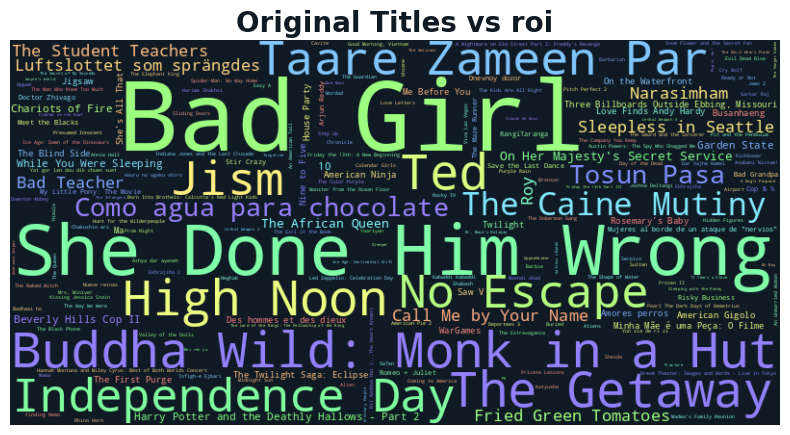

In [21]:
word_cloud('roi')

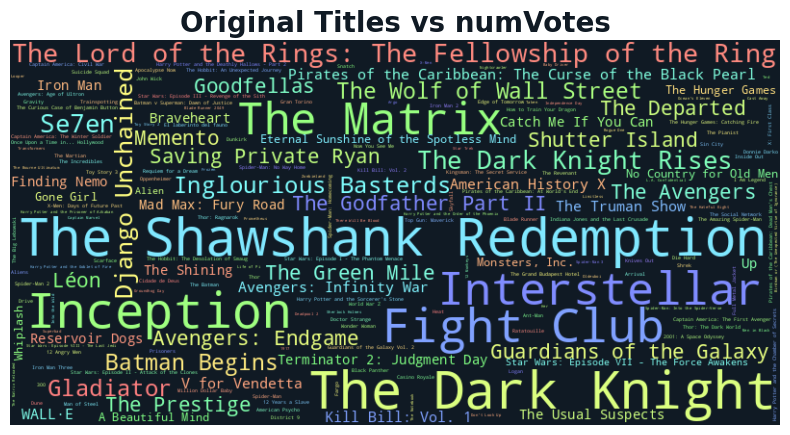

In [22]:
word_cloud('numVotes')

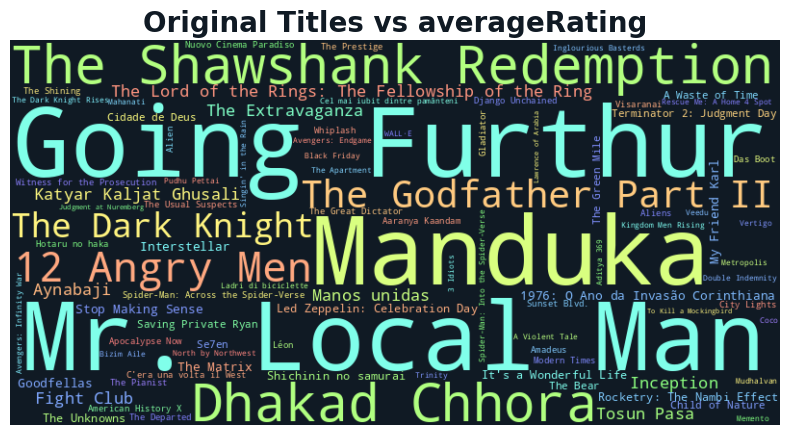

In [27]:
word_cloud('averageRating')

# Top: Movie con mayor Rating por año en países top count movies:



In [98]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df.columns

Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes',
       'original_title', 'vote_average', 'release_date', 'revenue', 'runtime',
       'adult', 'backdrop_path', 'budget', 'original_language', 'keywords',
       'popularity', 'poster_path', 'genres_y', 'production_companies',
       'production_countries', 'roi', 'revenue_mll', 'budget_mll'],
      dtype='object')

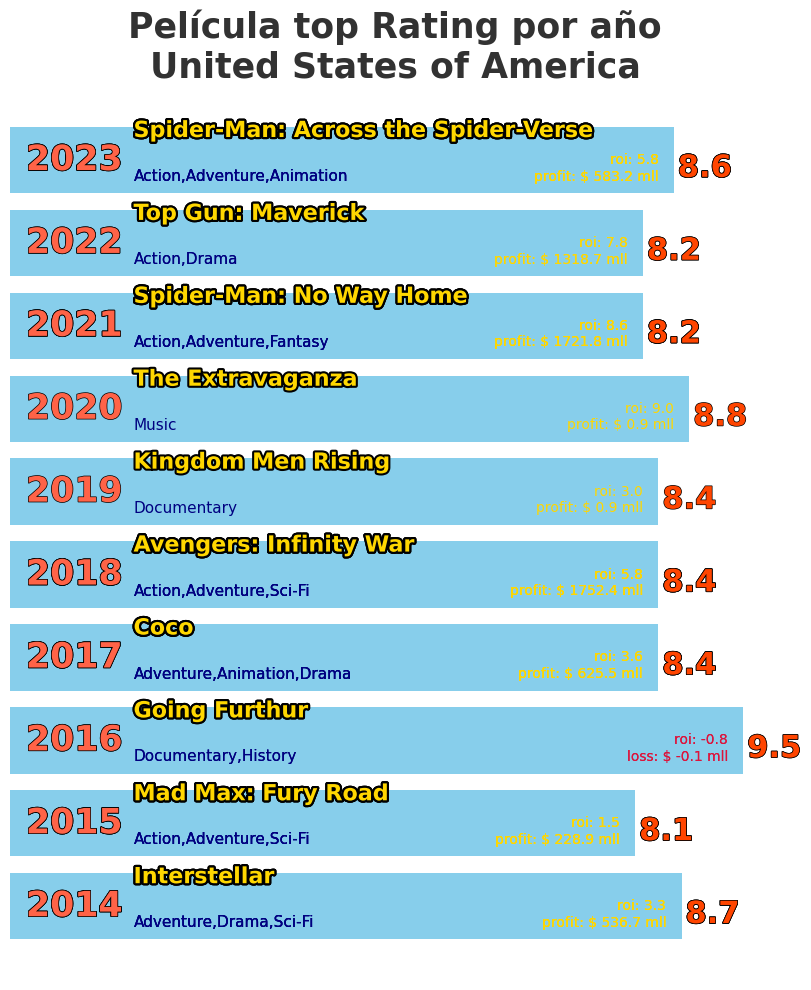

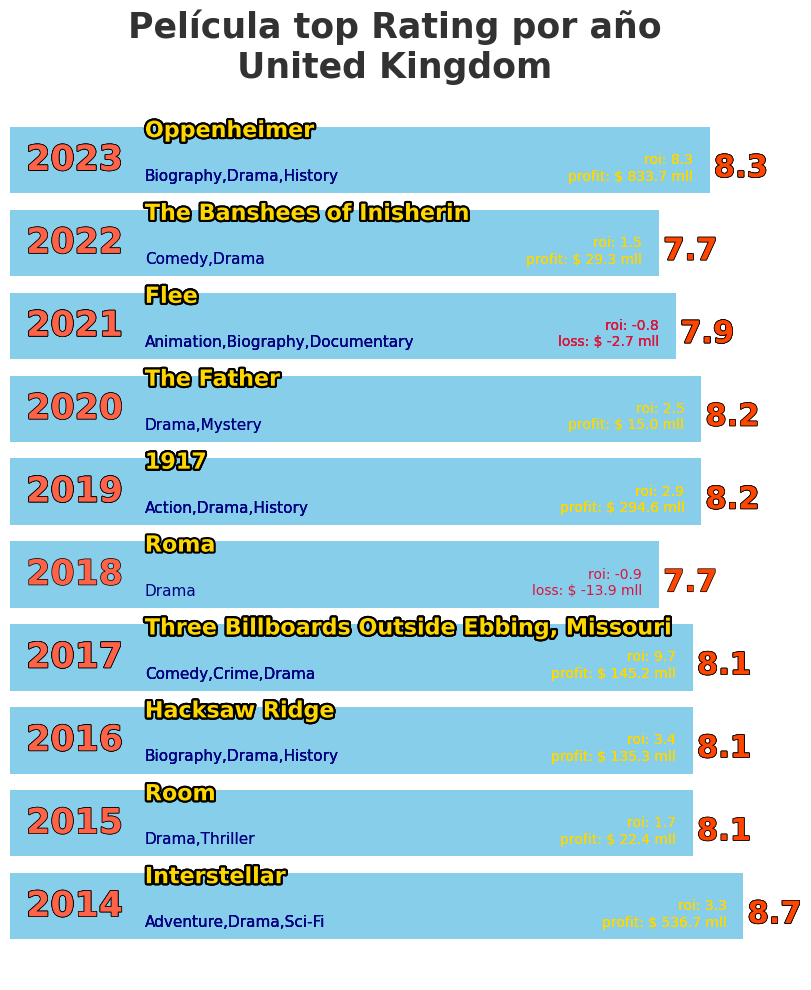

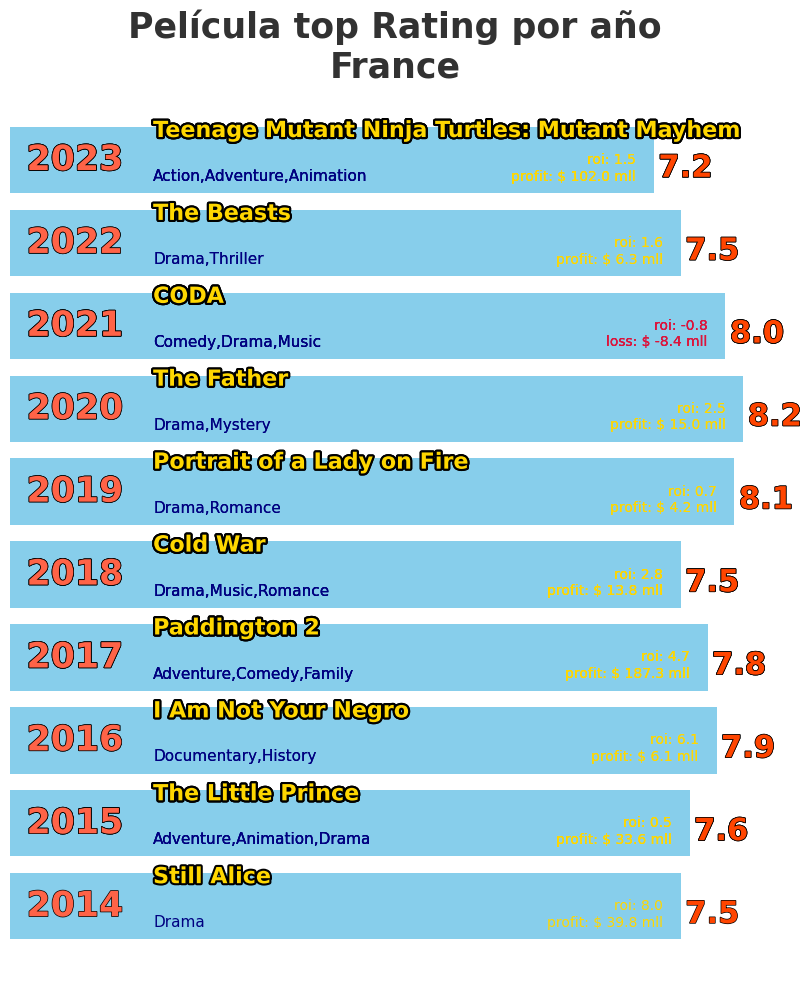

In [59]:
import matplotlib.patheffects as patheffects

df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df = df[df['profit']!=0]

# Explode en la columna 'genres'
df = df.assign(genre=df['genres_x'].str.split(',')).explode('genre')

# Explode en la columna 'production_countries'
df = df.assign(production_countries=df['production_countries'].str.split(',')).explode('production_countries').copy()
df['production_countries'] = df['production_countries'].str.strip()


def películas_con_mejor_rating(df, country):
    df_country = df[df['production_countries'] == country]
    best_rated = df_country.loc[df_country.groupby('startYear')['averageRating'].idxmax()]
    return best_rated[['startYear', 'primaryTitle', 'averageRating','genres_x','profit','poster_path','roi','numVotes','popularity']]

top_pais=3
top_countries = df['production_countries'].value_counts().nlargest(top_pais).index

results = {country: películas_con_mejor_rating(df, country) for country in top_countries}

### Años ###
initial_year = 2014
final_year = 2023
for country, result in results.items():
    results[country] = result[(result['startYear'] >= initial_year) & (result['startYear'] <= final_year)]

for country, result in results.items():
    plt.figure(figsize=(8, 10),facecolor='none')
    result = result.sort_values('startYear')
    bars = plt.barh(result['startYear'].astype(str), result['averageRating'], color='skyblue')
    plt.title(f'Película top Rating por año\n{country}',fontsize=25,color='#323232',fontweight='bold')
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.box(on=False)
    plt.grid(False)

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().tick_params(axis='y', length=0)

    lista_url=[]
    for bar, title, rating, genre, startYear, profit, roi in zip(bars, result['primaryTitle'], result['averageRating'],result['genres_x'],result['startYear'],result['profit'],result['roi'] ):
        xval = bar.get_width()
        plt.text(xval + 0.05, (bar.get_y() + bar.get_height() / 2)-.1, f'{rating:.1f}', ha='left', va='center',fontsize=22, color='orangered',fontweight='bold',
                path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])

        plt.text(1.6, (bar.get_y() + bar.get_height() / 2)+ .35, f'{title}', ha='left', va='center',fontsize=16, color='gold',fontweight='bold',
                path_effects=[patheffects.withStroke(linewidth=3, foreground='black')]
                 )
        plt.text(0.05, (bar.get_y() + bar.get_height() / 2), f' {startYear}', ha='left', va='center',fontsize=25,color='tomato',fontweight='bold',
                path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)
        plt.text(1.6, (bar.get_y() + bar.get_height() / 2)-.2, f'{genre}', ha='left', va='center',rotation=0,fontsize=11,color='navy')
        plt.text(xval-.2, (bar.get_y() + bar.get_height() / 2)-.2, f'profit: $ {profit/1e6:.1f} mll' if profit >0 else f'loss: $ {profit/1e6:.1f} mll' , ha='right', va='center',rotation=0,fontsize=10,color='gold' if profit >0 else 'crimson')
        plt.text(xval-.2, (bar.get_y() + bar.get_height() / 2), f'roi: {roi:.1f}' if roi >0 else f'roi: {roi:.1f}' , ha='right', va='center',rotation=0,fontsize=10,color='gold' if profit >0 else 'crimson')

    plt.savefig(f'/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/película_top_Rating_x_año_{country}.png', dpi=300, bbox_inches='tight', transparent=True)
    plt.show()


A partir de los datos proporcionados, podemos extraer varias ideas sobre las tendencias y características de las películas de mayor audiencia de los Estados Unidos de América, el Reino Unido y Francia durante la última década. Aquí están los puntos principales:

Estados Unidos de América
Popularidad del género :

Los géneros más comunes de películas altamente calificadas incluyen acción, aventuras, ciencia ficción y drama.
Películas como "Interstellar", "Mad Max: Fury Road", "Avengers: Infinity War" y "Spider-Man: No Way Home" reflejan estos géneros populares.
Rentabilidad :

Las películas con mayores ganancias incluyen "Avengers: Infinity War" (beneficio: 1.752.415.039 dólares), "Spider-Man: No Way Home" (beneficio: 1.721.847.111 dólares) y "Top Gun: Maverick" (beneficio: 1.318.732.821 dólares).
Películas documentales como "Going Furthur" tienen ganancias negativas (-60.000 dólares), lo que indica un menor éxito comercial a pesar de los ratings potencialmente altos.
Retorno de la inversión (ROI) :

Las películas con un alto retorno de la inversión incluyen "Avengers: Infinity War" (ROI: 5,84), "Spider-Man: No Way Home" (ROI: 8,61) y "Top Gun: Maverick" (ROI: 7,758).
Puntuación media :

Películas como "Interstellar" (8,7), "Coco" (8,4) y "Spider-Man: Across the Spider-Verse" (8,6) tienen calificaciones promedio altas.
Reino Unido
Popularidad del género :

Los géneros varían más respecto a Estados Unidos, con una presencia notable de películas de Drama, Biografía y Suspense.
Películas como "Tres vallas publicitarias en las afueras de Ebbing, Missouri", "1917" y "El padre" son destacadas.
Rentabilidad :

Destaca "1917" con una ganancia de 294.638.258 dólares, seguida de "Hacksaw Ridge" ($135.302.354) y "Three Billboards Outside Ebbing, Missouri" ($145.192.031).
Retorno de la inversión :

Películas como "Three Billboards Outside Ebbing, Missouri" (ROI: 9,68) y "The Father" (ROI: 2,506) demuestran retornos significativos.
Puntuación media :

Las películas mejor calificadas incluyen "Interstellar" (8,7), "1917" (8,2) y "Oppenheimer" (8,3).
Francia
Popularidad del género :

El cine francés muestra una fuerte presencia en los géneros Drama, Documental y Animación.
Las películas notables incluyen "Still Alice", "El Principito" y "Retrato de una dama en llamas".
Rentabilidad :

Las mayores ganancias se ven en "Paddington 2" ($187,300,000) y "Teenage Mutant Ninja Turtles: Mutant Mayhem" ($102,000,000).
Algunas películas como "CODA" y "Flee" tuvieron ganancias negativas, lo que indica un potencial atractivo para un nicho o un éxito comercial limitado.
Retorno de la inversión :

Las películas con alto retorno de la inversión incluyen "Still Alice" (ROI: 7,957) y "I Am Not Your Negro" (ROI: 6,125).
Puntuación media :

Películas como "El padre" (8,2) y "Retrato de una dama en llamas" (8,1) están altamente valoradas.
Tendencias generales
Altas calificaciones y popularidad : las películas con calificaciones promedio altas a menudo se correlacionan con una alta popularidad, como se ve con "Spider-Man: Across the Spider-Verse" (popularidad: 512,336) y "Oppenheimer" (popularidad: 463,384).
Ganancias versus calificaciones : algunas películas altamente calificadas no siempre logran altas ganancias, especialmente los documentales y las películas de nicho.
Preferencias de género diversas : Estados Unidos se inclina más hacia géneros de gran éxito como acción y ciencia ficción, mientras que el Reino Unido y Francia muestran una gama más amplia de géneros con un fuerte enfoque en películas dramáticas y documentales.
Estos conocimientos ayudan a comprender la dinámica de la industria cinematográfica en diferentes regiones, destacando las preferencias, el éxito comercial y el reconocimiento de la crítica.

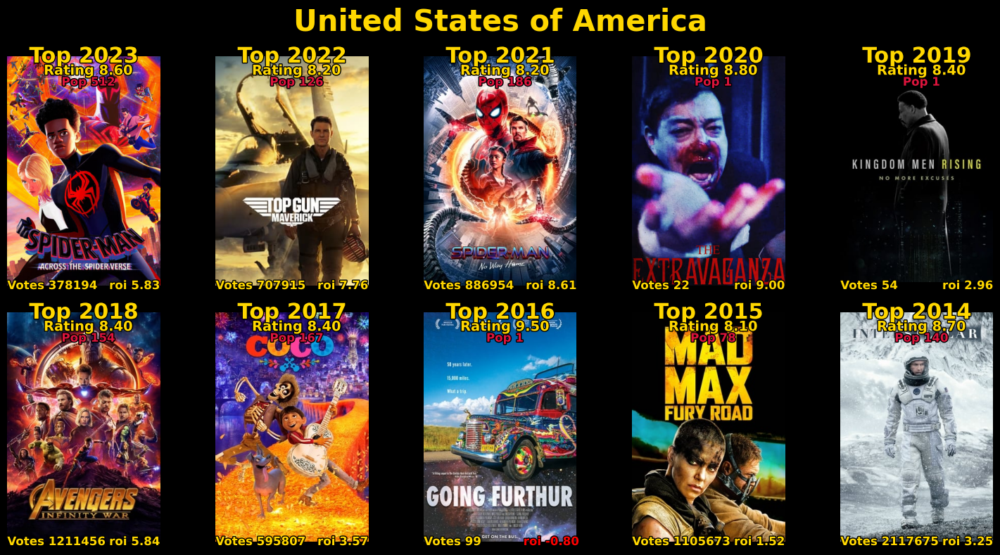

In [123]:
from PIL import Image
import requests
from io import BytesIO
country= 'United States of America'
df_country_01=results[country].drop_duplicates()
df_country_01['poster_path'] = df_country_01['poster_path'].apply(lambda x: f"{path_img}{x}")
df_country_01.sort_values('startYear',ascending=False,inplace=True)
image_urls = list(df_country_01.poster_path)

fig, axes = plt.subplots(2, 5, figsize=(15, 8), facecolor='black', sharex=True, sharey=True)

for idx, (ax, img_url,year,averageRating,roi,numVotes,pop) in enumerate(zip(axes.flatten(), image_urls, df_country_01['startYear'], df_country_01['averageRating'], df_country_01['roi'], df_country_01['numVotes'], df_country_01['popularity']), start=1):
    response = requests.get(img_url)
    img = Image.open(BytesIO(response.content))
    ax.imshow(img)
    ax.axis('off')  # Quitar los ejes para que solo se vea la imagen
    ax.text(150, 0, f'Top {year}', color='gold', fontsize=22, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 28, f'Rating {averageRating:.2f}', color='gold', fontsize=14, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 52, f'Pop {pop:.0f}', color='crimson', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(0, 450, f'Votes {numVotes}', color='gold', fontsize=12, ha='left', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(250, 450, f'roi {roi:.2f}', color='gold' if roi>0 else 'red', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])

fig.suptitle(f'{country}', fontsize=30, color='gold', fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 1])  # Ajustar el rectángulo de dibujo para dejar espacio para el título
plt.savefig(f'/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/movie_country_{country}_img_url.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [249]:
top_countries

Index(['United States of America', 'United Kingdom', 'France'], dtype='object', name='production_countries')

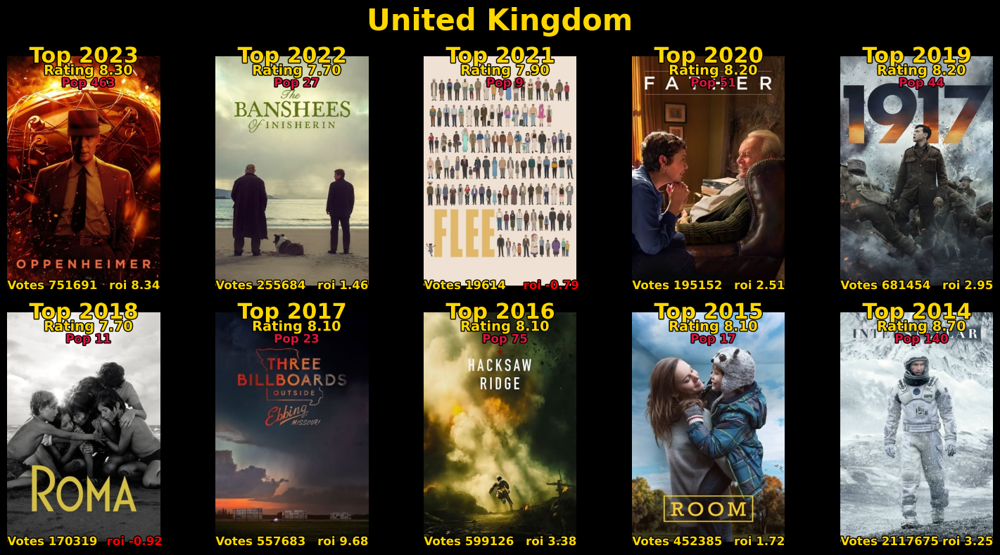

In [126]:
from PIL import Image
import requests
from io import BytesIO

country= 'United Kingdom'
df_country_01=results[country].drop_duplicates()
df_country_01['poster_path'] = df_country_01['poster_path'].apply(lambda x: f"{path_img}{x}")
df_country_01.sort_values('startYear',ascending=False,inplace=True)
image_urls = list(df_country_01.poster_path)

fig, axes = plt.subplots(2, 5, figsize=(15, 8), facecolor='black', sharex=True, sharey=True)

for idx, (ax, img_url,year,averageRating,roi,numVotes,pop) in enumerate(zip(axes.flatten(), image_urls, df_country_01['startYear'], df_country_01['averageRating'], df_country_01['roi'], df_country_01['numVotes'], df_country_01['popularity']), start=1):
    response = requests.get(img_url)
    img = Image.open(BytesIO(response.content))
    ax.imshow(img)
    ax.axis('off')  # Quitar los ejes para que solo se vea la imagen
    ax.text(150, 0, f'Top {year}', color='gold', fontsize=22, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 28, f'Rating {averageRating:.2f}', color='gold', fontsize=14, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(0, 450, f'Votes {numVotes}', color='gold', fontsize=12, ha='left', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(250, 450, f'roi {roi:.2f}', color='gold' if roi>0 else 'red', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 52, f'Pop {pop:.0f}', color='crimson', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])

fig.suptitle(f'{country}', fontsize=30, color='gold', fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 1])  # Ajustar el rectángulo de dibujo para dejar espacio para el título
plt.savefig(f'/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/movie_country_{country}_img_url.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

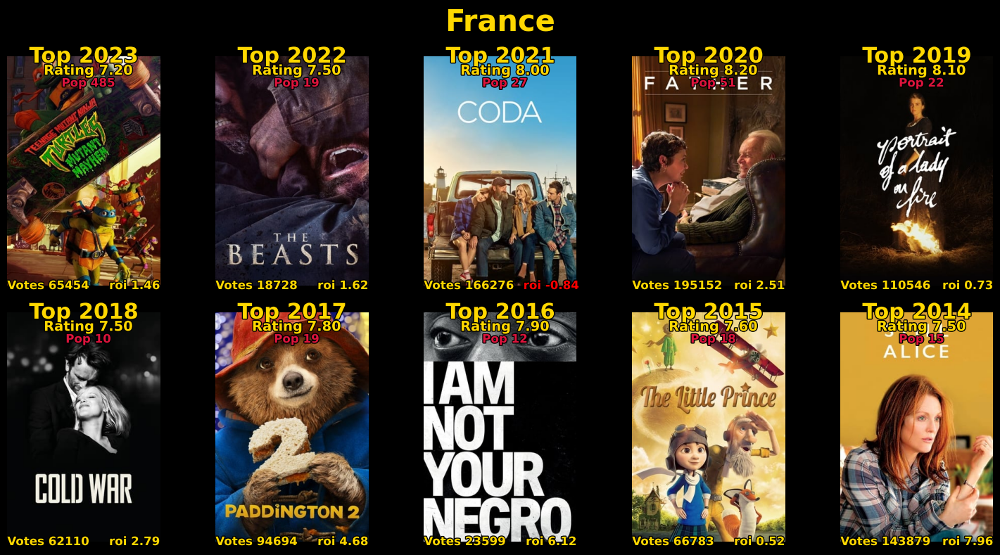

In [127]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.patheffects as patheffects

country = 'France'
df_country_01 = results[country].drop_duplicates()
df_country_01['poster_path'] = df_country_01['poster_path'].apply(lambda x: f"{path_img}{x}")
df_country_01.sort_values('startYear', ascending=False, inplace=True)
image_urls = list(df_country_01.poster_path)

fig, axes = plt.subplots(2, 5, figsize=(15, 8), facecolor='black', sharex=True, sharey=True)

for idx, (ax, img_url,year,averageRating,roi,numVotes,pop) in enumerate(zip(axes.flatten(), image_urls, df_country_01['startYear'], df_country_01['averageRating'], df_country_01['roi'], df_country_01['numVotes'], df_country_01['popularity']), start=1):
    response = requests.get(img_url)
    img = Image.open(BytesIO(response.content))
    ax.imshow(img)
    ax.axis('off')  # Quitar los ejes para que solo se vea la imagen
    ax.text(150, 0, f'Top {year}', color='gold', fontsize=22, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 28, f'Rating {averageRating:.2f}', color='gold', fontsize=14, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(0, 450, f'Votes {numVotes}', color='gold', fontsize=12, ha='left', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(250, 450, f'roi {roi:.2f}', color='gold' if roi > 0 else 'red', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])
    ax.text(159, 52, f'Pop {pop:.0f}', color='crimson', fontsize=12, ha='center', va='center', fontweight='bold',
                             path_effects=[patheffects.withStroke(linewidth=2, foreground='black')])

fig.suptitle(f'{country}', fontsize=30, color='gold', fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 1])  # Ajustar el rectángulo de dibujo para dejar espacio para el título
plt.savefig(f'/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/movie_country_{country}_img_url.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


# Lanzamientos mensuales de géneros de películas - años 2014 al 2023 - top 5 por genre.

In [68]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df.columns

Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes',
       'original_title', 'vote_average', 'release_date', 'revenue', 'runtime',
       'adult', 'backdrop_path', 'budget', 'original_language', 'keywords',
       'popularity', 'poster_path', 'genres_y', 'production_companies',
       'production_countries', 'roi', 'revenue_mll', 'budget_mll'],
      dtype='object')

In [62]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df = df[['tconst', 'titleType', 'originalTitle', 'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes', 'release_date', 'budget', 'revenue', 'production_countries', 'vote_average', 'roi', 'profit', 'poster_path']]

### Años ###
initial_year = 2014
final_year = 2023

df['release_date'] = pd.to_datetime(df['release_date'])
df_filtered = df[(df['release_date'].dt.year >= initial_year) & (df['release_date'].dt.year <= final_year)]

# Explode la columna 'genres_x'
df_exploded = df_filtered.assign(genre=df_filtered['genres_x'].str.split(',')).explode('genre')
df_exploded.drop(columns='genres_x', inplace=True)

# Agregar columnas adicionales para día, semana y mes
df_exploded['day'] = df_exploded['release_date'].dt.day_name()
df_exploded['week'] = df_exploded['release_date'].dt.isocalendar().week
df_exploded['month'] = df_exploded['release_date'].dt.month_name()

# Agrupar por 'month' y 'genre' para contar el número de películas por cada combinación
genre_month_counts = df_exploded.groupby(['month', 'genre']).size().reset_index(name='count')
genre_month_counts.sort_values(by=['month', 'count'], ascending=[True, False], inplace=True)
genre_month_counts.head()

,month,genre,count
7,April,Drama,75
0,April,Action,61
4,April,Comedy,50
5,April,Crime,35
1,April,Adventure,28


In [63]:
# Pivotar el DataFrame para que los géneros sean columnas y los meses sean filas
genre_month_pivot = genre_month_counts.pivot_table(index='genre', columns='month', values='count', fill_value=0)
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
genre_month_pivot = genre_month_pivot[month_order].sort_values('January', ascending=False)
genre_month_pivot

month,January,February,March,April,May,June,July,August,September,October,November,December
genre,,,,,,,,,,,,
Drama,84,113,93,75,84,84,68,95,156,147,110,109
Comedy,69,82,58,50,65,60,69,68,71,74,67,64
Action,65,62,56,61,63,62,66,84,78,57,43,69
Adventure,40,36,53,28,45,48,47,51,49,42,32,56
Thriller,32,32,27,24,28,24,30,34,55,43,25,25
Crime,25,30,27,35,22,40,23,37,44,44,25,25
Mystery,23,28,16,13,15,19,17,13,29,32,11,13
Romance,22,31,10,20,27,17,20,21,36,24,26,16
Horror,18,18,17,15,21,21,19,17,38,40,21,11


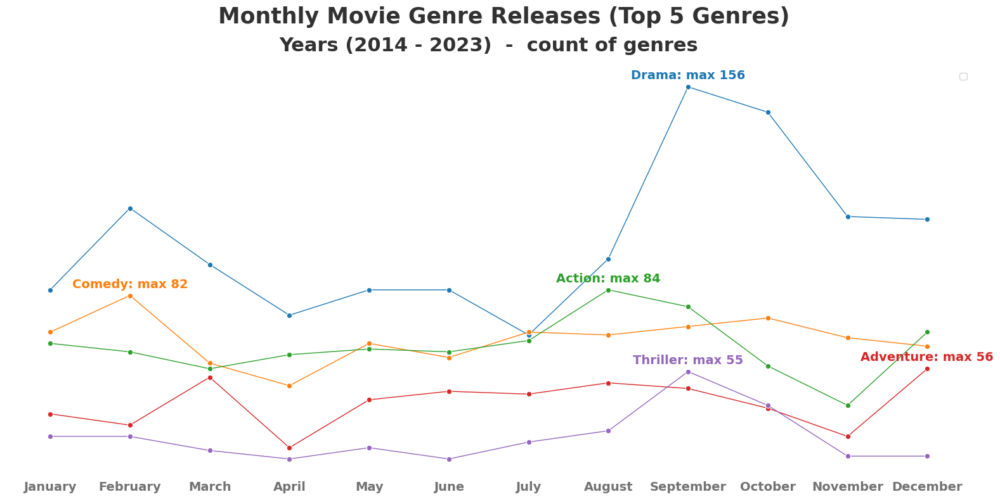

In [113]:
top=5
top_genres = genre_month_pivot.head(top)
top_genres.reset_index(inplace=True)
top_genres_melted = top_genres.melt(id_vars='genre', var_name='month', value_name='count')

plt.figure(figsize=(16, 8),facecolor='none')
sns.lineplot(data=top_genres_melted, x='month', y='count', hue='genre', marker='o',linewidth=1,palette='tab10')

palette = sns.color_palette('tab10', n_colors=top)

for idx, genre in enumerate(top_genres['genre']):
    genre_data = top_genres_melted[top_genres_melted['genre'] == genre]
    max_row = genre_data.loc[genre_data['count'].idxmax()]
    plt.text(max_row['month'], max_row['count']+2, f'{genre}: max {max_row["count"]}',
             color=palette[idx], weight='bold', fontsize=14, ha='center', va='bottom')
plt.xlabel('')
plt.ylabel('')
plt.suptitle(f'Monthly Movie Genre Releases (Top {top} Genres)', fontsize=25, color='#323232',fontweight='bold')
plt.title(f'Years ({initial_year} - {final_year})  -  count of genres', fontsize=22, color='#323232',fontweight='bold',pad=20)

plt.xticks(rotation=0, horizontalalignment='center',fontweight='bold',fontsize=14,color='#737373')
plt.yticks([])
plt.gca().tick_params(axis='x', length=0)

plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.legend([])
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/monthly_movie_genre_releases.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


## Análisis de la gráfica:
La gráfica muestra los cinco géneros con mayor producción según los meses del año entre los años 2014 y 2023.

*   Drama y Thriller: con máximo en Septiembre.
*   Action: máximo en Agosto.
*   Comedy: máximo en Febrero.
*   Adventure: máximo en Diciembre.

Siguiento este análisis podemos visualizar los máximos para cada genero y establecer un calendario de recomendaciones.




Para obtener insights sobre la cantidad de producción de diferentes géneros de películas a lo largo de los meses, podemos analizar algunos patrones y tendencias en los datos proporcionados. Aquí están algunos puntos destacados:

### Producción Mensual por Género
1. **Drama**:
   - Es consistentemente el género más producido a lo largo del año.
   - Picos en septiembre (156), octubre (147) y noviembre (110).

2. **Comedia**:
   - Segundo en producción en la mayoría de los meses.
   - Producción más alta en febrero (82) y baja en marzo (58).

3. **Acción**:
   - Relativamente constante con un pequeño aumento en agosto (84) y disminuciones en octubre (57) y noviembre (43).

4. **Aventura**:
   - Producción más alta en marzo (53) y diciembre (56).
   - Más baja en abril (28).

5. **Thriller**:
   - Aumento notable en septiembre (55) y disminución en los meses de verano (junio, julio).

6. **Crimen**:
   - Producción notablemente alta en septiembre y octubre (44 cada uno).
   - Mayor variabilidad a lo largo del año.

7. **Romance**:
   - Fluctuaciones con picos en septiembre (36) y caídas en marzo (10).

8. **Horror**:
   - Aumento significativo en septiembre (38) y octubre (40).

### Análisis Estacional
- **Meses con Mayor Producción**:
  - Septiembre es el mes con mayor cantidad de producciones en general, con altos números en Drama, Thriller, Crimen, Romance, y Horror.
  - Octubre también muestra una alta producción, especialmente en los géneros de Drama y Crimen.

- **Meses con Menor Producción**:
  - Enero y febrero tienen una producción relativamente baja en muchos géneros, como Western y Sport.

### Tendencias por Estación
- **Primavera (Marzo a Mayo)**:
  - Variedad en la producción con un aumento notable en géneros como Aventura y Crimen en marzo.

- **Verano (Junio a Agosto)**:
  - Producción constante pero con algunos picos en Acción y Drama.

- **Otoño (Septiembre a Noviembre)**:
  - La temporada más productiva, especialmente en géneros como Drama, Thriller, Crimen, y Horror.

- **Invierno (Diciembre a Febrero)**:
  - Menor producción general, aunque con algunos aumentos en géneros específicos como Drama en diciembre y febrero.

### Insights Adicionales
- **Géneros Menos Producidos**:
  - News y Reality-TV tienen prácticamente nula producción.
  - Western tiene producciones muy esporádicas.

- **Géneros con Producción Inconstante**:
  - Musical y Sport tienen producciones muy variables con meses sin producción.

### Resumen
- **Drama y Comedia** son los géneros más producidos en general.
- **Septiembre y Octubre** son los meses más productivos, especialmente para géneros populares como Drama y Crimen.
- **Marzo y diciembre** también destacan para ciertos géneros específicos.
- La producción tiende a ser más alta en el **otoño** y más baja en el **invierno**.

Este análisis permite entender las tendencias de producción de diferentes géneros a lo largo del año y puede ser útil para planificar lanzamientos o estrategias de marketing en la industria cinematográfica.

In [ ]:
genre_month_pivot.head(10)

In [114]:
df= genre_month_pivot.copy()
# Encontrar el mes con el mayor valor para cada género
months = df.idxmax(axis=1)
max_values = df.max(axis=1)

# Combinar el resultado en un DataFrame
result = pd.DataFrame({'month': months, 'value': max_values})
print(result)
print('-'*50)
print(result['month'].value_counts())

                 month  value
genre                        
Drama        September    156
Comedy        February     82
Action          August     84
Adventure     December     56
Thriller     September     55
Crime        September     44
Mystery        October     32
Romance      September     36
Horror         October     40
Sci-Fi         January     15
Fantasy        October     21
Animation         June     21
History      September     20
Family         October     19
Music              May      8
Biography    September     30
Musical      September      5
Sport         November      7
War            October      8
Documentary    October     11
News           October      1
Reality-TV        July      1
Western       December      3
--------------------------------------------------
month
September    7
October      7
December     2
February     1
August       1
January      1
June         1
May          1
November     1
July         1
Name: count, dtype: int64


In [115]:
result.sort_values('month',ascending=False)
result.reset_index(inplace=True)
result.rename(columns={'index':'month'},inplace=True)
result

,genre,month,value
0,Drama,September,156
1,Comedy,February,82
2,Action,August,84
3,Adventure,December,56
4,Thriller,September,55
5,Crime,September,44
6,Mystery,October,32
7,Romance,September,36
8,Horror,October,40
9,Sci-Fi,January,15


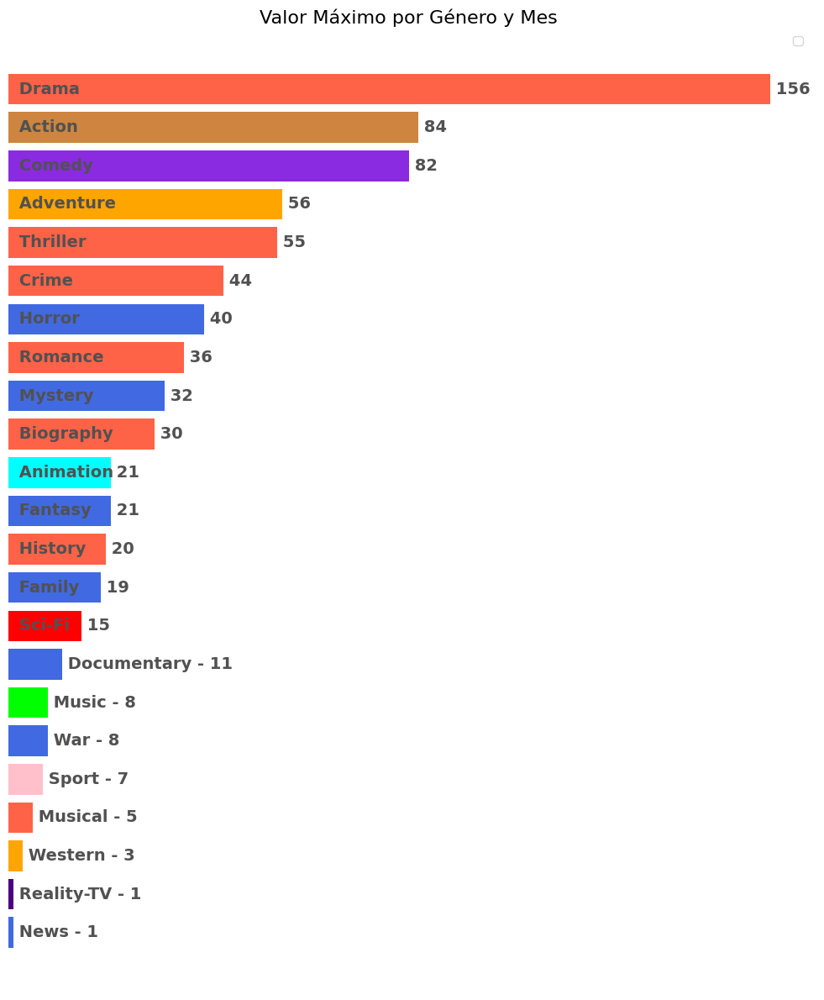

In [118]:
vivid_colors = {
    'January': 'red',
    'February': 'blueviolet',
    'May': 'lime',
    'June': 'aqua',
    'July': 'indigo',
    'August': 'peru',
    'September': 'tomato',
    'October': 'royalblue',
    'November': 'pink',
    'December': 'orange'
}

result = result.sort_values('value', ascending=True)

plt.figure(figsize=(10, 12), facecolor='none')

bars = plt.barh(result.genre, result['value'], color=[vivid_colors[m] for m in result['month']])

plt.title('Valor Máximo por Género y Mes', fontsize=16)
plt.xlabel('', fontsize=12)
plt.ylabel('', fontsize=12)

for i, bar in enumerate(bars):
    width = bar.get_width()
    if width > 14:
        plt.text(1, bar.get_y() + bar.get_height()/2, f' {result["genre"].iloc[i]} ',
             ha='left', va='center', fontsize=14, fontweight='bold',color='#515151')
        plt.text(width, bar.get_y() + bar.get_height()/2, f' {width} ',
             ha='left', va='center', fontsize=14, fontweight='bold',color='#515151')
    else:
        plt.text(width, bar.get_y() + bar.get_height()/2, f' {result["genre"].iloc[i]} - {width} ',
             ha='right' if width > 100 else 'left', va='center', fontsize=14, fontweight='bold',color='#515151')

plt.legend([])
plt.xticks([])
plt.yticks([])
plt.box(on=False)
plt.grid(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_genre_max_value.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

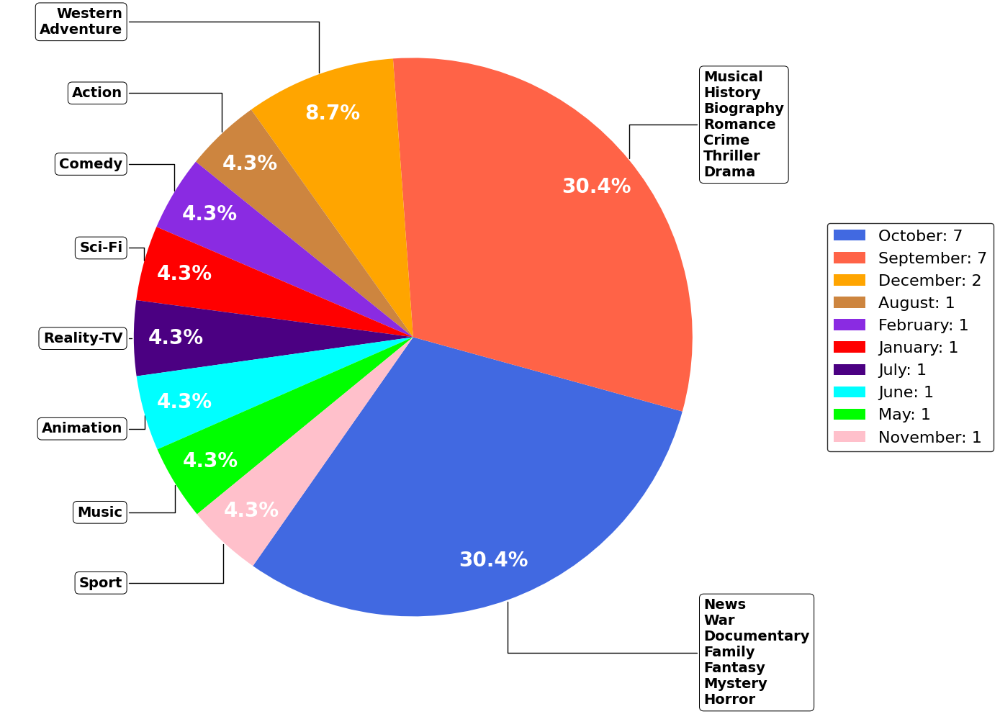

In [119]:
# Gráfica de pastel
df = result.copy()
month_genres = df.groupby('month')['genre'].apply(list)
month_genre_count = df.groupby('month')['genre'].count().sort_values(ascending=False)

plt.figure(figsize=(14, 10), facecolor='none')
pie_colors = [vivid_colors[month] for month in month_genre_count.index]
wedges, texts, autotexts = plt.pie(month_genre_count.values, labels=None, autopct=lambda pct: f'{pct:.1f}%',
                                   pctdistance=.85, startangle=-125, colors=pie_colors)

plt.title('', fontsize=16)
plt.axis('equal')

# Modificar el estilo de los porcentajes
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(20)
    autotext.set_fontweight('bold')

labels = ['\n'.join(genres) for genres in month_genres[month_genre_count.index]]

bbox_props = dict(boxstyle="round,pad=0.3", fc="none", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-", connectionstyle="angle,angleA=0,angleB=90,rad=0"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    plt.annotate(labels[i], xy=(x, y), xytext=(1.04*np.sign(x), 1.2*y),
                 horizontalalignment=horizontalalignment, **kw, fontsize=14, fontweight='bold')

legend_labels = [f"{month}: {count}" for month, count in month_genre_count.items()]
legend = plt.legend(wedges, legend_labels, title="", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize=16)
legend.get_frame().set_facecolor('none')
legend.get_frame().set_edgecolor('black')


plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/pie_chart_genre_distribution.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [121]:
df_merged_basic_rating_tmdb_all.columns

Index(['tconst', 'titleType', 'primaryTitle', 'originalTitle', 'isAdult',
       'startYear', 'runtimeMinutes', 'genres_x', 'averageRating', 'numVotes',
       'original_title', 'vote_average', 'release_date', 'revenue', 'runtime',
       'adult', 'backdrop_path', 'budget', 'original_language', 'keywords',
       'popularity', 'poster_path', 'genres_y', 'production_companies',
       'production_countries', 'roi', 'profit', 'revenue_mll', 'budget_mll'],
      dtype='object')

In [43]:
df_all = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')

top_countries = 16
# Separar los múltiples valores en la columna 'production_companies'
df_tmdb_exploded_countries = df_all.assign(production_companies=df_all['production_companies'].str.split(',')).explode('production_companies').copy()
df_tmdb_exploded_countries['production_companies'] = df_tmdb_exploded_countries['production_companies'].str.strip()

# Agrupar por 'production_companies' y calcular el promedio de 'roi' y el total de registros
df_plot = df_tmdb_exploded_countries.groupby('production_companies').agg({'roi': 'mean', 'production_companies': 'count','profit':'sum', 'averageRating':'mean'})
df_plot.rename(columns={'production_companies': 'company_count'}, inplace=True)
df_plot['profit_Billon'] = df_plot['profit']/1e9
columns=['company_count',	'roi',	'averageRating',	'profit_Billon']
df_plot= df_plot[columns]
df_company_profitMax= df_plot.sort_values(by='profit_Billon', ascending=False).reset_index()
df_company_roiMax= df_plot.sort_values(by='roi', ascending=False).reset_index()

In [45]:
df_company_profitMax.head(20)

,production_companies,company_count,roi,averageRating,profit_Billon
0,Warner Bros. Pictures,607,1.466,6.492,43.196
1,Universal Pictures,544,1.917,6.358,38.374
2,Columbia Pictures,431,1.729,6.370,35.818
3,20th Century Fox,460,1.905,6.337,34.009
4,Paramount,447,1.815,6.451,33.540
5,Walt Disney Pictures,187,1.876,6.452,33.525
6,Marvel Studios,35,3.331,7.157,24.066
7,New Line Cinema,218,1.829,6.194,14.310
8,DreamWorks Pictures,120,1.570,6.680,12.167
9,DreamWorks Animation,44,2.435,6.800,11.651


Para obtener insights de los datos de las compañías de producción cinematográfica en términos de cantidad de películas producidas, retorno sobre la inversión (ROI), calificación promedio y ganancias en billones, podemos analizar algunos patrones y tendencias. A continuación se presentan algunos puntos destacados:

### Producción y Cantidad de Películas
1. **Warner Bros. Pictures**:
   - La compañía con mayor cantidad de producciones (607).
   - ROI: 1.466
   - Calificación promedio: 6.492
   - Ganancias: 43.196 billones

2. **Universal Pictures**:
   - Segunda en cantidad de producciones (544).
   - ROI más alto entre las grandes compañías (1.917).
   - Calificación promedio: 6.358
   - Ganancias: 38.374 billones

3. **Columbia Pictures**:
   - Tercera en cantidad de producciones (431).
   - ROI: 1.729
   - Calificación promedio: 6.370
   - Ganancias: 35.818 billones

4. **20th Century Fox**:
   - Cuarta en cantidad de producciones (460).
   - ROI alto (1.905).
   - Calificación promedio: 6.337
   - Ganancias: 34.009 billones

5. **Paramount**:
   - Quinta en cantidad de producciones (447).
   - ROI: 1.815
   - Calificación promedio: 6.451
   - Ganancias: 33.540 billones

### Rentabilidad y Calidad
1. **Marvel Studios**:
   - ROI más alto (3.331).
   - Calificación promedio alta (7.157).
   - Ganancias significativas (24.066 billones) con solo 35 películas producidas.

2. **Heyday Films**:
   - ROI más alto de todas las compañías (3.652).
   - Calificación promedio más alta (7.292).
   - Ganancias de 11.000 billones con solo 24 películas producidas.

3. **Pixar**:
   - ROI: 2.728
   - Calificación promedio más alta (7.515).
   - Ganancias: 10.707 billones con 26 películas producidas.

4. **Lucasfilm Ltd.**:
   - ROI alto (3.299).
   - Calificación promedio alta (6.768).
   - Ganancias: 8.039 billones con 19 películas producidas.

### Empresas con Ganancias Altas y Calificaciones Sólidas
1. **Walt Disney Pictures**:
   - Ganancias: 33.525 billones.
   - ROI: 1.876
   - Calificación promedio alta (6.452) con 187 películas producidas.

2. **DreamWorks Animation**:
   - ROI alto (2.435).
   - Calificación promedio alta (6.800).
   - Ganancias: 11.651 billones con 44 películas producidas.

3. **Amblin Entertainment**:
   - ROI: 2.571
   - Calificación promedio alta (6.713).
   - Ganancias: 10.743 billones con 70 películas producidas.

### Resumen de Insights
- **Warner Bros. Pictures y Universal Pictures** dominan en cantidad de películas producidas y también tienen un ROI y ganancias significativas.
- **Marvel Studios, Heyday Films, y Pixar** destacan por su alto ROI y calificación promedio alta, lo que indica una excelente calidad de sus producciones y alta rentabilidad.
- **Walt Disney Pictures** y **DreamWorks Animation** combinan una alta calificación promedio con grandes ganancias, aunque tienen menos producciones en comparación con las principales compañías.
- **Lucasfilm Ltd.** y **Amblin Entertainment** también muestran una combinación sólida de ROI alto y calificaciones promedio altas, lo que sugiere una estrategia de producción altamente efectiva.

Estos insights pueden ayudar a entender las estrategias de producción y rentabilidad de las principales compañías cinematográficas y cómo estas se relacionan con la calidad percibida de sus películas.

In [165]:
df_company_profitMax.head(20) #production_companies

,production_companies,company_count,roi,averageRating,profit_Billon
0,Warner Bros. Pictures,607,1.466,6.492,43.196
1,Universal Pictures,544,1.917,6.358,38.374
2,Columbia Pictures,431,1.729,6.370,35.818
3,20th Century Fox,460,1.905,6.337,34.009
4,Paramount,447,1.815,6.451,33.540
5,Walt Disney Pictures,187,1.876,6.452,33.525
6,Marvel Studios,35,3.331,7.157,24.066
7,New Line Cinema,218,1.829,6.194,14.310
8,DreamWorks Pictures,120,1.570,6.680,12.167
9,DreamWorks Animation,44,2.435,6.800,11.651


In [141]:
df_company_roiMax.head(20)

,production_companies,roi,company_count,profit,averageRating
0,Carpe Diem Films,10.000,1,250000,5.600
1,Foster-Brower Productions,9.960,1,33382365,7.300
2,Flet Elektronik (Ses),9.875,1,634000,8.900
3,Aviacsa,9.875,1,19744201,7.100
4,Yeni Stüdyo (Seslendirme),9.875,1,634000,8.900
5,Vipsaş Post Production (HD Restorasyon),9.875,1,634000,8.900
6,Yeni Stüdyo (Renklendirme),9.875,1,634000,8.900
7,Mimeray (Afiş),9.875,1,634000,8.900
8,Shatkon Arts,9.875,1,835400,7.200
9,Electric Shadow Productions,9.860,1,108418501,7.700


In [162]:
top_countries=20
df= df_company_profitMax.head(top_countries).copy()
df.head(1)

,production_companies,company_count,roi,company_count,averageRating,profit_Billon
0,Warner Bros. Pictures,607,1.466,607,6.492,43.196


In [203]:
import plotly.express as px

top_countries=5
df= df_company_profitMax.head(top_countries).copy()

# Crear el gráfico de burbujas
fig = px.scatter(df,
                 x='roi',
                 y='averageRating',
                 size='profit_Billon',
                 color='company_count',
                 hover_name='production_companies',
                 text='production_companies',
                 size_max=80,
                 color_continuous_scale='Viridis')

# Personalizar el diseño
fig.update_layout(
    title='Production Companies: ROI vs Average Rating',
    xaxis_title='Return on Investment (ROI)',
    yaxis_title='Average Rating',
    font=dict(size=12),
    showlegend=False,
    height=800,
    width=1200
)

# Ajustar el texto de las burbujas
fig.update_traces(
    textposition='top center',
    textfont=dict(size=10),
    marker=dict(line=dict(width=1, color='DarkSlateGrey'))
)

# Mostrar el gráfico
fig.show()

# Guardar como HTML interactivo
fig.write_html("production_companies_analysis.html")

# Intentar guardar como imagen PNG
try:
    fig.write_image("production_companies_analysis.png", scale=2)
    print("Imagen PNG guardada con éxito.")
except Exception as e:
    print(f"No se pudo guardar la imagen PNG: {e}")
    print("Intente instalar kaleido con: pip install -U kaleido")

No se pudo guardar la imagen PNG: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido

Intente instalar kaleido con: pip install -U kaleido


In [171]:
top_countries=20
df= df_company_profitMax.head(top_countries).copy()
df.head(1)

,production_companies,company_count,roi,averageRating,profit_Billon
0,Warner Bros. Pictures,607,1.466,6.492,43.196


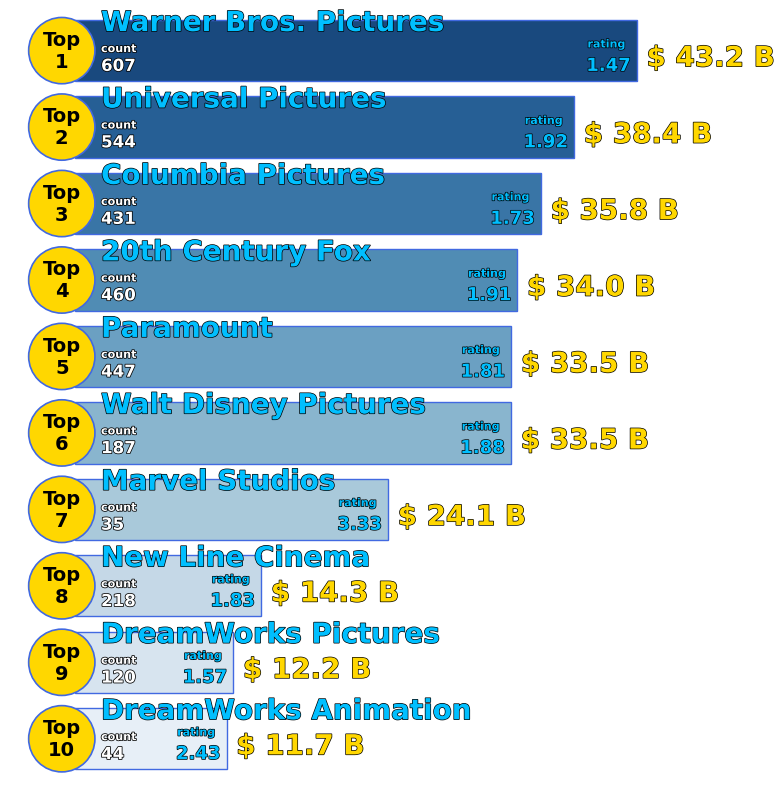

In [225]:
import matplotlib.patheffects as patheffects

top_countries=10
df= df_company_profitMax.head(top_countries).copy()
plt.figure(figsize=(8, 8),facecolor='none')
ax=sns.barplot(data=df, x='profit_Billon', y='production_companies', palette='Blues_r',edgecolor='royalblue', legend=False)
plt.xlabel('')
plt.ylabel('')
# plt.title('Top 10: Companies - Profit (Billon)',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, (company, profit,roi,count) in enumerate(zip(df['production_companies'], df['profit_Billon'],df['roi'],df['company_count'])):
    plt.text(2, i - .36, f'{company}', va='center', ha='left', fontsize=20, color='#00BFFF', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i + .1, f' $ {profit:.1f} B', va='center', ha='left', fontsize=20, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i+.2, f' {str(round(roi, 2))} ', va='center', ha='right',fontsize=13,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i-.08, f'rating   ', va='center', ha='right',fontsize=8,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(2, i-.02, f'count', va='center', ha='left',fontsize=8,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])
    plt.text(2, i+.2, f'{count}', va='center', ha='left',fontsize=12,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])


for index, p in enumerate(ax.patches):
    ax.annotate(f'Top\n{index + 1}',
                xy=(.05, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='black', fontweight='bold',
                bbox=dict(boxstyle="circle,pad=0.65", edgecolor='royalblue', facecolor='gold', lw=1.2))

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.xlim(-5, df['profit_Billon'].max()*1.1)
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_top_companies_profit.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

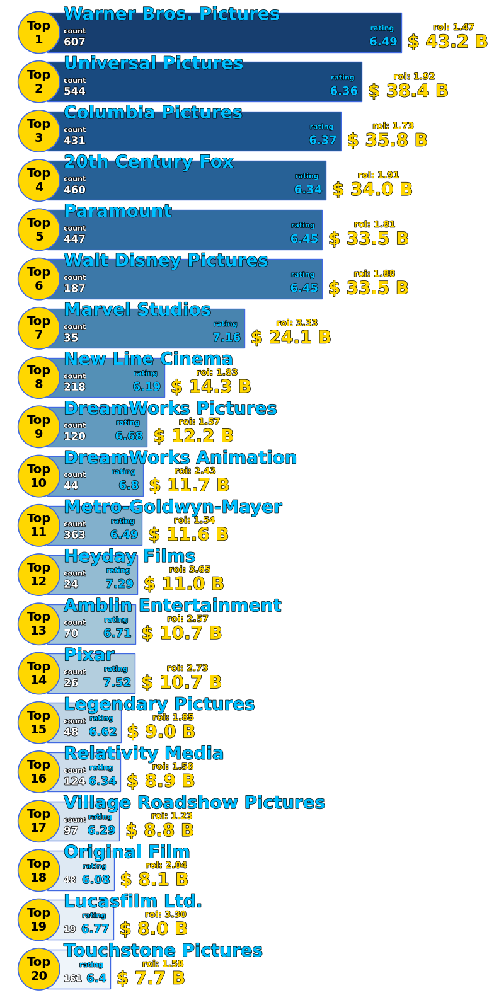

In [52]:
import matplotlib.patheffects as patheffects

top_countries=20
df= df_company_profitMax.head(top_countries).copy()
plt.figure(figsize=(8, 16),facecolor='none')
ax=sns.barplot(data=df, x='profit_Billon', y='production_companies', palette='Blues_r',edgecolor='royalblue', legend=False)
plt.xlabel('')
plt.ylabel('')
# plt.title('Top 10: Companies - Profit (Billon)',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, (company, profit,roi,count,rating) in enumerate(zip(df['production_companies'], df['profit_Billon'],df['roi'],df['company_count'],df['averageRating'])):
    plt.text(2, i - .36, f'{company}', va='center', ha='left', fontsize=20, color='#00BFFF', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i + .2, f' $ {profit:.1f} B', va='center', ha='left', fontsize=20, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit+3.5, i - .1, f' roi: {roi:.2f}', va='center', ha='left', fontsize=10, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i+.2, f' {str(round(rating, 2))} ', va='center', ha='right',fontsize=13,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i-.08, f'rating   ', va='center', ha='right',fontsize=8,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])

    plt.text(2, i-.02, f'count' if i+1 < 18 else '', va='center', ha='left',fontsize=8,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])
    plt.text(2, i+.2, f'{count}', va='center', ha='left',fontsize=12  if i+1 < 18 else 10,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])


for index, p in enumerate(ax.patches):
    ax.annotate(f'Top\n{index + 1}',
                xy=(.05, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='black', fontweight='bold',
                bbox=dict(boxstyle="circle,pad=0.65", edgecolor='royalblue', facecolor='gold', lw=1.2))

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.xlim(-5, df['profit_Billon'].max()*1.1)
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_top20_companies_profit.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

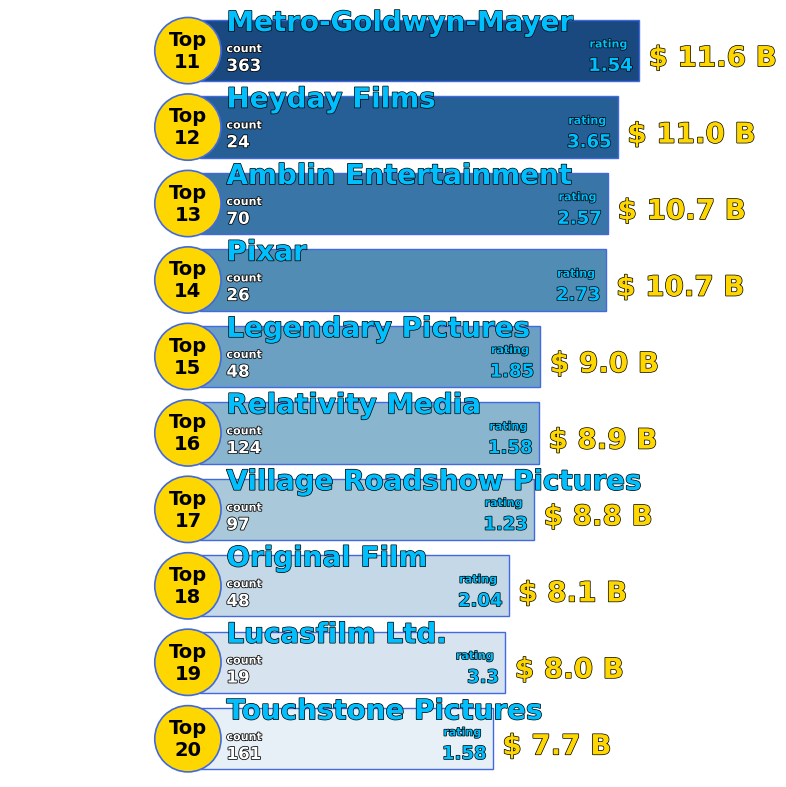

In [233]:
import matplotlib.patheffects as patheffects

top_countries=10
df= df_company_profitMax[10:20].copy()
plt.figure(figsize=(8, 8),facecolor='none')
ax=sns.barplot(data=df, x='profit_Billon', y='production_companies', palette='Blues_r',edgecolor='royalblue', legend=False)
plt.xlabel('')
plt.ylabel('')
# plt.title('Top 10: Companies - Profit (Billon)',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, (company, profit,roi,count) in enumerate(zip(df['production_companies'], df['profit_Billon'],df['roi'],df['company_count'])):
    plt.text(.7, i - .36, f'{company}', va='center', ha='left', fontsize=20, color='#00BFFF', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i + .1, f' $ {profit:.1f} B', va='center', ha='left', fontsize=20, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i+.2, f' {str(round(roi, 2))} ', va='center', ha='right',fontsize=13,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i-.08, f'rating   ', va='center', ha='right',fontsize=8,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(.7, i-.02, f'count', va='center', ha='left',fontsize=8,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])
    plt.text(.7, i+.2, f'{count}', va='center', ha='left',fontsize=12,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])


for index, p in enumerate(ax.patches):
    ax.annotate(f'Top\n{index + 11}',
                xy=(.05, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='black', fontweight='bold',
                bbox=dict(boxstyle="circle,pad=0.65", edgecolor='royalblue', facecolor='gold', lw=1.2))

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.xlim(-5, df['profit_Billon'].max()*1.1)
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_top20_companies_profit.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [217]:
df.head()

,production_companies,company_count,roi,averageRating,profit_Billon
0,Carpe Diem Films,1,10.000,5.600,0.000
1,Foster-Brower Productions,1,9.960,7.300,0.033
2,Flet Elektronik (Ses),1,9.875,8.900,0.001
3,Aviacsa,1,9.875,7.100,0.020
4,Yeni Stüdyo (Seslendirme),1,9.875,8.900,0.001


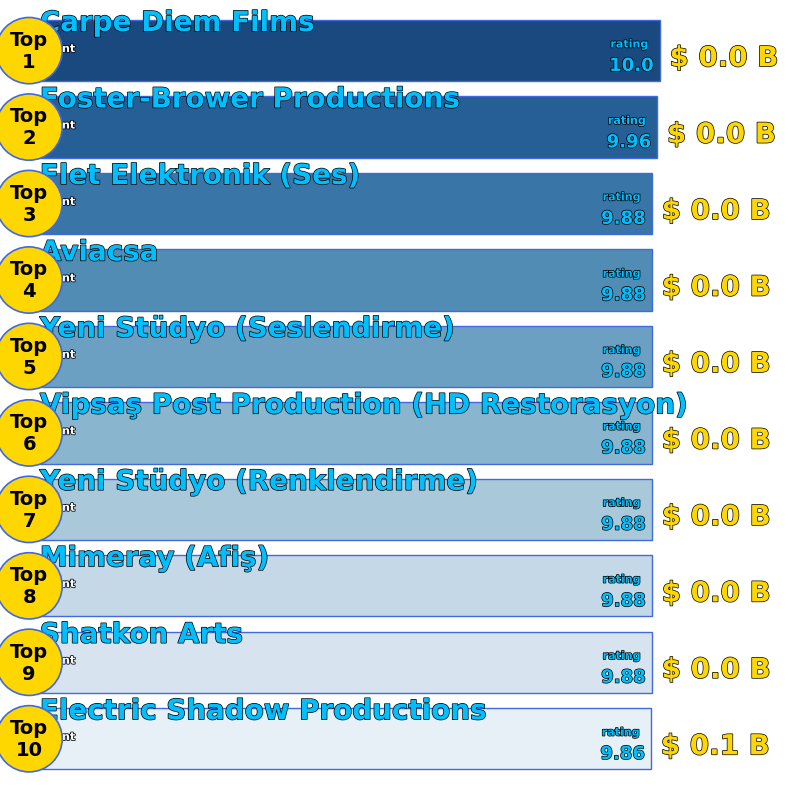

In [220]:
### df_company_roiMax  ###

import matplotlib.patheffects as patheffects

top_countries=10
df= df_company_roiMax.head(top_countries).copy()
plt.figure(figsize=(8, 8),facecolor='none')
ax=sns.barplot(data=df, x='roi', y='production_companies', palette='Blues_r',edgecolor='royalblue', legend=False)
plt.xlabel('')
plt.ylabel('')
# plt.title('Top 10: Companies - Roi Max',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, (company, profit,roi) in enumerate(zip(df['production_companies'], df['profit_Billon'],df['roi'])):
    plt.text(0, i - .36, f'{company}', va='center', ha='left', fontsize=20, color='#00BFFF', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(roi, i + .1, f' $ {profit:.1f} B', va='center', ha='left', fontsize=20, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(roi, i+.2, f' {str(round(roi, 2))} ', va='center', ha='right',fontsize=13,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(roi, i-.08, f'rating   ', va='center', ha='right',fontsize=8,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(0, i-.02, f'count', va='center', ha='left',fontsize=8,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])
    plt.text(0, i+.2, f'{count}', va='center', ha='left',fontsize=12,color='w',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1.1, foreground='black')])


for index, p in enumerate(ax.patches):
    ax.annotate(f'Top\n{index + 1}',
                xy=(.05, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='black', fontweight='bold',
                bbox=dict(boxstyle="circle,pad=0.65", edgecolor='royalblue', facecolor='gold', lw=1.2))

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
# plt.xlim(-5, df['profit_Billon'].max()*1.1)
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_top_companies_roiMax.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [269]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')

# Limpiar el DataFrame y explotar la columna 'keywords'
df_cleaned = df.dropna(subset=['keywords', 'averageRating', 'numVotes', 'profit'])
df_exploded = df_cleaned.assign(keywords=df_cleaned['keywords'].str.split(',')).explode('keywords')

# Agrupar por palabra clave y calcular la calificación promedio, número de películas y profit acumulado
keyword_stats = df_exploded.groupby('keywords').agg({
    'averageRating': 'mean',
    'tconst': 'count',
    'profit': 'sum',
    'roi': 'mean',
}).rename(columns={'tconst': 'count'}).reset_index()

keyword_stats = keyword_stats.sort_values(by='count', ascending=False).head(20)
keyword_stats.sort_values('averageRating', ascending=False, inplace=True)
keyword_stats

,keywords,averageRating,count,profit,roi
1343,biography,7.004,238,6694615499,1.116
1117,based on true story,6.944,318,10551101789,1.379
1107,based on novel or book,6.910,520,28474154960,1.727
4267,england,6.784,216,14912147926,2.108
9053,new york city,6.707,189,9200591210,1.582
8809,musical,6.652,185,13619959030,1.645
7767,love,6.593,225,6294967642,1.686
1951,california,6.579,354,19218937184,1.802
15724,new york city,6.566,279,17566115377,1.582
7705,los angeles,6.527,224,10282809948,1.662


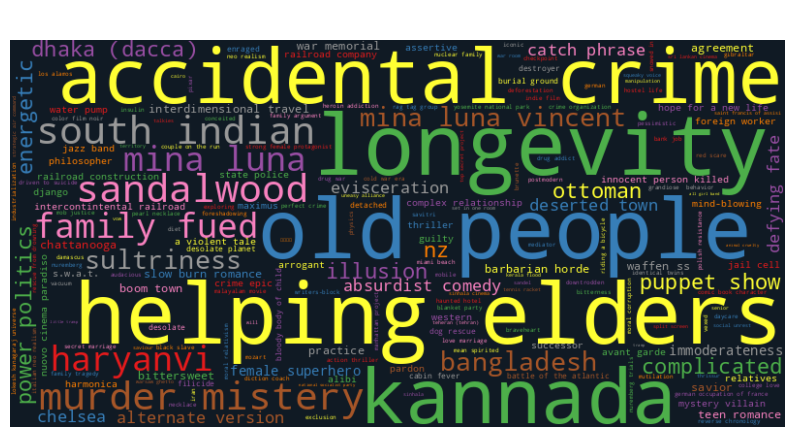

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')

# Limpiar el DataFrame y explotar la columna 'keywords'
df_cleaned = df.dropna(subset=['keywords', 'averageRating', 'numVotes'])
df_exploded = df_cleaned.assign(keywords=df_cleaned['keywords'].str.split(',')).explode('keywords')

# Crear el diccionario de palabras clave y calificación promedio
keywords_rating_dict = df_exploded.groupby('keywords')['averageRating'].mean().to_dict()

# Crear la nube de palabras con formato circular
wordcloud_rating = WordCloud(width=800, height=400, background_color='#101a24',
                             mode='RGBA', colormap='Set1', contour_color='white',
                             contour_width=2, prefer_horizontal=0.9).generate_from_frequencies(keywords_rating_dict)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 10), facecolor='none')
plt.imshow(wordcloud_rating, interpolation='bilinear')
plt.title('Keywords vs Average Rating', fontsize=20, color='white', fontweight='bold')
plt.axis('off')
# plt.savefig("/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_keywords_vs_rating.png", dpi=300, transparent=True)
plt.show()


In [11]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df.head(1)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres_x,averageRating,numVotes,original_title,vote_average,release_date,revenue,runtime,adult,backdrop_path,budget,original_language,keywords,popularity,poster_path,genres_y,production_companies,production_countries,roi,profit,revenue_mll,budget_mll
0,tt0004391,movie,Neptune's Daughter,Neptune's Daughter,0,1914,70,Fantasy,5.700,60,Neptune's Daughter,0.000,1914-04-25,5773000,95,False,NaN,2221000,en,"black and white, underwater, swimming, silent ...",0.896,/fdbrbj9VfYrOMGQQ0vbF4An08Sx.jpg,Fantasy,Universal Film Manufacturing Company,United States of America,1.600,3552000,5,2


In [12]:
df_cleaned.head(1)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,runtimeMinutes,genres_x,averageRating,numVotes,original_title,vote_average,release_date,revenue,runtime,adult,backdrop_path,budget,original_language,keywords,popularity,poster_path,genres_y,production_companies,production_countries,roi,profit,revenue_mll,budget_mll
0,tt0004391,movie,Neptune's Daughter,Neptune's Daughter,0,1914,70,Fantasy,5.700,60,Neptune's Daughter,0.000,1914-04-25,5773000,95,False,NaN,2221000,en,"black and white, underwater, swimming, silent ...",0.896,/fdbrbj9VfYrOMGQQ0vbF4An08Sx.jpg,Fantasy,Universal Film Manufacturing Company,United States of America,1.600,3552000,5,2


In [21]:
df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')

# Limpiar el DataFrame y explotar la columna 'keywords'
df_cleaned = df.dropna(subset=['keywords', 'averageRating', 'numVotes', 'profit'])
df_cleaned['keywords'] = df_cleaned['keywords'].str.strip()  # Eliminar espacios antes de hacer explode
df_exploded = df_cleaned.assign(keywords=df_cleaned['keywords'].str.split(',')).explode('keywords')
df_exploded['keywords'] = df_exploded['keywords'].str.strip()  # Eliminar espacios adicionales después del explode

# Agrupar por palabra clave y calcular la calificación promedio, número de películas y profit acumulado
keyword_stats = df_exploded.groupby('keywords').agg({
    'averageRating': 'mean',
    'tconst': 'count',
    'profit': 'sum',
    'roi': 'mean',
}).rename(columns={'tconst': 'count'}).reset_index()

keyword_stats['profit_Billon'] = keyword_stats['profit'] / 1e9
keyword_stats.sort_values('count', ascending=False, inplace=True)
keyword_stats.head(20)

,keywords,averageRating,count,profit,roi,profit_Billon
1116,based on novel or book,6.764,836,45992039515,1.614,45.992
8837,murder,6.413,491,10383836212,1.361,10.384
14607,woman director,6.276,470,14255426228,0.974,14.255
9147,new york city,6.623,468,26766706587,1.582,26.767
4072,duringcreditsstinger,6.255,409,61386162809,2.216,61.386
1966,california,6.558,400,22580846342,1.826,22.581
11830,sequel,6.035,340,65881955806,2.592,65.882
1126,based on true story,6.948,329,10761952663,1.356,10.762
11115,revenge,6.387,323,15690776627,1.394,15.691
1355,biography,6.971,269,6921011364,1.071,6.921


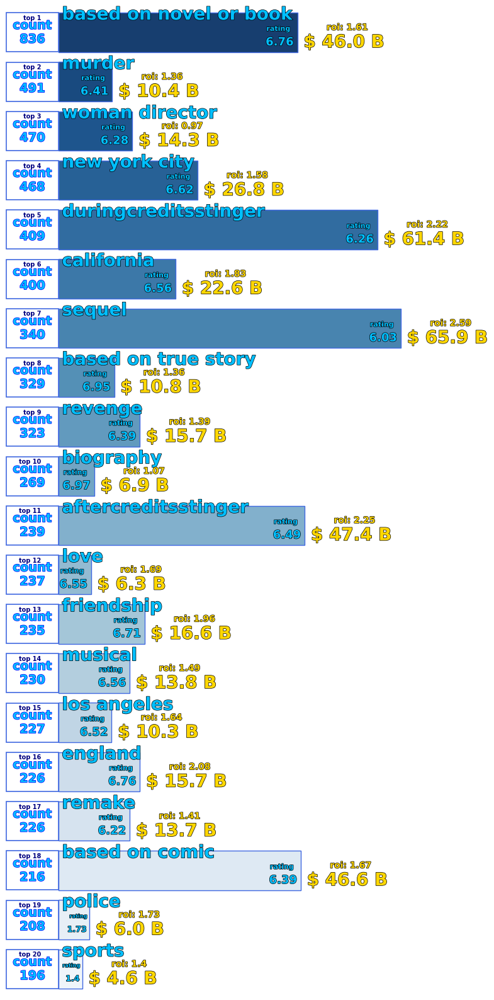

In [53]:
import matplotlib.patheffects as patheffects

top_countries=20
df= keyword_stats.head(top_countries).copy()
plt.figure(figsize=(8, 16),facecolor='none')


ax=sns.barplot(data=df, x='profit_Billon', y='keywords', palette='Blues_r',edgecolor='royalblue', legend=False)
plt.xlabel('')
plt.ylabel('')
# plt.title('Top 10: Companies - Profit (Billon)',fontsize=25,color='#323232',fontweight='bold',pad=20)

for i, (company, profit,roi,rating,count) in enumerate(zip(df['keywords'], df['profit_Billon'],df['roi'],df['averageRating'],df['count'])):
    plt.text(.7, i - .36, f'{company}', va='center', ha='left', fontsize=20, color='#00BFFF', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i + .2, f' $ {profit:.1f} B', va='center', ha='left', fontsize=20, color='gold', fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i-.07, f'rating   ' if count > 210 else 'rating ', va='center', ha='right',fontsize=8 if count >210 else 6,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit, i+.2, f' {str(round(rating, 2))} ' if count > 210 else f'{str(round(roi, 2))} ', va='center', ha='right',fontsize=13 if count >210 else 9,color='#00BFFF',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])
    plt.text(profit+5, i-.1, f' roi: {str(round(roi, 2))}', va='center', ha='left',fontsize=10, color='gold',fontweight='bold', path_effects=[patheffects.withStroke(linewidth=1, foreground='black')])

for i, (p, count) in enumerate(zip(ax.patches, df['count'])):
    ax.annotate(f'count\n{count}',
                xy=(-3.3, p.get_y() + p.get_height() / 2),
                xytext=(-10, 0),
                textcoords='offset points',
                ha='center', va='center',
                fontsize=14, color='#00BFFF', fontweight='bold',
                bbox=dict(boxstyle="square,pad=0.54", edgecolor='royalblue', facecolor='w', lw=1.2),
                path_effects=[patheffects.withStroke(linewidth=1.1, foreground='blue')])
    ax.annotate(f'top {i+1}',
                xy=(-3.3, p.get_y() + p.get_height()/20),
                xytext=(0, 0),
                textcoords='offset points',
                ha='right', va='top',
                fontsize=7, color='navy', fontweight='bold')

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
plt.xlim(-10, df['profit_Billon'].max()*1.1)
plt.tight_layout()
plt.box(on=False)
plt.grid(False)
plt.savefig('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/bar_chart_top20_keyword_count_profit.png', dpi=400, bbox_inches='tight', transparent=True)
plt.show()

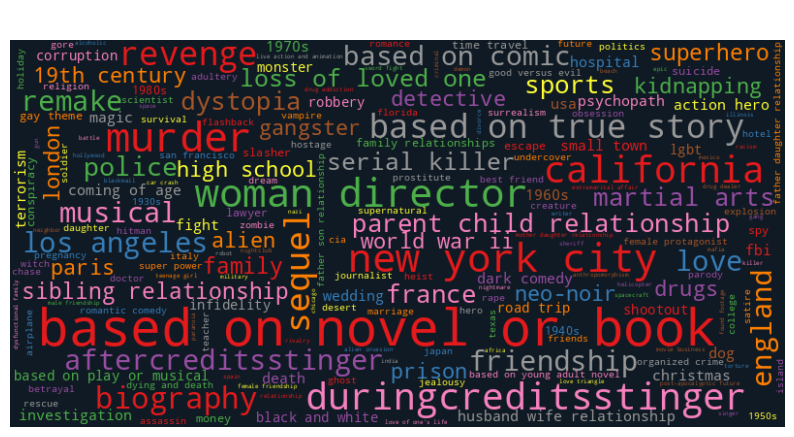

In [54]:
from wordcloud import WordCloud

df = pd.read_csv('/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/df_merged_basic_rating_tmdb_all.csv')
df_cleaned = df.dropna(subset=['keywords', 'averageRating', 'numVotes', 'profit'])
df_exploded = df_cleaned.assign(keywords=df_cleaned['keywords'].str.split(',')).explode('keywords')
df_exploded['keywords'] = df_exploded['keywords'].str.strip()
keywords_count_dict = df_exploded['keywords'].value_counts().to_dict()

wordcloud_rating = WordCloud(width=800, height=400, background_color='#101a24',
                             mode='RGBA', colormap='Set1', contour_color='white',
                             contour_width=2, prefer_horizontal=0.9).generate_from_frequencies(keywords_count_dict)

plt.figure(figsize=(10, 10), facecolor='none')
plt.imshow(wordcloud_rating, interpolation='bilinear')
plt.title('Keywords vs Count', fontsize=20, color='white', fontweight='bold')
plt.axis('off')
# plt.savefig("/content/drive/MyDrive/Bootcamp-Alejo-projects/Movie_Analysis/graficas/wordCloud_keywords_vs_count.png", dpi=300, transparent=True)
plt.show()

Los datos proporcionan insights interesantes sobre las películas basadas en diferentes keywords (palabras clave), evaluadas en términos de calificación promedio, cantidad de películas, ganancias en billones, ROI y ganancia neta. Aquí están algunos puntos destacados:

### Keywords y Insights Principales

1. **Based on Novel or Book**:
   - Calificación promedio: 6.764
   - Cantidad de películas: 836
   - Ganancias: 45.992 billones
   - ROI: 1.614

   Esta keyword muestra una alta calificación promedio y una cantidad significativa de películas producidas, con ganancias sustanciales y un ROI saludable.

2. **Murder**:
   - Calificación promedio: 6.413
   - Cantidad de películas: 491
   - Ganancias: 10.384 billones
   - ROI: 1.361

   Aunque la calificación promedio es algo menor en comparación con otras keywords principales, sigue siendo significativa en términos de ganancias y ROI.

3. **Woman Director**:
   - Calificación promedio: 6.276
   - Cantidad de películas: 470
   - Ganancias: 14.255 billones
   - ROI: 0.974

   Aunque la calificación promedio es más baja, la presencia de directoras es notable, con ganancias considerables pero un ROI más bajo en comparación con otras keywords.

4. **New York City**:
   - Calificación promedio: 6.623
   - Cantidad de películas: 468
   - Ganancias: 26.767 billones
   - ROI: 1.582

   La ciudad de Nueva York como keyword muestra una alta calificación promedio y ganancias sustanciales con un ROI saludable.

5. **Duringcreditsstinger**:
   - Calificación promedio: 6.255
   - Cantidad de películas: 409
   - Ganancias: 61.386 billones
   - ROI: 2.216

   Esta keyword muestra una calificación promedio algo más baja, pero con una cantidad considerable de películas y ganancias enormes, indicando un alto retorno sobre la inversión.

6. **Sequel**:
   - Calificación promedio: 6.035
   - Cantidad de películas: 340
   - Ganancias: 65.882 billones
   - ROI: 2.592

   Aunque la calificación promedio es un poco más baja, las secuelas muestran ganancias masivas y el más alto ROI entre las keywords listadas.

### Conclusiones Generales

- Las keywords relacionadas con secuelas y escenas post-créditos (duringcreditsstinger) destacan por sus altas ganancias y ROI.
- Las películas basadas en novelas o libros muestran una combinación sólida de alta calificación promedio y ganancias considerables.
- La presencia de directoras (woman director) aunque muestra ganancias, tiene un ROI más bajo en comparación con otras keywords.
- Las películas ambientadas en lugares específicos como Nueva York y Los Angeles también muestran ganancias sólidas y altas calificaciones promedio.

Estos insights son útiles para comprender qué tipos de películas son más populares o rentables según diferentes criterios temáticos y cómo estas películas se comparan en términos de rendimiento financiero y crítico.

# Conclusiones:

Basándome en el análisis de los datos proporcionados sobre géneros, compañías de producción y keywords de películas, aquí están las conclusiones finales:

### Géneros de Películas:

1. **Drama** y **Comedia** son consistentemente los géneros más producidos a lo largo del año, con cifras superiores a otras categorías como Acción, Aventura y Thriller.

2. **Acción** y **Aventura** muestran una producción estable a lo largo del año, con picos estacionales que podrían estar influenciados por estrenos importantes o temporadas de vacaciones.

3. **Comedia** y **Drama** mantienen cifras de producción relativamente altas en la mayoría de los meses, sugiriendo una demanda constante en el mercado.

4. Géneros como **Ciencia Ficción**, **Fantasía** y **Animación** muestran variabilidad estacional, posiblemente asociada con estrenos clave o franquicias populares.

### Compañías de Producción:

1. **Warner Bros. Pictures**, **Universal Pictures**, **Columbia Pictures** y **20th Century Fox** son algunas de las principales compañías en términos de cantidad de producciones, ROI y ganancias netas. Estas compañías muestran una capacidad consistente para generar altos ingresos y retornos significativos sobre la inversión.

2. **Marvel Studios** y **Pixar** se destacan por tener los mayores ROI, indicando estrategias de producción altamente eficientes y rentables.

3. La presencia de **New Line Cinema**, **DreamWorks Animation** y **Lucasfilm Ltd.** refleja su impacto en el mercado, con énfasis en franquicias, animación y películas de ciencia ficción.

### Keywords de Películas:

1. Las películas basadas en **secuelas** y con escenas post-créditos (**duringcreditsstinger**) muestran los mayores retornos sobre la inversión (**ROI**), indicando una estrategia exitosa para mantener y expandir audiencias.

2. Las películas basadas en **novelas o libros** tienen una calificación promedio alta y ganancias considerables, destacando la preferencia del público por historias literarias adaptadas.

3. La presencia de **director mujeres** muestra una calificación promedio más baja pero aún así contribuye a la diversidad y riqueza del contenido cinematográfico.

4. Palabras clave como **New York City** y **Los Angeles** están asociadas con ganancias sólidas y calificaciones promedio altas, destacando la influencia de locaciones icónicas en la atracción de audiencias y éxito financiero.

### Conclusiones Generales:

- La industria del cine exhibe una combinación dinámica de géneros, compañías y temas que responden a las preferencias del público y a las estrategias financieras.

- Compañías establecidas como Warner Bros. Pictures y Universal Pictures continúan liderando con grandes volúmenes de producción y retornos financieros robustos.

- Las adaptaciones de libros y secuelas son estrategias efectivas para maximizar ganancias y mantener el interés del público.

- La diversidad en la dirección y las temáticas geográficas contribuye a la riqueza y relevancia cultural del cine contemporáneo.

En resumen, el análisis detallado de géneros, compañías de producción y keywords de películas proporciona una visión completa del panorama cinematográfico actual, destacando las tendencias, estrategias exitosas y áreas de oportunidad en la industria del entretenimiento.

Basándome en el análisis anterior y considerando la consigna de impulsar el rendimiento de una plataforma de streaming para el hogar utilizando datos de tendencias en el sector, aquí están las conclusiones estratégicas:

1. **Enfoque en Géneros Populares**: Dado que Drama y Comedia son consistentemente populares y tienen una alta producción a lo largo del año, la plataforma debería priorizar la adquisición y promoción de contenido en estos géneros. Esto asegura que se satisfaga la demanda constante del público por contenido diverso y emocionalmente atractivo.

2. **Inversión en Grandes Compañías de Producción**: Las compañías como Warner Bros. Pictures, Universal Pictures y Columbia Pictures no solo producen una gran cantidad de contenido, sino que también generan altos retornos financieros y ROI. Establecer asociaciones estratégicas con estas compañías podría garantizar acceso a contenido premium y exclusivo que atraiga a una audiencia global.

3. **Explotar Keywords Estratégicos**: Las películas basadas en secuelas, adaptaciones de novelas o libros, y aquellas con escenas post-créditos son altamente rentables y generan alto ROI. La plataforma puede destacar este tipo de contenido mediante algoritmos de recomendación y campañas de marketing dirigidas, lo que incrementaría la retención de usuarios y suscripciones.

4. **Diversificación Geográfica y Temática**: Aprovechar palabras clave como New York City, Los Angeles, y temas como biografías y deportes puede atraer a audiencias específicas y diversificar la biblioteca de contenido. Esto no solo aumenta la base de usuarios, sino que también mejora la relevancia global de la plataforma.

5. **Innovación en Contenido Original**: Considerando la presencia de Marvel Studios, Pixar y otras compañías innovadoras, la plataforma puede explorar la producción de contenido original exclusivo en colaboración con estudios de renombre. Esto no solo atraerá a suscriptores nuevos y existentes, sino que también diferenciará la oferta de la competencia.

En resumen, impulsar el rendimiento de la plataforma de streaming para el hogar implica capitalizar las tendencias identificadas en géneros populares, compañías de producción exitosas y keywords estratégicas. La combinación de contenido atractivo, asociaciones estratégicas y una presencia global optimizada puede llevar a un aumento significativo en la participación de mercado y el éxito financiero de la plataforma.